In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
!pip install python-docx

In [3]:
!pip install squarify

In [4]:
#Importing required libraries

import pandas as pd, numpy as np
from docx import Document
import calendar, re, squarify, matplotlib
import matplotlib.pyplot as plt, seaborn as sns

#Display all the columns
pd.pandas.set_option('display.max_columns',None)
pd.pandas.set_option('display.max_rows',None)

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics


**#Step 1: Reading the datasets**

In [5]:
# Reading ConsumerElectronics dataset

consumer_elec_df = pd.read_csv("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/ConsumerElectronics.csv")


# Display the first five rows
consumer_elec_df.head()


,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3



As the Media data and other information excel file contains data in different sheets we will be storing each sheet in different dataframe.

In [6]:
# Reading Product List sheetProducts from Media data and other information dataset
prod_list_df = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/Media data and other information.xlsx", sheet_name="Product List", skiprows=1, usecols=range(1,4))

# Renaming the first column
prod_list_df.columns.values[0] = "Products"

# Display first five rows
prod_list_df.head()



,Products,Frequency,Percent
0,\N,5828,0.353464
1,AmplifierReceiver,4056,0.245994
2,AudioMP3Player,112892,6.846819
3,Binoculars,14599,0.885419
4,BoomBox,2879,0.174609


from matplotlib import pyplot as plt
_df_0['Frequency'].plot(kind='hist', bins=20, title='Frequency')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Percent'].plot(kind='hist', bins=20, title='Percent')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('Products').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3.plot(kind='scatter', x='Frequency', y='Percent', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4['Frequency'].plot(kind='line', figsize=(8, 4), title='Frequency')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_5['Percent'].plot(kind='line', figsize=(8, 4), title='Percent')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_6['Products'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_6, x='Frequency', y='Products', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_7['Products'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_7, x='Percent', y='Products', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [7]:

# Reading Media Investment dataset
media_inv_df = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/Media data and other information.xlsx", sheet_name="Media Investment", skiprows=2, usecols=range(1,13))

# Display first five rows
media_inv_df.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [8]:
# Reading Special Sale calendar dataset
spc_sale_calendar = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/Media data and other information.xlsx", sheet_name="Special Sale Calendar", usecols=range(1,3))

# Re naming the first column
spc_sale_calendar.columns.values[0] = "Sale_year"

# Filling the null values of column Sale year with previous value as the next rows represent the same year
spc_sale_calendar["Sale_year"] = spc_sale_calendar["Sale_year"].ffill()

spc_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [9]:
# Reading Monthly NPS score
monthly_nps = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/Media data and other information.xlsx", sheet_name = "Monthly NPS Score")

# Renameing the first column
monthly_nps.columns.values[0] = "Scores"

monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [10]:
# Reading the Product Details word file
document = Document("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/Product Details.docx")


In [11]:
# Converting the document into table
table = document.tables[0]

In [12]:
# Converting the table data to dataframe
data = [[cell.text for cell in row.cells] for row in table.rows]
product_df = pd.DataFrame(data)

# Formating the column names
product_df = product_df.rename(columns=product_df.iloc[0]).drop(product_df.index[0]).reset_index(drop=True)
product_df.head()

,super_category,category,sub_category,vertical
0,CE,Camera,Camera,Camcorders
1,CE,Camera,Camera,DSLR
2,CE,Camera,Camera,Instant Cameras
3,CE,Camera,Camera,Point & Shoot
4,CE,Camera,Camera,SportsAndAction


In [13]:
# Reading the Climate data for 2015

ontario_2015 = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/ONTARIO-2015.xlsx", skiprows=24)
ontario_2015.head()


,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [14]:
# Reading the Climate data

ontario_2016 = pd.read_excel("/content/gdrive/MyDrive/Capstone-Ecommerce_Eleckart/ONTARIO-2016.xlsx", skiprows=24)
ontario_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


So now we have read the following files and stored in dataframes:



1.ConsumerElectronics.csv-consumer_elec_df

2.Product List-prod_list_df

3.Media Investment-media_inv_df

4.Special Sale calendar-spc_sale_calendar

5.Monthly NPS Score - monthly_nps

6.Product Details.docx - product_df

7.ONTARIO-2015.xlsx - ontario_2015

8.ONTARIO-2016.xlsx - ontario_2016





**Data Cleaning, Preparation and Analysis**

In [15]:
#Cleaning consumer_elec_df

consumer_elec_df.shape

(1648824, 20)

In [16]:
consumer_elec_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [17]:
consumer_elec_df.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


In [18]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

**From the above info we can see that there are few columns with invalid data types so we will be inspecting and correcting them.**

In [19]:
# Storing data value in new columns and converting to datetime type
consumer_elec_df["o_date"] = pd.to_datetime(pd.DatetimeIndex(consumer_elec_df.order_date).date)

# Storing time values in new column
consumer_elec_df["o_time"] = pd.DatetimeIndex(consumer_elec_df["order_date"]).time

# Dropping the order_date column
consumer_elec_df.drop("order_date", axis = 1, inplace=True)


In [20]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 21 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   fsn_id                           1648824 non-null  object        
 1   Year                             1648824 non-null  int64         
 2   Month                            1648824 non-null  int64         
 3   order_id                         1648824 non-null  float64       
 4   order_item_id                    1648824 non-null  float64       
 5   gmv                              1648824 non-null  object        
 6   units                            1648824 non-null  int64         
 7   deliverybdays                    1648824 non-null  object        
 8   deliverycdays                    1648824 non-null  object        
 9   s1_fact.order_payment_type       1648824 non-null  object        
 10  sla                           

**As the requirement specifies we need to use the data from July 2015 to June 2016, we will be filtering the data.**

In [21]:
print("Start date :", min(consumer_elec_df.o_date))
print("End date :", max(consumer_elec_df.o_date))

Start date : 2015-05-19 00:00:00
End date : 2016-07-25 00:00:00


In [22]:
consumer_elec_df = consumer_elec_df[(consumer_elec_df["o_date"] >= "2015-07-01") & (consumer_elec_df["o_date"] <= "2016-06-30")]
consumer_elec_df.shape

(1648215, 21)

In [23]:
print("Start date :", min(consumer_elec_df.o_date))
print("End date :", max(consumer_elec_df.o_date))

Start date : 2015-07-01 00:00:00
End date : 2016-06-30 00:00:00


In [24]:
# Inspecting column gmv

consumer_elec_df.gmv.head(10)


0    6400
1    6900
2    1990
3    1690
4    1618
5    3324
6    3695
7    3695
8        
9    3695
Name: gmv, dtype: object

**In column gmv there are few values as spaces. So, we will be checking if any other column has missing values as spaces.**

In [25]:
# Display number of space values in each column

(consumer_elec_df == " ").sum(axis = 0)


fsn_id                                0
Year                                  0
Month                                 0
order_id                              0
order_item_id                         0
gmv                                4904
units                                 0
deliverybdays                         0
deliverycdays                         0
s1_fact.order_payment_type            0
sla                                   0
cust_id                            4904
pincode                            4904
product_analytic_super_category       0
product_analytic_category             0
product_analytic_sub_category         0
product_analytic_vertical             0
product_mrp                           0
product_procurement_sla               0
o_date                                0
o_time                                0
dtype: int64

In [26]:
# Replacing the spaces with null values
consumer_elec_df.gmv = consumer_elec_df.gmv.replace(" ", np.NaN)

# Coverting to numeric type
consumer_elec_df.gmv = pd.to_numeric(consumer_elec_df.gmv)


# Replacing the spaces with null values
consumer_elec_df.cust_id = consumer_elec_df.cust_id.replace(" ", np.NaN)

# Replacing the spaces with null values
consumer_elec_df.pincode = consumer_elec_df.pincode.replace(" ", np.NaN)


# Checking the missing values percentage

round(consumer_elec_df.isnull().sum()/ len(consumer_elec_df)*100,2)


fsn_id                             0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.3
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.3
pincode                            0.3
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
o_date                             0.0
o_time                             0.0
dtype: float64

**As we can see that column gmv, cust_id and pincode has 0.3% of missing values which is very less we will be dropping the missing row.**

In [27]:
consumer_elec_df=consumer_elec_df[~consumer_elec_df["gmv"].isnull()]
consumer_elec_df.shape

(1643311, 21)

In [28]:
 #Display number of space values in each column

print((consumer_elec_df == " ").sum(axis = 0))

# Re-checking the missing values percentage
round(consumer_elec_df.isnull().sum()/ len(consumer_elec_df)*100,2)

fsn_id                             0
Year                               0
Month                              0
order_id                           0
order_item_id                      0
gmv                                0
units                              0
deliverybdays                      0
deliverycdays                      0
s1_fact.order_payment_type         0
sla                                0
cust_id                            0
pincode                            0
product_analytic_super_category    0
product_analytic_category          0
product_analytic_sub_category      0
product_analytic_vertical          0
product_mrp                        0
product_procurement_sla            0
o_date                             0
o_time                             0
dtype: int64


fsn_id                             0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.0
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.0
pincode                            0.0
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
o_date                             0.0
o_time                             0.0
dtype: float64

In [29]:

# Inspecting the delivery days column

consumer_elec_df.deliverybdays.head()

0    \N
1    \N
2    \N
3    \N
4    \N
Name: deliverybdays, dtype: object

**We can see that the delivery days column has "\N" as the values. So, we will be checking the percentage of such values.**

In [30]:
# Inspecting deliverybdays column where value is not equal to "\N"
print(consumer_elec_df.deliverybdays[consumer_elec_df.deliverybdays != r"\N"].head())

invalid_percentage = round(len(consumer_elec_df.deliverybdays[consumer_elec_df.deliverybdays == r"\N"]) / len(consumer_elec_df.deliverybdays) * 100, 2)
print("\nPercentage of invalid values:", invalid_percentage)


706       5
9726      5
11094     4
11693    12
12883     6
Name: deliverybdays, dtype: object

Percentage of invalid values: 79.59


In [31]:


# Inspecting deliverycdays column where value is not equal to "\N"
print(consumer_elec_df.deliverycdays[consumer_elec_df.deliverycdays != "\\N"].head())


invalid_percentage = round(len(consumer_elec_df.deliverycdays[consumer_elec_df.deliverycdays == "\\N"]) / len(consumer_elec_df.deliverycdays) * 100, 2)
print("\nPercentage of invalid values:", invalid_percentage)


706       6
9726      6
11094     5
11693    14
12883     7
Name: deliverycdays, dtype: object

Percentage of invalid values: 79.59


**As the percentage of invalid values are almost 80% we will be imputing those with 0.**

In [32]:
# Replacing the invalid value with 0
consumer_elec_df.deliverybdays = consumer_elec_df.deliverybdays.replace("\\N", 0)

# Coverting to numeric type
consumer_elec_df.deliverybdays = pd.to_numeric(consumer_elec_df.deliverybdays)


# Replacing the invalid value with 0
consumer_elec_df.deliverycdays = consumer_elec_df.deliverycdays.replace("\\N", 0)

# Coverting to numeric type
consumer_elec_df.deliverycdays = pd.to_numeric(consumer_elec_df.deliverycdays)



In [33]:
# Inspecting delivery days columns

print("max deliverybdays :", max(consumer_elec_df.deliverybdays))
print("min deliverybdays :", min(consumer_elec_df.deliverybdays))

print("max deliverycdays :", max(consumer_elec_df.deliverycdays))
print("min deliverycdays :", min(consumer_elec_df.deliverycdays))

print("min sla :", min(consumer_elec_df.sla))
print("max sla :", max(consumer_elec_df.sla))

print("min product_procurement_sla :", min(consumer_elec_df.product_procurement_sla))
print("max product_procurement_sla :", max(consumer_elec_df.product_procurement_sla))


max deliverybdays : 238
min deliverybdays : -98
max deliverycdays : 278
min deliverycdays : -5345
min sla : 0
max sla : 1006
min product_procurement_sla : -1
max product_procurement_sla : 1000


In [34]:
print(consumer_elec_df[consumer_elec_df["deliverybdays"] < 0 ].shape)


(38, 21)


In [35]:
# Filtering records having deliverybdays which are non negative

consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverybdays"] >= 0]



In [36]:
# Inspecting deliverybdays which are negative

print(consumer_elec_df[consumer_elec_df["deliverycdays"] < 0 ].shape)

(1, 21)


In [37]:
# Filtering records having deliverycdays which are non negative

consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverycdays"] >= 0]


In [38]:
# Filetring non negative records from product_procurement_sla  column

consumer_elec_df = consumer_elec_df[~consumer_elec_df["product_procurement_sla"] < 0]



In [39]:
consumer_elec_df.shape

(1567675, 21)

In [40]:
# Coverting the order_id and order_item_id to object type

consumer_elec_df[["order_id","order_item_id"]] = consumer_elec_df[["order_id","order_item_id"]].astype(object)


In [41]:
# Inspecting the categorical columns

categorical_data = consumer_elec_df.select_dtypes(exclude=np.number)
for col in categorical_data.columns:
  if categorical_data[col].nunique() <= 100:
    print(categorical_data[col].value_counts())
    print("---------------------------------------------")


s1_fact.order_payment_type
COD        1133381
Prepaid     434294
Name: count, dtype: int64
---------------------------------------------
product_analytic_super_category
CE    1567675
Name: count, dtype: int64
---------------------------------------------
product_analytic_category
EntertainmentSmall    894093
CameraAccessory       249346
GamingHardware        225864
GameCDDVD             106798
Camera                 91574
Name: count, dtype: int64
---------------------------------------------
product_analytic_sub_category
Speaker                500157
CameraAccessory        231552
GamingAccessory        197559
TVVideoSmall           142478
HomeAudio              120113
AudioMP3Player         111426
Game                   106701
Camera                  91574
GamingConsole           28305
CameraStorage           17794
AudioAccessory          11635
HomeTheatre              4241
AmplifierReceiver        4043
GameMembershipCards        97
Name: count, dtype: int64
--------------------------

There are no duplicate values due to spelling mistake.

As we can see product_analytic_super_category has only one value we will be dropping it as it is the insignificant categorical column

We will also be renaming the column s1_fact.order_payment_type to s1_fact_order_payment_type.

In [42]:
consumer_elec_df.drop(columns="product_analytic_super_category", axis=1, inplace=True)


In [43]:
# Renaming the s1_fact.order_payment_type column

consumer_elec_df.rename(columns={"s1_fact.order_payment_type":"order_payment_type"}, inplace=True)


In [44]:
# Checking if the year o_date is same as the Year

len(consumer_elec_df[consumer_elec_df["Year"] != consumer_elec_df["o_date"].dt.year])


0

In [45]:
# Checking if the year o_date is same as the Year
len(consumer_elec_df[consumer_elec_df["Month"] != consumer_elec_df["o_date"].dt.month])



0

In [46]:
 #Converting the Year column to object type

consumer_elec_df["Year"] = consumer_elec_df["Year"].astype("object")


In [47]:
# Converting the interger type month column to month abrrevation

#consumer_elec_df["Month"] = consumer_elec_df["Month"].apply(lambda x: calendar.month_abbr[x])
#consumer_elec_df.head()

In [48]:
# Inspecting column gmv, units and product_mrp

consumer_elec_df[["gmv","units","product_mrp"]].head()

,gmv,units,product_mrp
0,6400.0,1,7190
1,6900.0,1,7190
2,1990.0,1,2099
3,1690.0,1,2099
4,1618.0,1,2099


In [49]:
# Checking the total percentage of records where value of columns gmv, units and product mrp is 0

round(len(consumer_elec_df[(consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0)]) / len(consumer_elec_df) * 100, 1)


0.1

**As we can see that 0.4% of data contains 0 in column gmv, units and product mrp we will be dropping such rows as these columns cannot be 0.**

In [50]:
# Filtering records having 0 in gmv, units or product mrp columns

consumer_elec_df = consumer_elec_df[~((consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0))]
consumer_elec_df.shape

(1566691, 20)

In [51]:
# Re-checking the total percentage of records where value of columns gmv, units and product mrp is 0

round(len(consumer_elec_df[(consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0)]) / len(consumer_elec_df) * 100, 1)


0.0

**GMV means gross merchandise value or gross merchandise volume, usually referring to the total value of merchandise sold over a given period of time through a customer-to-customer (C2C) exchange site. We will be checking if units*product_mrp is greater than the gmv. As a product can have discount but can't be charge higher price.**

In [52]:
# Checking the total percenatage of records having invalid gmv value

round((consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] < consumer_elec_df["gmv"]].shape[0]) / consumer_elec_df.shape[0]*100,2)


2.0

As we can 2% of data contains invalid gmv value so we will be excluding such records from our analysis.

In [53]:
# Filtering rows having gmv greater than units*product_mrp

consumer_elec_df = consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] >= consumer_elec_df["gmv"]]


In [54]:
consumer_elec_df.shape

(1535391, 20)

In [55]:
# Re-checking the total percenatage of records having invalid gmv value

round((consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] < consumer_elec_df["gmv"]].shape[0]) / consumer_elec_df.shape[0]*100,2)



0.0

In [56]:
# Checking for duplicate data

print(consumer_elec_df.duplicated().value_counts())

print("Percentage of duplicate data", round(consumer_elec_df.duplicated().value_counts()[1]/ consumer_elec_df.shape[0]*100,2))


False    1439490
True       95901
Name: count, dtype: int64
Percentage of duplicate data 6.25


In [57]:
# Dropping the duplicate data

consumer_elec_df.drop_duplicates(keep="first", inplace=True)
consumer_elec_df.shape

(1439490, 20)

# **Feature Engineering**

In [61]:

# Updating the year as 2015 for the week whose week# is 53 but belongs to 2016 for consistency with the other data sets

# Updating the month as 12 for the above rows for consistency

# Dropping rows (less in number) with week# 27 as it belongs to the weeks in June 2015

consumer_elec_df.loc[(consumer_elec_df.Year == '2016') & (consumer_elec_df.week == 53), 'Year'] = '2015'

consumer_elec_df.loc[(consumer_elec_df.Year == '2015') & (consumer_elec_df.week == 53), 'Month'] = 12

consumer_elec_df.drop(consumer_elec_df[consumer_elec_df['week'] == 27].index, inplace = True)


In [62]:

# Creating a new column week_of_day

consumer_elec_df["day_of_week"] = consumer_elec_df["o_date"].dt.weekday


# Creating a new column day

consumer_elec_df["day"] = consumer_elec_df["o_date"].dt.day


In [63]:

consumer_elec_df.head()


,fsn_id,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17


**Creating separate columns for Pay Date (if the first or fifteenth of the month).**

In [64]:
# Creating anew column pay_date

consumer_elec_df['pay_date'] = consumer_elec_df["day"].apply(lambda x : 1 if x in (1,15) else 0)
consumer_elec_df.head()



,fsn_id,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19,0
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20,0
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14,0
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17,0


Creating a separte column holidays by creating a flag as a 0 or 1.
We will get the holiday list for 2015 and 2016 from below links

https://www.officeholidays.com/countries/canada/2015#:~:text=List%20of%20Holidays%20in%20Canada%20in%202015%20,Monday%20in%20February%20%2021%20more%20rows%20

https://www.officeholidays.com/countries/canada/2016#:~:text=List%20of%20Holidays%20in%20Canada%20in%202016%20,Statutory%20holida%20...%20%2023%20more%20rows%20

In [65]:
# Creating list of holidays
list_of_hoilday = ["2015-07-01","2015-07-09","2015-07-13","2015-08-03","2015-08-17","2015-08-07","2015-10-12","2015-11-11","2015-12-25","2015-12-26","2016-01-01","2016-02-08","2016-02-14","2016-02-15","2016-03-25","2016-03-28","2016-04-25","2016-05-08","2016-05-23","2016-06-19","2016-06-21","2016-06-24"]

# Creating new column holidays
consumer_elec_df["holiday"] = consumer_elec_df["o_date"].apply(lambda x : 1 if str(x)[:10] in list_of_hoilday else 0)


# Verifying the holiday column

consumer_elec_df[["o_date", "pay_date", "holiday"]][consumer_elec_df["holiday"]==1].head(10)


,o_date,pay_date,holiday
55,2015-10-12,0,1
77,2015-10-12,0,1
109,2015-10-12,0,1
119,2015-10-12,0,1
183,2015-10-12,0,1
184,2015-10-12,0,1
294,2015-10-12,0,1
334,2015-10-12,0,1
335,2015-10-12,0,1
336,2015-10-12,0,1


In [66]:

consumer_elec_df[consumer_elec_df['o_date'] == "2015-12-27"].iloc[0,-7:]

o_date         2015-12-27 00:00:00
o_time                    19:59:06
week                            52
day_of_week                      6
day                             27
pay_date                         0
holiday                          0
Name: 337640, dtype: object

In [67]:
# Display gmv data distribution

consumer_elec_df["gmv"].describe().apply(lambda x: format(x, 'f'))


count    1421159.000000
mean        2511.328973
std         5674.926808
min           10.000000
25%          349.000000
50%          798.000000
75%         1999.000000
max       226947.000000
Name: gmv, dtype: object

As we can see that gmv value for 75% data is below 2000 we will list the products above 2000 as luxuary products.



In [68]:
# Creating new column luxuary_product

consumer_elec_df["luxuary_product"] = consumer_elec_df["gmv"].apply(lambda x : 1 if x > 2000 else 0)


GMV = Sales Price of products X No of products sold

Therefor, Sales Price = GMV / No of products

In [69]:

# Creating a new column sales_price

consumer_elec_df.insert(7, "sales_price", consumer_elec_df["gmv"]/ consumer_elec_df["units"])


Discount % = mrp price - sales price / mrp price

In [70]:
# Calculating a new column discount percentage

consumer_elec_df.insert(8, "discount", value = round(((consumer_elec_df["product_mrp"] - consumer_elec_df["sales_price"])/ consumer_elec_df["product_mrp"]*100),2))


In [71]:
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19,0,0,1
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20,0,0,0
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14,0,0,0
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17,0,0,0


**Outlier Analysis**

In [72]:

# Filtering the numerical columns

numeric_cols = consumer_elec_df.select_dtypes(include=np.number).columns
numeric_cols = numeric_cols[1:10]
numeric_cols

Index(['gmv', 'units', 'sales_price', 'discount', 'deliverybdays',
       'deliverycdays', 'sla', 'product_mrp', 'product_procurement_sla'],
      dtype='object')

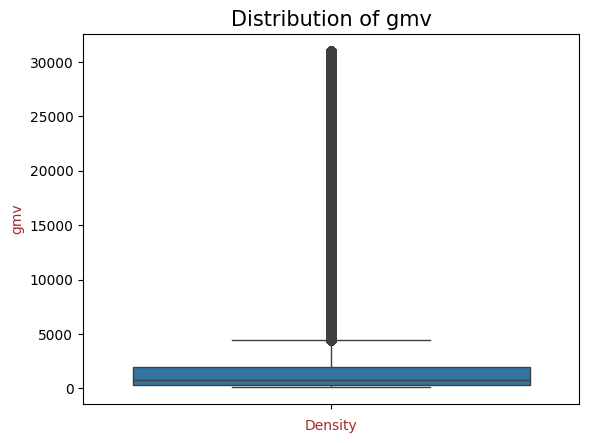

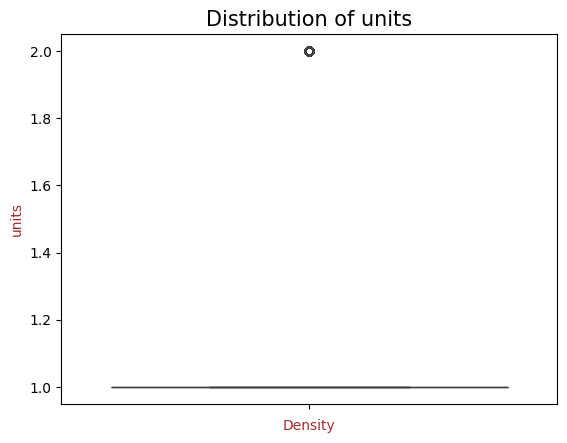

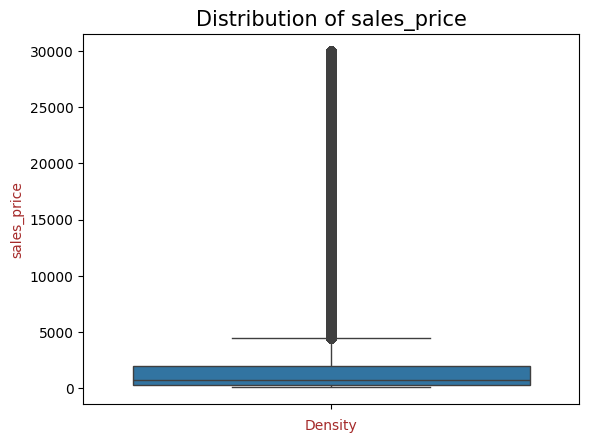

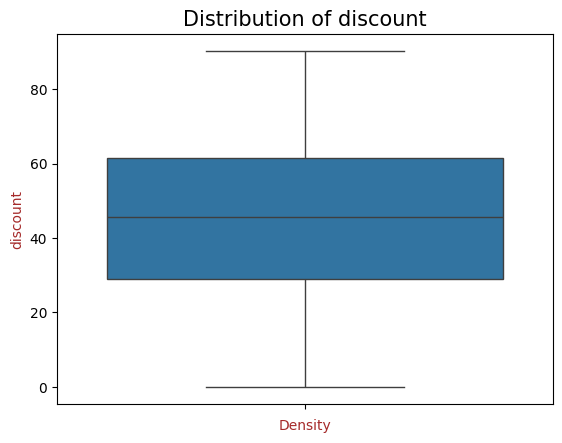

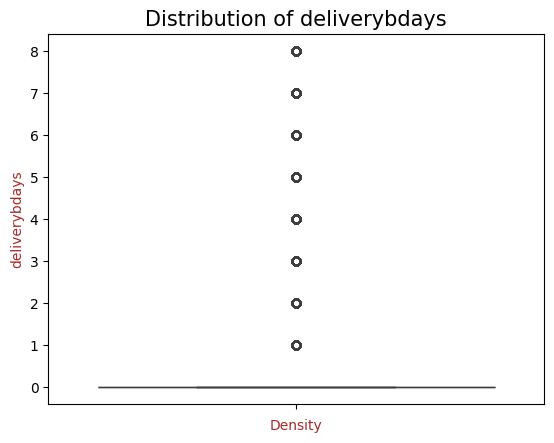

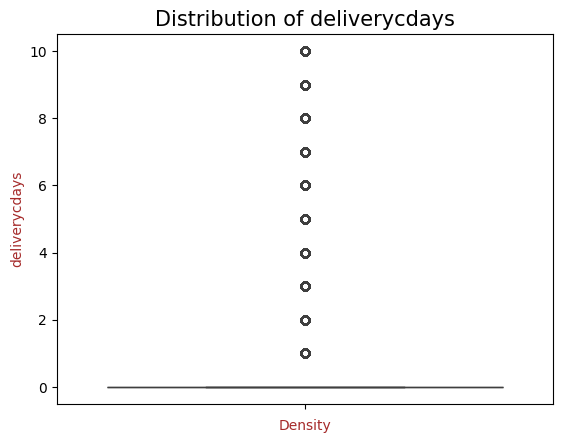

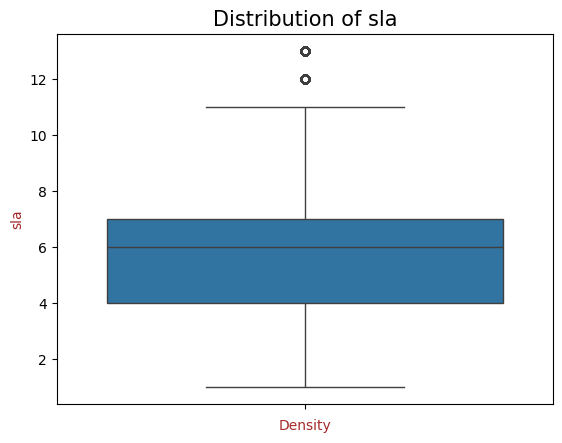

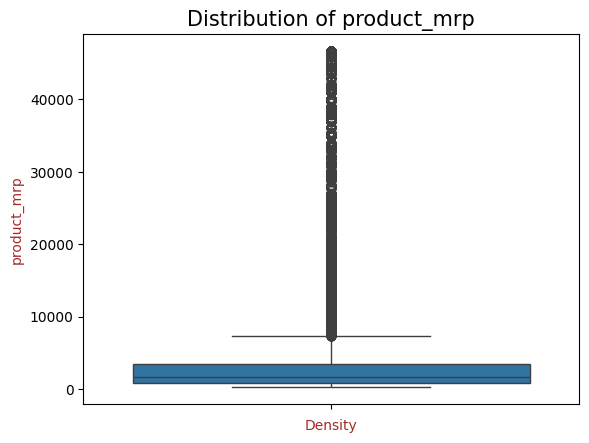

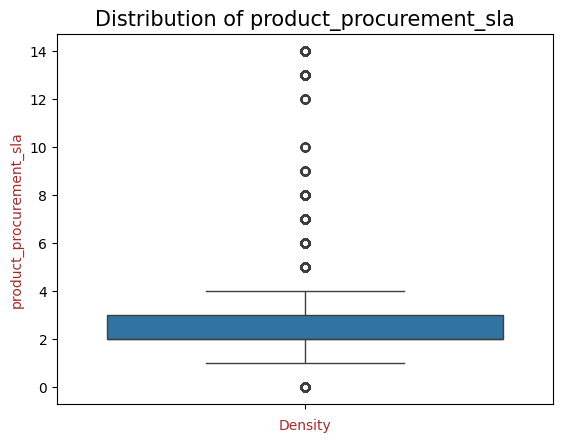

In [80]:
# Plotting a box plot

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.ylabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.xlabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

From above box plots we can see that all the columns except numeric variables are having outlier data.

In [75]:
# Decribing the numeric column ditribution

consumer_elec_df[numeric_cols].describe(percentiles=[.25,.5,.75,.90,.95,.99]).apply(lambda s: s.apply('{0:.5f}'.format))


,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000
mean,2511.32897,1.02124,2478.25438,45.34325,1.04522,1.21734,5.74153,4288.16459,5.59988
std,5674.92681,0.25235,5592.23497,22.16726,2.49430,2.90442,2.99052,8744.33488,53.74646
min,10.00000,1.00000,10.00000,0.00000,0.00000,0.00000,0.00000,49.00000,0.00000
25%,349.00000,1.00000,349.00000,29.11000,0.00000,0.00000,4.00000,899.00000,2.00000
50%,798.00000,1.00000,785.00000,45.67000,0.00000,0.00000,6.00000,1700.00000,2.00000
75%,1999.00000,1.00000,1999.00000,61.59000,0.00000,0.00000,7.00000,3499.00000,3.00000
90%,4399.00000,1.00000,4300.00000,75.02000,5.00000,5.00000,9.00000,7490.00000,5.00000
95%,11990.00000,1.00000,11675.00000,81.45000,6.00000,7.00000,10.00000,19009.00000,5.00000
99%,30999.00000,2.00000,29990.00000,90.25000,8.00000,10.00000,13.00000,46700.00000,14.00000


In [77]:
for col in numeric_cols:
    percentiles = consumer_elec_df[col].quantile([0.01, 0.99]).values
    consumer_elec_df.loc[consumer_elec_df[col] <= percentiles[0], col] = percentiles[0]
    consumer_elec_df.loc[consumer_elec_df[col] >= percentiles[1], col] = percentiles[1]


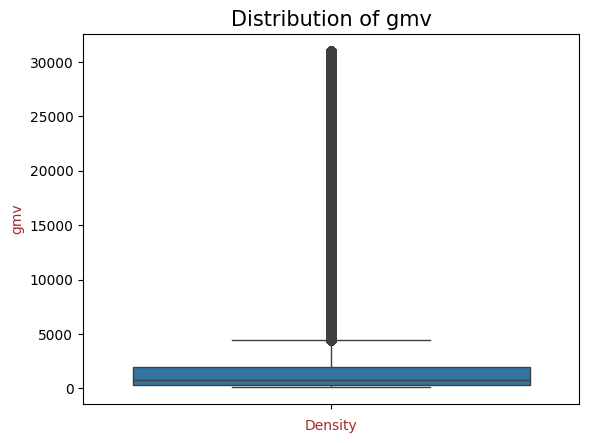

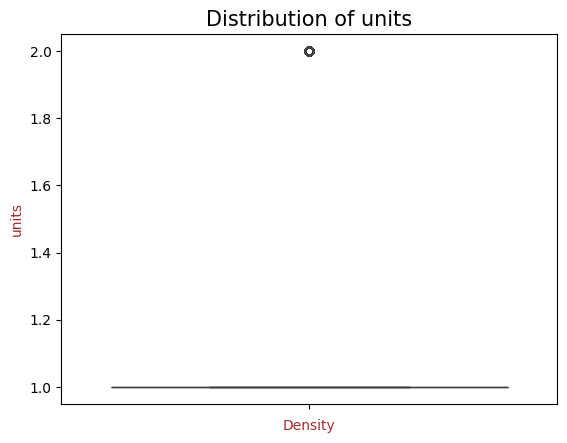

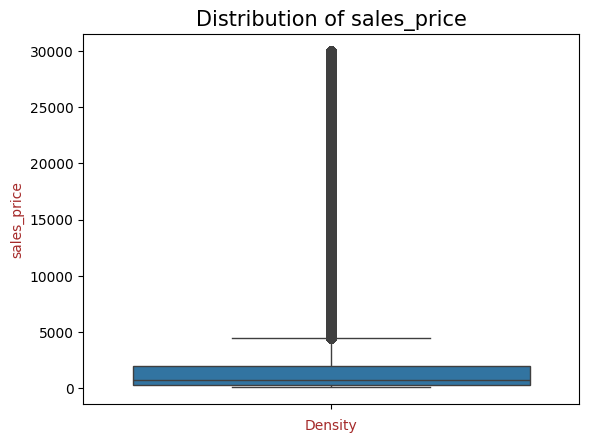

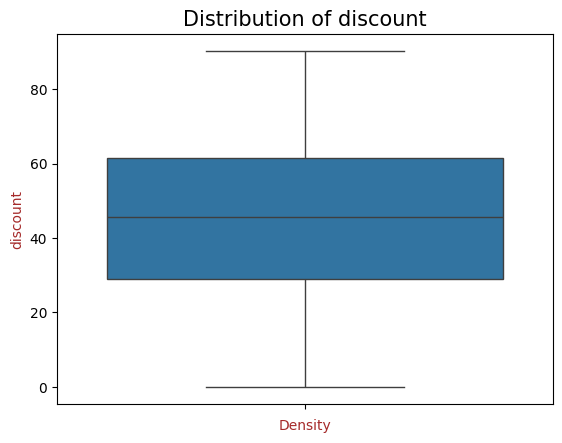

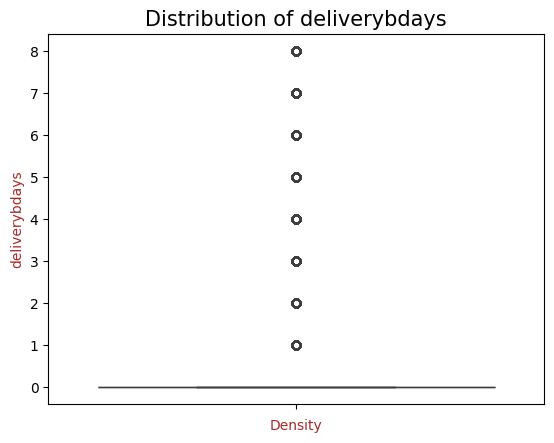

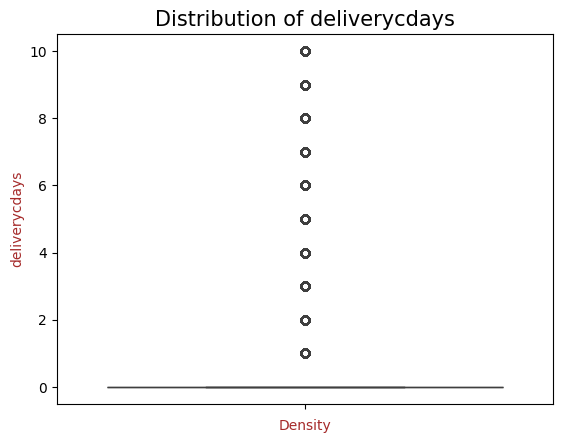

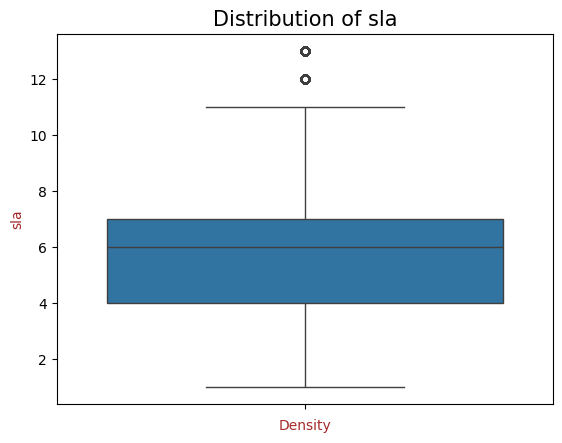

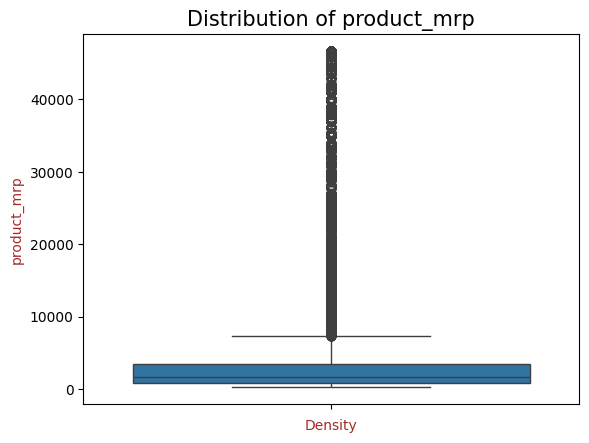

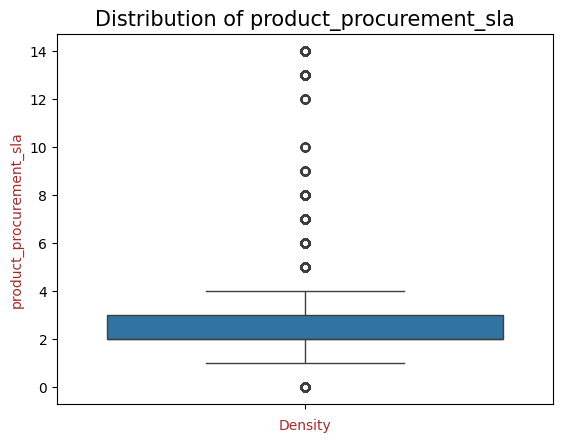

In [79]:
# Plotting a box plot

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.ylabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.xlabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

In [81]:
# Re-checking the numeric column ditribution

consumer_elec_df[numeric_cols].describe(percentiles=[.25,.5,.75,.90,.95,.99]).apply(lambda s: s.apply('{0:.5f}'.format))


,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000,1421159.00000
mean,2451.02266,1.01428,2415.01054,45.29876,1.00634,1.17865,5.72187,4247.79782,2.72675
std,5237.22051,0.11864,5146.34180,22.07071,2.06934,2.43048,2.64926,8406.29850,1.85822
min,139.00000,1.00000,139.00000,0.00000,0.00000,0.00000,1.00000,299.00000,0.00000
25%,349.00000,1.00000,349.00000,29.11000,0.00000,0.00000,4.00000,899.00000,2.00000
50%,798.00000,1.00000,785.00000,45.67000,0.00000,0.00000,6.00000,1700.00000,2.00000
75%,1999.00000,1.00000,1999.00000,61.59000,0.00000,0.00000,7.00000,3499.00000,3.00000
90%,4399.00000,1.00000,4300.00000,75.02000,5.00000,5.00000,9.00000,7490.00000,5.00000
95%,11990.00000,1.00000,11675.00000,81.45000,6.00000,7.00000,10.00000,19009.00000,5.00000
99%,30999.00000,2.00000,29990.00000,90.25000,8.00000,10.00000,13.00000,46700.00000,14.00000


In [82]:
# Creating delivery status column

consumer_elec_df["delivery_time"] = consumer_elec_df["sla"] - (consumer_elec_df["deliverybdays"] + consumer_elec_df["deliverybdays"] + consumer_elec_df["product_procurement_sla"])

consumer_elec_df["delivery_status"] = consumer_elec_df["delivery_time"].apply(lambda x : "Delayed" if x<0 else ("On Time" if x==0 else "Early"))


In [83]:

consumer_elec_df.head()


,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1,5,Early
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19,0,0,1,7,Early
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20,0,0,0,7,Early
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14,0,0,0,1,Early
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17,0,0,0,3,Early


In [84]:
# Saving the roecords having product_analytic_sub_category as CameraAccessory, GamingAccessory and HomeAudio

analysis_df = consumer_elec_df[(consumer_elec_df["product_analytic_sub_category"] == "CameraAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "GamingAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "HomeAudio")]


**Creating a week function**

In [85]:
def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)

        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [86]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [87]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

**Media Investment Cleaning**

In [88]:
#Inspecting media investment dataset

In [89]:
media_inv_df.shape



(16, 12)

In [90]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               12 non-null     float64
 1   Month              12 non-null     float64
 2   Total Investment   12 non-null     float64
 3   TV                 13 non-null     float64
 4   Digital            12 non-null     float64
 5   Sponsorship        12 non-null     float64
 6   Content Marketing  12 non-null     float64
 7   Online marketing   12 non-null     float64
 8    Affiliates        12 non-null     float64
 9   SEM                12 non-null     float64
 10  Radio              3 non-null      float64
 11  Other              3 non-null      float64
dtypes: float64(12)
memory usage: 1.6 KB


In [91]:
media_inv_df

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,2015.0,12.0,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,NaN,NaN
6,2016.0,1.0,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,2016.0,2.0,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN
8,2016.0,3.0,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,2016.0,4.0,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,NaN,NaN


In [92]:
# Dropping the last four rows as they are junk records

media_inv_df = media_inv_df.iloc[:12]


# Converting the Year and Month column to categprical columns

media_inv_df[["Year", "Month"]] = media_inv_df[["Year", "Month"]].astype("int")


media_inv_df.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [93]:
# Checking the null values

media_inv_df.isnull().sum()

Year                 0
Month                0
Total Investment     0
TV                   0
Digital              0
Sponsorship          0
Content Marketing    0
Online marketing     0
 Affiliates          0
SEM                  0
Radio                9
Other                9
dtype: int64

**Column Radio and Other has null values present so we will be imputing them with 0.**

In [94]:
# Imputing the null values with 0

media_inv_df[["Radio", "Other"]] = media_inv_df[["Radio", "Other"]].replace(np.NaN, 0)



In [95]:
# Re-checking the null values

media_inv_df.isnull().sum()


Year                 0
Month                0
Total Investment     0
TV                   0
Digital              0
Sponsorship          0
Content Marketing    0
Online marketing     0
 Affiliates          0
SEM                  0
Radio                0
Other                0
dtype: int64

In [96]:
# Temp DataFrame

temp_media_inv_df = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

temp_media_inv_df.head(2)


,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
# Creating weekly dataset for media investment using the dictionary created for 2015 and 2016

i = 0

for index, row in media_inv_df.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:

            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

    elif row.Year == 2016:

        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:

            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

temp_media_inv_df.head()

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [98]:
# Saving the temp created data in media investment dataset
media_inv_df = temp_media_inv_df

media_inv_df.head()



,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [99]:
# Dropping Day and Date columns as they are no longer needed

media_inv_df.drop(columns=["Year", "Month"], axis=1, inplace=True)


In [100]:

media_inv_df.head()

,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [101]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   week               52 non-null     object
 1   Total Investment   52 non-null     object
 2   TV                 52 non-null     object
 3   Digital            52 non-null     object
 4   Sponsorship        52 non-null     object
 5   Content Marketing  52 non-null     object
 6   Online marketing   52 non-null     object
 7   Affiliates         52 non-null     object
 8   SEM                52 non-null     object
 9   Radio              52 non-null     object
 10  Other              52 non-null     object
dtypes: object(11)
memory usage: 4.6+ KB


In [102]:
# Converting the columns to numeric type

for col in media_inv_df.columns:
  media_inv_df[col] = media_inv_df[col].astype("float64")

media_inv_df["week"] = media_inv_df["week"].astype("int")
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   week               52 non-null     int64  
 1   Total Investment   52 non-null     float64
 2   TV                 52 non-null     float64
 3   Digital            52 non-null     float64
 4   Sponsorship        52 non-null     float64
 5   Content Marketing  52 non-null     float64
 6   Online marketing   52 non-null     float64
 7   Affiliates         52 non-null     float64
 8   SEM                52 non-null     float64
 9   Radio              52 non-null     float64
 10  Other              52 non-null     float64
dtypes: float64(10), int64(1)
memory usage: 4.6 KB


**NPS CLEANING**

In [103]:
monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


As we can see the NPS dataset is in a monthly format we will be converting it into weekly format.

In [104]:
# Taking the transpose of dataset

monthly_nps = monthly_nps.T


# Adding index to new dataframe

monthly_nps.reset_index(drop=False, inplace=True)


# Dropping the first row and re-naming the columns

monthly_nps.drop(monthly_nps.index[0], inplace=True)

monthly_nps.columns = ['Month', 'NPS', 'Stock Index']


# Creating a temporary dataframe

temp_monthly_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'NPS', 'Stock Index'])

temp_monthly_nps.head(1)


,Year,Month,week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN


In [105]:
# Creating weekly data from NPS using the dictionary created for 2015 and 2016

i = 0

for index, row in monthly_nps.iterrows():

    if '15' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2015[month]:

            temp_monthly_nps.iloc[i].Year = 2015
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2016[month]:

            temp_monthly_nps.iloc[i].Year = 2016
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

temp_monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [106]:
# Storing the temporary data into monthly_nps

monthly_nps = temp_monthly_nps
monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [107]:
# Dropping Day and Date columns as they are no longer needed

monthly_nps.drop(columns=["Year", "Month"], axis=1, inplace=True)


monthly_nps.head()

,week,NPS,Stock Index
0,28,54.599588,1177.0
1,29,54.599588,1177.0
2,30,54.599588,1177.0
3,31,54.599588,1177.0
4,32,59.987101,1206.0


In [108]:
monthly_nps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   week         52 non-null     object
 1   NPS          52 non-null     object
 2   Stock Index  52 non-null     object
dtypes: object(3)
memory usage: 1.3+ KB


In [109]:
# Converting the columns to numeric type

for col in monthly_nps.columns:
  monthly_nps[col] = monthly_nps[col].astype("float64")

monthly_nps["week"] = monthly_nps["week"].astype("int")
monthly_nps.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   week         52 non-null     int64  
 1   NPS          52 non-null     float64
 2   Stock Index  52 non-null     float64
dtypes: float64(2), int64(1)
memory usage: 1.3 KB


**Sales data cleaning**

In [110]:
spc_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [111]:
# Converting the column year to int

spc_sale_calendar["Sale_year"] = spc_sale_calendar["Sale_year"].astype("int")


In [112]:
# Separating the dataframe for 2015, 2015-2016 and 2016

spc_sale_calendar_15 = spc_sale_calendar.iloc[:5]
spc_sale_calendar_1516 = spc_sale_calendar.iloc[5]
spc_sale_calendar_16 = spc_sale_calendar.iloc[6:]


In [113]:
# Removing the paranthesis from Sales Calendar column
spc_sale_calendar_15["Sales Calendar"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spc_sale_calendar_15["start_date"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spc_sale_calendar_15["end_date"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])


In [114]:
# Creating a new column Month
spc_sale_calendar_15["Month"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x[-4:].strip())

spc_sale_calendar_15["Month"] = spc_sale_calendar_15["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))


# Creating column start date
spc_sale_calendar_15["start_date"] = spc_sale_calendar_15["Sale_year"].astype("str") + "-" + spc_sale_calendar_15["Month"].astype("str") + "-" + spc_sale_calendar_15["start_date"].astype("str")

# Creating column end date
spc_sale_calendar_15["end_date"] = spc_sale_calendar_15["Sale_year"].astype("str") + "-" + spc_sale_calendar_15["Month"].astype("str") + "-" + spc_sale_calendar_15["end_date"].astype("str")


spc_sale_calendar_15

,Sale_year,Sales Calendar,start_date,end_date,Month
0,2015,18-19th July,2015-7-18,2015-7-19,7
1,2015,15-17th Aug,2015-8-15,2015-8-17,8
2,2015,28-30th Aug,2015-8-28,2015-8-30,8
3,2015,15-17th Oct,2015-10-15,2015-10-17,10
4,2015,7-14th Nov,2015-11-7,2015-11-14,11


In [115]:
# Removing the paranthesis from Sales Calendar column
spc_sale_calendar_16["Sales Calendar"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spc_sale_calendar_16["start_date"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spc_sale_calendar_16["end_date"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])


# Creating a new column Month
spc_sale_calendar_16["Month"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x[-4:].strip())

spc_sale_calendar_16["Month"] = spc_sale_calendar_16["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))


# Creating column start date
spc_sale_calendar_16["start_date"] = spc_sale_calendar_16["Sale_year"].astype("str") + "-" + spc_sale_calendar_16["Month"].astype("str") + "-" + spc_sale_calendar_16["start_date"].astype("str")

# Creating column end date
spc_sale_calendar_16["end_date"] = spc_sale_calendar_16["Sale_year"].astype("str") + "-" + spc_sale_calendar_16["Month"].astype("str") + "-" + spc_sale_calendar_16["end_date"].astype("str")


spc_sale_calendar_16


,Sale_year,Sales Calendar,start_date,end_date,Month
6,2016,20-22 Jan,2016-1-20,2016-1-22,1
7,2016,1-2 Feb,2016-2-1,2016-2-2,2
8,2016,20-21 Feb,2016-2-20,2016-2-21,2
9,2016,14-15 Feb,2016-2-14,2016-2-15,2
10,2016,7-9 Mar,2016-3-7,2016-3-9,3
11,2016,25-27 May,2016-5-25,2016-5-27,5


In [118]:
# Inserting 2015-2016 row data
spc_sale_calendar = pd.concat([spc_sale_calendar_15, spc_sale_calendar_16], axis = 0)


# Concatenating the datasets
spc_sale_calendar = pd.DataFrame(np.insert(spc_sale_calendar.values, 5, values=[2015, "(25th Dec'15 - 3rd Jan'16)", "2015-12-15", "2016-1-3", 12], axis=0))



In [120]:
# Adding column names

spc_sale_calendar.columns = ["Sale_year", "Sales Calendar", "start_date", "end_date", "Month"]



In [123]:
# Converting the date columns to date type with error handling
spc_sale_calendar["start_date"] = pd.to_datetime(spc_sale_calendar["start_date"], errors='coerce')
spc_sale_calendar["end_date"] = pd.to_datetime(spc_sale_calendar["end_date"], errors='coerce')

# Check for any conversion errors
if spc_sale_calendar["start_date"].isnull().any() or spc_sale_calendar["end_date"].isnull().any():
    print("Error converting dates. Please check the date format in the input data.")
    print(spc_sale_calendar[spc_sale_calendar["start_date"].isnull() | spc_sale_calendar["end_date"].isnull()])
else:
    print("Date conversion successful.")


Error converting dates. Please check the date format in the input data.
   Sale_year Sales Calendar start_date end_date  Month
6       2016        1-2 Feb 2016-02-01      NaT      2
9       2016        7-9 Mar 2016-03-07      NaT      3


In [125]:

# Assuming spc_sale_calendar is already defined and dates are converted

# Creating start week using isocalendar (since .week is deprecated)
spc_sale_calendar["start_week"] = spc_sale_calendar["start_date"].dt.isocalendar().week

# Calculating number of sale days
spc_sale_calendar["no_of_days"] = (spc_sale_calendar["end_date"] - spc_sale_calendar["start_date"]).dt.days + 1

# Keeping only week and no of sale days columns as final dataframe
spc_sale_calendar = spc_sale_calendar[["start_week", "no_of_days"]]
spc_sale_calendar.rename(columns={"start_week": "week", "no_of_days": "sale_days"}, inplace=True)

print(spc_sale_calendar)


    week  sale_days
0     29        2.0
1     33        3.0
2     35        3.0
3     42        3.0
4     45        8.0
5      3        3.0
6      5        NaN
7      7        2.0
8      6        2.0
9     10        NaN
10    21        3.0
11    52       10.0


In [126]:


spc_sale_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   week       12 non-null     UInt32 
 1   sale_days  10 non-null     float64
dtypes: UInt32(1), float64(1)
memory usage: 284.0 bytes


**Climate 2015 data cleaning**

In [127]:
ontario_2015.head()


,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [128]:


ontario_2015.shape

(365, 27)

In [129]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    int64         
 2   Month                      365 non-null    int64         
 3   Day                        365 non-null    int64         
 4   Data Quality               229 non-null    object        
 5   Max Temp (°C)              216 non-null    float64       
 6   Max Temp Flag              13 non-null     object        
 7   Min Temp (°C)              190 non-null    float64       
 8   Min Temp Flag              39 non-null     object        
 9   Mean Temp (°C)             190 non-null    float64       
 10  Mean Temp Flag             39 non-null     object        
 11  Heat Deg Days (°C)         190 non-null    float64       
 12  Heat Deg

In [130]:
# Inspecting the value counts
single_value_cols = []

for col in ontario_2015.columns:
  if ontario_2015[col].nunique() ==1:
    print(ontario_2015[col].value_counts())
    print("---------------------------------------------")
    single_value_cols.append(col)

single_value_cols.remove("Year")

Year
2015    365
Name: count, dtype: int64
---------------------------------------------
Data Quality
†    229
Name: count, dtype: int64
---------------------------------------------
Max Temp Flag
M    13
Name: count, dtype: int64
---------------------------------------------
Min Temp Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Mean Temp Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Heat Deg Days Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Cool Deg Days Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Total Rain Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Total Snow Flag
T    9
Name: count, dtype: int64
---------------------------------------------
Total Precip Flag
T    12
Name: count, dtype: int64
---------------------------------------------
Snow on Grnd Flag
T    2
Name: count, dtype: int

In [131]:
# Dropping the columns having signle unique value

ontario_2015.drop(columns=single_value_cols, inplace=True)

In [132]:

ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    int64         
 2   Month                      365 non-null    int64         
 3   Day                        365 non-null    int64         
 4   Max Temp (°C)              216 non-null    float64       
 5   Min Temp (°C)              190 non-null    float64       
 6   Mean Temp (°C)             190 non-null    float64       
 7   Heat Deg Days (°C)         190 non-null    float64       
 8   Cool Deg Days (°C)         190 non-null    float64       
 9   Total Rain (mm)            229 non-null    float64       
 10  Total Snow (cm)            229 non-null    float64       
 11  Total Precip (mm)          229 non-null    float64       
 12  Snow on 

In [133]:
# Checking the null value percentage

round(ontario_2015.isnull().sum()/ ontario_2015.shape[0] * 100, 2)



Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Max Temp (°C)                 40.82
Min Temp (°C)                 47.95
Mean Temp (°C)                47.95
Heat Deg Days (°C)            47.95
Cool Deg Days (°C)            47.95
Total Rain (mm)               37.26
Total Snow (cm)               37.26
Total Precip (mm)             37.26
Snow on Grnd (cm)             37.26
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [134]:

# Dropping the columns having all null values

ontario_2015.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)


In [135]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           365 non-null    datetime64[ns]
 1   Year                365 non-null    int64         
 2   Month               365 non-null    int64         
 3   Day                 365 non-null    int64         
 4   Max Temp (°C)       216 non-null    float64       
 5   Min Temp (°C)       190 non-null    float64       
 6   Mean Temp (°C)      190 non-null    float64       
 7   Heat Deg Days (°C)  190 non-null    float64       
 8   Cool Deg Days (°C)  190 non-null    float64       
 9   Total Rain (mm)     229 non-null    float64       
 10  Total Snow (cm)     229 non-null    float64       
 11  Total Precip (mm)   229 non-null    float64       
 12  Snow on Grnd (cm)   229 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory 

In [137]:

# Dropping rows where all the columns have null values
ontario_2015 = ontario_2015.dropna(how="all")

# Ensure "Date/Time" column is in datetime format
ontario_2015["Date/Time"] = pd.to_datetime(ontario_2015["Date/Time"], errors='coerce')

# Creating a new column week using isocalendar
ontario_2015["week"] = ontario_2015["Date/Time"].dt.isocalendar().week

# Filtering records from July to Dec
ontario_2015 = ontario_2015[ontario_2015["Month"] >= 7]
ontario_2015.reset_index(drop=True, inplace=True)

ontario_2015.head()


,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27


In [138]:
print("Min Month : ", ontario_2015["Month"].min())
print("Max Month : ", ontario_2015["Month"].max())


Min Month :  7
Max Month :  12


In [139]:
# Sorting the values by week

ontario_2015.sort_values(by=['week'], ascending = True, inplace = True)


ontario_2015.head(1)

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27


In [140]:


# Creating a weekly data

ontario_2015 = ontario_2015.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

ontario_2015.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,28.0,10.0,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [141]:
# Dropping 27th week data as it belongs to June 2015

ontario_2015.drop(ontario_2015[ontario_2015['week'] == 27].index, inplace = True)


# Checking the null value percentage

round(ontario_2015.isnull().sum()/ ontario_2015.shape[0] * 100, 2)

week                  0.0
Max Temp (°C)         0.0
Min Temp (°C)         0.0
Mean Temp (°C)        0.0
Heat Deg Days (°C)    0.0
Cool Deg Days (°C)    0.0
Total Rain (mm)       0.0
Total Snow (cm)       0.0
Total Precip (mm)     0.0
Snow on Grnd (cm)     0.0
dtype: float64

Now the dataset has no null values and is created with weekly data

**Climate 2016 data cleaning**

In [142]:
ontario_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
ontario_2016.shape

(366, 27)

In [145]:
ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    int64         
 2   Month                      366 non-null    int64         
 3   Day                        366 non-null    int64         
 4   Data Quality               227 non-null    object        
 5   Max Temp (°C)              226 non-null    float64       
 6   Max Temp Flag              1 non-null      object        
 7   Min Temp (°C)              219 non-null    float64       
 8   Min Temp Flag              8 non-null      object        
 9   Mean Temp (°C)             219 non-null    float64       
 10  Mean Temp Flag             8 non-null      object        
 11  Heat Deg Days (°C)         219 non-null    float64       
 12  Heat Deg

In [146]:
# Inspecting the value counts
single_value_cols = []

for col in ontario_2016.columns:
  if ontario_2016[col].nunique() ==1:
    print(ontario_2016[col].value_counts())
    print("---------------------------------------------")
    single_value_cols.append(col)

single_value_cols.remove("Year")

Year
2016    366
Name: count, dtype: int64
---------------------------------------------
Data Quality
†    227
Name: count, dtype: int64
---------------------------------------------
Max Temp Flag
M    1
Name: count, dtype: int64
---------------------------------------------
Min Temp Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Mean Temp Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Heat Deg Days Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Cool Deg Days Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Total Rain Flag
T    3
Name: count, dtype: int64
---------------------------------------------
Total Snow Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Total Precip Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Snow on Grnd Flag
T    6
Name: count, dtype: int64
---

In [147]:
# Dropping the columns having signle unique value

ontario_2016.drop(columns=single_value_cols, inplace=True)


ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    int64         
 2   Month                      366 non-null    int64         
 3   Day                        366 non-null    int64         
 4   Max Temp (°C)              226 non-null    float64       
 5   Min Temp (°C)              219 non-null    float64       
 6   Mean Temp (°C)             219 non-null    float64       
 7   Heat Deg Days (°C)         219 non-null    float64       
 8   Cool Deg Days (°C)         219 non-null    float64       
 9   Total Rain (mm)            227 non-null    float64       
 10  Total Snow (cm)            227 non-null    float64       
 11  Total Precip (mm)          227 non-null    float64       
 12  Snow on 

In [148]:
# Checking the null value percentage

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)


Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Max Temp (°C)                 38.25
Min Temp (°C)                 40.16
Mean Temp (°C)                40.16
Heat Deg Days (°C)            40.16
Cool Deg Days (°C)            40.16
Total Rain (mm)               37.98
Total Snow (cm)               37.98
Total Precip (mm)             37.98
Snow on Grnd (cm)             37.98
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [149]:
# Dropping the columns having all null values

ontario_2016.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)


ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           366 non-null    datetime64[ns]
 1   Year                366 non-null    int64         
 2   Month               366 non-null    int64         
 3   Day                 366 non-null    int64         
 4   Max Temp (°C)       226 non-null    float64       
 5   Min Temp (°C)       219 non-null    float64       
 6   Mean Temp (°C)      219 non-null    float64       
 7   Heat Deg Days (°C)  219 non-null    float64       
 8   Cool Deg Days (°C)  219 non-null    float64       
 9   Total Rain (mm)     227 non-null    float64       
 10  Total Snow (cm)     227 non-null    float64       
 11  Total Precip (mm)   227 non-null    float64       
 12  Snow on Grnd (cm)   227 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory 

In [150]:
# Dropping rows where all the columns are having null value

ontario_2016 = ontario_2016.dropna(how="all")


# Checking the null value percentage

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

Date/Time              0.00
Year                   0.00
Month                  0.00
Day                    0.00
Max Temp (°C)         38.25
Min Temp (°C)         40.16
Mean Temp (°C)        40.16
Heat Deg Days (°C)    40.16
Cool Deg Days (°C)    40.16
Total Rain (mm)       37.98
Total Snow (cm)       37.98
Total Precip (mm)     37.98
Snow on Grnd (cm)     37.98
dtype: float64

In [151]:
ontario_2016.dropna(inplace=True)


# Checking the null value percentage

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

Date/Time             0.0
Year                  0.0
Month                 0.0
Day                   0.0
Max Temp (°C)         0.0
Min Temp (°C)         0.0
Mean Temp (°C)        0.0
Heat Deg Days (°C)    0.0
Cool Deg Days (°C)    0.0
Total Rain (mm)       0.0
Total Snow (cm)       0.0
Total Precip (mm)     0.0
Snow on Grnd (cm)     0.0
dtype: float64

In [153]:
# Ensure "Date/Time" column is in datetime format
ontario_2016["Date/Time"] = pd.to_datetime(ontario_2016["Date/Time"], errors='coerce')

# Creating a new column week using isocalendar
ontario_2016["week"] = ontario_2016["Date/Time"].dt.isocalendar().week

# Filtering records from July to December
ontario_2016 = ontario_2016[ontario_2016["Month"] <= 6]
ontario_2016.reset_index(drop=True, inplace=True)

ontario_2016.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [155]:
print("Min Month : ", ontario_2016["Month"].min())
print("Max Month : ", ontario_2016["Month"].max())

Min Month :  1
Max Month :  6


In [156]:
# Sorting the values by week

ontario_2016.sort_values(by=['week'], ascending = True, inplace = True)


# Creating a weekly data

ontario_2016 = ontario_2016.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

ontario_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
1,2,4.5,-12.0,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333
2,4,5.5,-9.0,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000
3,5,13.0,-5.5,3.200000,14.800000,0.0,3.400000,0.000000,3.400000,0.000000
4,6,5.0,-18.0,-7.266667,25.266667,0.0,0.000000,2.666667,2.666667,2.000000


In [157]:
ontario_2015.shape

(26, 10)

**Now our dataset is clean and created with weekly data. So we will be concatenating the 2015 and 2016 climate datasets.**

In [158]:
climate_2015_2016 = pd.concat([ontario_2015, ontario_2016], axis =0)


climate_2015_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.0,0.280000,0.0


In [159]:
climate_2015_2016.shape

(51, 10)

Data Preparation - Creating dataframes for three different categories


You have to create market mix models for three product subcategories: Camera Accessory, Home Audio, and Gaming Accessory. We will be creating separate dataframes for them.

In [160]:
consumer_elec_df.shape

(1421159, 30)

In [161]:


consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1,5,Early
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19,0,0,1,7,Early
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20,0,0,0,7,Early
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14,0,0,0,1,Early
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17,0,0,0,3,Early


In [162]:
# Dropping some column that are in significant for the analysis

consumer_elec_df.drop(columns=["fsn_id", "order_id", "order_item_id", "cust_id"], inplace=True)


consumer_elec_df.head()

,Year,Month,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,2015,10,6400.0,1,6400.0,10.99,0,0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1,5,Early
1,2015,10,6900.0,1,6900.0,4.03,0,0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,42,0,19,0,0,1,7,Early
2,2015,10,1990.0,1,1990.0,5.19,0,0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,42,1,20,0,0,0,7,Early
3,2015,10,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,41,2,14,0,0,0,1,Early
4,2015,10,1618.0,1,1618.0,22.92,0,0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,41,5,17,0,0,0,3,Early


In [163]:
# Creating a binary variable from order_payment_type
consumer_elec_df["cod"] = consumer_elec_df["order_payment_type"].apply(lambda x: 1 if x == "COD" else 0)

# Dropping column order_payment_type
consumer_elec_df.drop(columns="order_payment_type", axis=1, inplace=True)


# Performing dummy encoding on categorical variable

proddummy_df = pd.get_dummies(consumer_elec_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
proddummy_df.head()

,product_vertical_AudioMP3Player,product_vertical_Binoculars,product_vertical_BoomBox,product_vertical_Camcorders,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_CodeInTheBoxGame,product_vertical_CoolingPad,product_vertical_DJController,product_vertical_DSLR,product_vertical_Dock,product_vertical_DockingStation,product_vertical_ExtensionTube,product_vertical_FMRadio,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_Instant Cameras,product_vertical_JoystickGamingWheel,product_vertical_KaraokePlayer,product_vertical_LaptopSpeaker,product_vertical_Lens,product_vertical_Microphone,product_vertical_MicrophoneAccessory,product_vertical_MobileSpeaker,product_vertical_MotionController,product_vertical_PhysicalGame,product_vertical_Point & Shoot,product_vertical_ReflectorUmbrella,product_vertical_RemoteControl,product_vertical_SelectorBox,product_vertical_SlingBox,product_vertical_Softbox,product_vertical_SoundMixer,product_vertical_SportsAndAction,product_vertical_Strap,product_vertical_TVOutCableAccessory,product_vertical_Teleconverter,product_vertical_Telescope,product_vertical_VideoGlasses,product_vertical_VideoPlayer,product_vertical_VoiceRecorder,product_vertical_\N
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,Fa

In [164]:
# Performing dummy encoding on categorical variable

delydummy_df = pd.get_dummies(consumer_elec_df[['delivery_status']], prefix='delivery_status', drop_first=True)
delydummy_df.head()

,delivery_status_Early,delivery_status_On Time
0,True,False
1,True,False
2,True,False
3,True,False
4,True,False


In [165]:
# Concatenating the dummy variables with consumer dataset
consumer_elec_df = pd.concat([consumer_elec_df, proddummy_df, delydummy_df], axis=1)


# Dropping the columns from consumer_elec_df that have been encoded
consumer_elec_df.drop(columns = ["product_analytic_vertical", "delivery_status"], axis=1, inplace=True)


# Checking the values of product_analytic_sub_category column

consumer_elec_df["product_analytic_sub_category"].value_counts()


product_analytic_sub_category
Speaker                454282
CameraAccessory        209793
GamingAccessory        179898
TVVideoSmall           130326
HomeAudio              104509
AudioMP3Player         101475
Game                    94738
Camera                  86614
GamingConsole           26172
CameraStorage           16222
AudioAccessory           9528
HomeTheatre              4174
AmplifierReceiver        3331
GameMembershipCards        97
Name: count, dtype: int64

In [166]:
# Creating a new datafraem for cameraaccessory

camera_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='CameraAccessory']


# Creating a new dataframe for gamingaccessory

gaming_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='GamingAccessory']


# Creating anew dataframe for homeaudio

home_audio = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='HomeAudio']


# Inspecting the value counts of product_analytic_category and product_analytic_sub_category column for all three dataframes

cat_cols = ["product_analytic_category",	"product_analytic_sub_category"]

for col in cat_cols:
  print("camera_accessory")
  print(camera_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("gaming_accessory")
  print(gaming_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("home_audio")
  print(home_audio[col].value_counts())
  print("-----------------------------------")

camera_accessory
product_analytic_category
CameraAccessory    209793
Name: count, dtype: int64
-----------------------------------
camera_accessory
product_analytic_sub_category
CameraAccessory    209793
Name: count, dtype: int64
-----------------------------------
gaming_accessory
product_analytic_category
GamingHardware    179898
Name: count, dtype: int64
-----------------------------------
gaming_accessory
product_analytic_sub_category
GamingAccessory    179898
Name: count, dtype: int64
-----------------------------------
home_audio
product_analytic_category
EntertainmentSmall    104509
Name: count, dtype: int64
-----------------------------------
home_audio
product_analytic_sub_category
HomeAudio    104509
Name: count, dtype: int64
-----------------------------------


In [167]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ["product_analytic_category", "product_analytic_sub_category"]

camera_accessory.drop(drop_columns, axis=1, inplace=True)
gaming_accessory.drop(drop_columns, axis=1, inplace=True)
home_audio.drop(drop_columns, axis=1, inplace=True)


camera_accessory.head(1)

,Year,Month,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,pincode,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_Binoculars,product_vertical_BoomBox,product_vertical_Camcorders,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_CodeInTheBoxGame,product_vertical_CoolingPad,product_vertical_DJController,product_vertical_DSLR,product_vertical_Dock,product_vertical_DockingStation,product_vertical_ExtensionTube,product_vertical_FMRadio,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_Instant Cameras,product_vertical_JoystickGamingWheel,product_vertical_KaraokePlayer,product_vertical_LaptopSpeaker,product_vertical_Lens,product_vertical_Microphone,product_vertical_MicrophoneAccessory,product_vertical_MobileSpeaker,product_vertical_MotionController,product_vertical_PhysicalGame,product_vertical_Point & Shoot,product_vertical_ReflectorUmbrella,product_vertical_RemoteControl,product_vertical_SelectorBox,product_vertical_SlingBox,product_vertical_Softbox,product_vertical_SoundMixer,product_vertical_SportsAndAction,product_vertical_Strap,product_vertical_TVOutCableAccessory,product_vertical_Teleconverter,product_vertical_Telescope,product_vertical_VideoGlasses,product_vertical_VideoPlayer,product_vertical_VoiceRecorder,product_vertical_\N,delivery_status_Early,delivery_status_On Time
0,2015,10,6400.0,1,6400.0,10.99,0,0,5,-7.79175582905735E+018,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1,5,1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False


In [168]:
# Creating weekly camera accessories data

camera_accessory_df = camera_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_CameraAccessory':'sum', 'product_vertical_CameraBag':'sum','product_vertical_CameraBattery':'sum',\
                                          'product_vertical_CameraBatteryCharger':'sum','product_vertical_CameraBatteryGrip':'sum', \
                                          'product_vertical_CameraEyeCup':'sum','product_vertical_CameraFilmRolls':'sum','product_vertical_CameraHousing':'sum', \
                                          'product_vertical_CameraMicrophone':'sum','product_vertical_CameraMount':'sum','product_vertical_CameraRemoteControl':'sum', \
                                          'product_vertical_CameraStorageMemoryCard':'sum', 'product_vertical_CameraTripod':'sum','product_vertical_DSLR':'sum', \
                                          'product_vertical_ExtensionTube':'sum','product_vertical_Filter':'sum','product_vertical_Flash':'sum','product_vertical_FlashShoeAdapter':'sum', \
                                          'product_vertical_Instant Cameras':'sum','product_vertical_Lens':'sum','product_vertical_ReflectorUmbrella':'sum',\
                                          'product_vertical_Softbox':'sum','product_vertical_Strap':'sum','product_vertical_Teleconverter':'sum','product_vertical_Teleconverter':'sum',\
                                          'product_vertical_Telescope':'sum','delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
camera_accessory_df.shape


(51, 42)

In [169]:
# Creating weekly gaming accessories data

gaming_accessory_df = gaming_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_GameControlMount':'sum','product_vertical_GamePad':'sum','product_vertical_GameValueCards':'sum','product_vertical_GamingAccessoryKit':'sum', \
                                          'product_vertical_GamingAdapter':'sum','product_vertical_GamingChargingStation':'sum','product_vertical_GamingConsole':'sum','product_vertical_GamingHeadset':'sum',\
                                          'product_vertical_GamingKeyboard':'sum','product_vertical_GamingMemoryCard':'sum','product_vertical_GamingMouse':'sum','product_vertical_GamingMousePad':'sum',\
                                          'product_vertical_GamingSpeaker':'sum','product_vertical_HandheldGamingConsole':'sum','product_vertical_JoystickGamingWheel':'sum','product_vertical_PhysicalGame':'sum',\
                                          'delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
gaming_accessory_df.shape

(52, 33)

In [170]:
# Creating weekly home audio accessories data

home_audio_df = home_audio.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",\
                                          'product_vertical_AudioMP3Player':'sum','product_vertical_BoomBox':'sum','product_vertical_Dock':'sum',\
                                          'product_vertical_DockingStation':'sum','product_vertical_FMRadio':'sum','product_vertical_HiFiSystem':'sum',\
                                          'product_vertical_HomeAudioSpeaker':'sum','product_vertical_HomeTheatre':'sum','product_vertical_KaraokePlayer':'sum',\
                                          'product_vertical_SlingBox':'sum','product_vertical_SoundMixer':'sum','product_vertical_VoiceRecorder':'sum',\
                                          'delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
home_audio_df.shape


(49, 29)

In [171]:
# Creating pay_date_week

camera_accessory_df['pay_date_week'] = camera_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['pay_date_week'] = gaming_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['pay_date_week'] = home_audio_df['pay_date'].apply(lambda x:1 if x > 0 else 0)


# Creating holiday_week

camera_accessory_df['holiday_week'] = camera_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['holiday_week'] = gaming_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['holiday_week'] = home_audio_df['holiday'].apply(lambda x:1 if x > 0 else 0)


camera_accessory_df.head()

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,pay_date,holiday,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week
0,0,1409637.0,1220,1143.202669,45.339691,2027.858215,0.000000,0.000000,6.204337,2.880734,563,563,134,3985,944,10,83,178,58,4,0,13,0,0,6,28,0,188,0,1,65,291,0,0,181,0,0,9,0,17,991,82,1,1
1,1,5191790.0,5444,954.412577,49.970047,1788.111961,0.000000,0.000000,5.856503,2.884680,0,0,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0
2,2,3957750.0,3679,1078.304841,48.992141,1991.552144,0.002766,0.003043,6.585892,2.684924,471,0,351,14082,2829,42,262,431,208,5,2,42,0,0,22,76,0,559,0,4,218,1008,0,0,484,0,0,34,0,23,3212,191,1,0
3,3,6874702.0,5232,1321.141539,49.288537,2313.273557,0.000777,0.000971,6.247911,2.696911,0,0,627,18269,3857,41,297,557,286,14,2,46,0,2,32,81,0,483,0,3,255,1966,0,0,773,0,0,35,0,41,4282,524,0,0
4,4,4862685.0,3462,1410.778071,44.907300,2382.362357,0.000000,0.000000,6.894459,2.614483,0,0,454,14599,2699,49,311,547,218,9,0,30,0,0,32,65,0,362,0,3,222,610,0,0,647,0,0,35,0,38,3122,142,0,0


In [172]:
# Dropping the columns

drop_columns = ['pay_date','holiday']

camera_accessory_df.drop(drop_columns, axis=1, inplace=True)
gaming_accessory_df.drop(drop_columns, axis=1, inplace=True)
home_audio_df.drop(drop_columns, axis=1, inplace=True)


camera_accessory_df.head()

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week
0,0,1409637.0,1220,1143.202669,45.339691,2027.858215,0.000000,0.000000,6.204337,2.880734,134,3985,944,10,83,178,58,4,0,13,0,0,6,28,0,188,0,1,65,291,0,0,181,0,0,9,0,17,991,82,1,1
1,1,5191790.0,5444,954.412577,49.970047,1788.111961,0.000000,0.000000,5.856503,2.884680,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0
2,2,3957750.0,3679,1078.304841,48.992141,1991.552144,0.002766,0.003043,6.585892,2.684924,351,14082,2829,42,262,431,208,5,2,42,0,0,22,76,0,559,0,4,218,1008,0,0,484,0,0,34,0,23,3212,191,1,0
3,3,6874702.0,5232,1321.141539,49.288537,2313.273557,0.000777,0.000971,6.247911,2.696911,627,18269,3857,41,297,557,286,14,2,46,0,2,32,81,0,483,0,3,255,1966,0,0,773,0,0,35,0,41,4282,524,0,0
4,4,4862685.0,3462,1410.778071,44.907300,2382.362357,0.000000,0.000000,6.894459,2.614483,454,14599,2699,49,311,547,218,9,0,30,0,0,32,65,0,362,0,3,222,610,0,0,647,0,0,35,0,38,3122,142,0,0


In [173]:
print('Shape of camera accessory: {}'.format(camera_accessory_df.shape))
print('Shape of gaming accessory: {}'.format(gaming_accessory_df.shape))
print('Shape of home audio: {}'.format(home_audio_df.shape))


Shape of camera accessory: (51, 42)
Shape of gaming accessory: (52, 33)
Shape of home audio: (49, 29)


**Merging with Media investment data**

In [174]:
# Joining all the three dataframes with media_investemnt with column week

camera_accessory_df = pd.merge(camera_accessory_df, media_inv_df, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, media_inv_df, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, media_inv_df, how='left', on='week')


print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))


Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [175]:
# Joining all the three dataframes with monthly_nps with column week

camera_accessory_df = pd.merge(camera_accessory_df, monthly_nps, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, monthly_nps, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, monthly_nps, how='left', on='week')


print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))


Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [176]:
# Joining all the three dataframes with climate_2015_2016 with column week

camera_accessory_df = pd.merge(camera_accessory_df, climate_2015_2016, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, climate_2015_2016, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, climate_2015_2016, how='left', on='week')


print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))



Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [177]:

# Checking for null values

camera_accessory_df.isnull().sum()

week                                        0
gmv                                         0
units                                       0
sales_price                                 0
discount                                    0
product_mrp                                 0
deliverybdays                               0
deliverycdays                               0
sla                                         0
product_procurement_sla                     0
luxuary_product                             0
delivery_time                               0
cod                                         0
product_vertical_CameraAccessory            0
product_vertical_CameraBag                  0
product_vertical_CameraBattery              0
product_vertical_CameraBatteryCharger       0
product_vertical_CameraBatteryGrip          0
product_vertical_CameraEyeCup               0
product_vertical_CameraFilmRolls            0
product_vertical_CameraHousing              0
product_vertical_CameraMicrophone 

As we can see there is just 1 row having a missing value we will be dropping it.

In [178]:
camera_accessory_df.dropna(how="any", inplace=True)
gaming_accessory_df.dropna(how="any", inplace=True)
home_audio_df.dropna(how="any", inplace=True)


print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [179]:
camera_accessory_df.dropna(how="any", inplace=True)
gaming_accessory_df.dropna(how="any", inplace=True)
home_audio_df.dropna(how="any", inplace=True)


print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [180]:
# Checking for null values

camera_accessory_df.isnull().sum()

week                                        0
gmv                                         0
units                                       0
sales_price                                 0
discount                                    0
product_mrp                                 0
deliverybdays                               0
deliverycdays                               0
sla                                         0
product_procurement_sla                     0
luxuary_product                             0
delivery_time                               0
cod                                         0
product_vertical_CameraAccessory            0
product_vertical_CameraBag                  0
product_vertical_CameraBattery              0
product_vertical_CameraBatteryCharger       0
product_vertical_CameraBatteryGrip          0
product_vertical_CameraEyeCup               0
product_vertical_CameraFilmRolls            0
product_vertical_CameraHousing              0
product_vertical_CameraMicrophone 

As we can see that there are null values in column sale_days for week that didn't have sale so we will be imputing those with 0.

In [186]:
camera_accessory_df



,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,1,5.191790e+06,5444,954.412577,49.970047,1788.111961,0.000000,0.000000,5.856503,2.884680,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000
2,2,3.957750e+06,3679,1078.304841,48.992141,1991.552144,0.002766,0.003043,6.585892,2.684924,351,14082,2829,42,262,431,208,5,2,42,0,0,22,76,0,559,0,4,218,1008,0,0,484,0,0,34,0,23,3212,191,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333
4,4,4.862685e+06,3462,1410.778071,44.907300,2382.362357,0.000000,0.000000,6.894459,2.614483,454,14599,2699,49,311,547,218,9,0,30,0,0,32,65,0,362,0,3,222,610,0,0,647,0,0,35,0,38,3122,142,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000
5,5,4.999139e+06,5370,936.301141,52.064000,1838.828897,0.002281,0.002852,6.344106,2.734411,400,18963,4200,29,343,866,234,7,1,35,0,0,47,72,0,550,0,4,244,1882,0,0,578,0,0,31,0,40,4671,270,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000
6,6,4.398407e+06,3912,1128.284483,46.224760,2096.045193,0.000000,0.000000,6.312435,2.642111,381,14050,2955,51,302,836,193,2,0,36,0,1,36,84,0,474,0,5,228,736,0,0,543,0,0,40,0,42,3412,195,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000
7,7,5.943433e+06,6232,959.177651,48.029707,1803.259653,0.002454,0.002781,6.161322,2.704516,456,21098,4847,59,314,1432,621,3,4,47,0,1,67,138,0,731,0,1,235,1554,0,0,587,0,0,40,0,29,5359,369,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333
8,8,5.550502e+06,5595,996.534317,52.851941,2000.551793,0.002173,0.002354,6.225462,2.415067,482,21017,4367,59,312,837,316,2,5,32,0,4,54,126,0,764,0,3,211,1845,0,0,587,0,1,34,0,41,5077,212,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000
9,9,4.872364e+06,5458,892.430845,49.325080,1680.395197,0.006701,0.008004,6.099032,2.526433,364,19120,4202,44,300,984,521,9,1,30,0,7,49,126,0,612,0,6,252,1551,1,0,559,0,0,54,0,46,4781,312,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,10.5,-5.0,2.200000,15.800000,0.000000,1.000000,2.333333,3.333333,2.666667
10,10,7.484817e+06

In [187]:


gaming_accessory_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,1,3.414523e+06,4404,774.641330,46.669654,1851.959321,0.000000,0.000000,5.907252,2.514877,421,14594,3604,0,1113,0,168,62,1,0,1559,105,306,705,63,29,0,31,0,3676,274,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000
2,2,3.047919e+06,4010,764.994149,45.688374,3059.475452,0.001018,0.001018,5.819130,2.794454,312,11882,3255,0,830,0,154,52,1,0,1563,97,338,652,82,11,0,35,0,3280,239,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333
4,4,3.066433e+06,3624,844.422326,44.121344,1751.743633,0.002264,0.002830,6.170911,2.636389,362,12475,2897,0,999,0,147,55,1,0,1141,115,285,544,83,15,0,22,0,3053,224,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000
5,5,3.068844e+06,4039,760.740000,44.698048,1503.406835,0.002278,0.003038,5.959747,2.569367,325,13374,3192,0,881,0,142,53,4,0,1524,118,232,709,83,22,0,17,0,3439,226,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000
6,6,2.929066e+06,4155,706.952636,47.314188,1671.041318,0.000984,0.001230,5.652976,2.566404,312,12542,3318,0,835,0,141,47,4,0,1865,104,226,604,68,7,0,5,0,3500,267,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000
7,7,3.727383e+06,5642,653.176287,50.096395,1765.522698,0.005969,0.007235,5.395189,2.732501,319,14656,4537,0,918,0,148,52,4,0,2321,158,304,1344,124,5,0,8,0,4371,477,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333
8,8,3.211626e+06,5049,633.957828,51.010403,1504.916262,0.017799,0.021036,5.894620,2.553600,284,16342,4091,0,886,0,139,45,1,0,2671,126,141,646,90,3,0,19,0,4258,240,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000
9,9,3.584239e+06,5126,697.927610,48.530770,1313.724234,0.017111,0.020294,5.816753,2.434739,351,16826,4181,0,994,0,156,57,2,0,2616,146,98,678,78,8,0,19,0,4353,206,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,10.5,-5.0,2.200000,15.800000,0.000000,1.000000,2.333333,3.333333,2.666667
10,10,4.575392e+06,5769,789.404301,48.122804,1437.749690,0.021966,0.025155,5.336227,2.544376,488,15512,4383,0,1408,0,178,69,1,0,2397,183,37,1038,106,4,0,19,0,4474,334,0,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,20.0,-2.0,10.166667,7.833333,0.000000,9.000000,0.000000,9.000000,0.000000
11,11,3.079249e+06,3456,884.815833,42.037038,1489.986671,0.072867,0.087382,5.768069,2.590936,411,10234,2730,0,1054,0

In [188]:
home_audio_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,1,6.936108e+06,3244,2139.040842,44.267017,4385.861077,0.000000,0.000000,4.947710,2.814666,1814,6894,2793,0,42,41,1,404,19,2640,0,0,0,1,78,2069,358,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000
2,2,5.160146e+06,2366,2179.428632,41.528008,4288.488105,0.002124,0.002124,5.356839,2.876805,1355,5828,1939,0,37,47,4,339,19,1846,0,0,0,0,58,1621,187,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333
4,4,4.517934e+06,2078,2172.938134,39.077197,3939.955534,0.000000,0.000000,5.861769,2.646206,1024,6653,1722,0,29,32,10,401,27,1486,0,0,0,0,81,1593,126,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000
5,5,6.974913e+06,3217,2173.061250,43.783797,4343.637188,0.004063,0.004687,4.895313,2.792813,1860,6702,2706,0,39,28,6,466,23,2556,0,0,0,0,80,2090,273,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000
6,6,4.873984e+06,2324,2097.600432,40.342065,3905.247084,0.005184,0.006048,5.245356,2.817279,1168,5597,1906,0,44,47,6,425,28,1687,0,0,0,3,71,1598,191,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000
7,7,5.717096e+06,2704,2117.651814,41.899356,4032.464804,0.002235,0.002607,5.175047,2.711359,1335,6603,2227,0,41,48,5,442,21,2049,0,0,0,0,78,1862,194,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333
8,8,5.781270e+06,2720,2130.587243,40.720212,3918.516141,0.008534,0.010019,5.430798,2.508349,1168,7830,2176,0,35,33,7,416,32,2084,0,0,0,0,85,2091,196,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000
9,9,4.846909e+06,2287,2120.463297,36.153785,3594.659780,0.006154,0.007473,5.742418,2.690110,1053,6916,1856,0,40,46,9,447,56,1587,0,0,0,0,85,1800,145,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,10.5,-5.0,2.200000,15.800000,0.000000,1.000000,2.333333,3.333333,2.666667
10,10,6.617263e+06,3031,2185.530534,41.050697,4041.881845,0.018918,0.022237,5.290076,2.676402,1484,7761,2283,0,39,41,9,536,41,2259,0,0,0,2,83,2231,252,0,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,20.0,-2.0,10.166667,7.833333,0.000000,9.000000,0.000000,9.000000,0.000000
11,11,4.495418e+06,2121,2124.092417,36.135137,3502.583886,0.067773,0.081043,5.465877,2.608531,1050,5743,1684,0,34,32,13,442,25,1468,0,0,0,3,92,1597,171,1,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,16.0,-2.5,8.900000,9.100000,0.000000,0.500000,0.000000,0.500000,0.000000


**The week column needs to be sorted in order of the years, weeks with 2015 followed by weeks with 2016. So we will be changing the sequence of the data.**

In [189]:
# Converting the week column to numeric

camera_accessory_df['week'] = pd.to_numeric(camera_accessory_df['week'])
gaming_accessory_df['week'] = pd.to_numeric(gaming_accessory_df['week'])
home_audio_df['week'] = pd.to_numeric(home_audio_df['week'])

In [191]:
# Assuming camera_accessory_df is properly defined with 'week' column

# Filtering camera_accessory_df based on week
camera_accessory_df2015 = camera_accessory_df[camera_accessory_df["week"] >= 28]
camera_accessory_df2016 = camera_accessory_df[camera_accessory_df["week"] < 28]

# Concatenating sorted DataFrames
camera_accessory_df_sorted = pd.concat([camera_accessory_df2015, camera_accessory_df2016], ignore_index=True)

# Displaying the sorted DataFrame
camera_accessory_df_sorted


,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,28,4.233844e+06,3068,1396.299632,45.550060,2545.322397,0.000000,0.000000,6.604620,2.762303,378,11477,2005,32,342,711,239,6,0,0,0,0,10,134,0,493,0,0,185,29,0,0,489,0,0,21,0,21,2434,199,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000
1,29,4.211476e+06,3059,1383.988239,44.759442,2504.037634,0.000000,0.000000,6.367944,2.915323,365,10275,2001,42,289,701,252,9,0,0,0,0,7,114,0,467,0,0,199,31,0,0,583,0,0,25,0,29,2395,220,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000
2,30,3.279822e+06,2491,1330.195616,44.167101,2381.677419,0.000000,0.000000,6.357320,2.814723,301,8566,1674,45,238,606,211,9,0,0,0,0,3,98,0,421,0,1,125,33,0,0,395,0,0,26,0,17,1994,169,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000
3,31,1.097000e+03,3,365.666667,39.710000,683.333333,0.000000,0.000000,5.666667,4.666667,0,3,1,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000
4,32,2.990000e+02,1,299.000000,84.970000,1990.000000,0.000000,0.000000,6.000000,1.000000,0,5,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.000000,0.280000,0.000000
5,34,7.670000e+02,1,767.000000,29.630000,1090.000000,0.000000,0.000000,8.000000,1.000000,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.5,15.0,23.450000,0.000000,5.450000,5.133333,0.000000,5.133333,0.000000
6,35,2.865195e+06,2352,1235.949078,44.868112,2249.537752,0.000000,0.000000,6.467515,2.895522,229,8137,1598,30,195,573,140,6,0,11,0,0,17,99,0,453,0,0,141,121,0,0,321,0,0,10,0,27,1897,125,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.000000,0.000000,0.000000
7,36,4.879594e+06,3585,1377.907635,44.897343,2521.717472,0.003717,0.004289,6.527595,2.935945,430,12534,2422,37,292,763,219,10,0,8,0,0,12,168,0,678,0,0,253,242,0,0,518,0,0,23,0,25,2942,185,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.460000,0.000000,6.460000,10.100000,0.000000,10.100000,0.000000
8,37,4.442418e+06,3316,1352.610406,46.652574,2505.771446,0.000000,0.000000,6.404460,2.919789,373,11252,2275,47,279,577,160,7,0,14,0,0,17,131,0,728

In [193]:
# Assuming gaming_accessory_df is properly defined with 'week' column

# Filtering gaming_accessory_df based on week
gaming_accessory_df2015 = gaming_accessory_df[gaming_accessory_df["week"] >= 28]
gaming_accessory_df2016 = gaming_accessory_df[gaming_accessory_df["week"] < 28]

# Concatenating sorted DataFrames
gaming_accessory_df_sorted = pd.concat([gaming_accessory_df2015, gaming_accessory_df2016], ignore_index=True)

# Displaying the sorted DataFrame
gaming_accessory_df_sorted


,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,28,2.255099e+06,2678,859.246336,43.321264,1827.348420,0.000000,0.000000,5.531018,2.738978,348,7156,1951,0,1418,0,129,43,0,0,194,168,33,396,49,0,0,16,0,1857,243,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000
1,29,2.461366e+06,2460,1001.241719,38.411811,2209.033962,0.000000,0.000000,5.325367,2.635220,352,6416,1834,0,1030,0,172,36,0,0,248,202,28,477,63,0,0,18,0,1838,181,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000
2,30,2.252049e+06,2111,1060.476961,43.460819,4643.619608,0.007353,0.008824,5.681863,3.092157,347,5253,1599,0,789,0,113,39,0,0,505,106,18,301,44,1,0,25,0,1581,103,1,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000
3,31,2.392000e+03,4,598.000000,62.937500,1924.500000,0.000000,0.000000,7.250000,2.250000,0,20,3,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,4,0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000
4,32,4.875000e+03,4,1218.750000,38.597500,2583.250000,1.250000,1.500000,6.000000,2.500000,1,4,3,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3,0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.000000,0.280000,0.000000
5,33,5.980000e+02,2,299.000000,50.370000,599.000000,0.000000,0.000000,2.000000,2.500000,0,-1,2,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.0,14.5,23.950000,0.000000,5.950000,2.900000,0.000000,2.900000,0.000000
6,34,8.680000e+02,3,289.333333,50.663333,716.000000,0.000000,0.000000,6.333333,3.000000,0,10,3,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3,0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.5,15.0,23.450000,0.000000,5.450000,5.133333,0.000000,5.133333,0.000000
7,35,1.811260e+06,2364,769.583516,40.037640,1600.743297,0.000000,0.000000,5.075604,2.719121,217,5361,1808,0,1234,0,88,28,0,0,325,68,8,346,43,0,0,19,0,1644,278,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.000000,0.000000,0.000000
8,36,2.345245e+06,2502,948.493421,38.223113,2149.766447,0.000822,0.001234,5.592516,2.805921,303,6773,1922,0,1073,0,146,21,0,0,381,81,104,381,40,0,0,34,0,1946,222,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.460000,0.000000,6.460000,10.100000,0.000000,10.100000,0.000000
9,37,2.518709e+06,2580,985.555911,41.252923,2410.592652,0.000000,0.000000,5.609425,2.868211,368,6864,1934,0,1005,0,134,39,0,0,384,64,89,383,56,0,0,30,0,1933,219,1,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,32.5,9.0,19.240000,1.28

In [195]:
# Assuming home_audio_df is properly defined with 'week' column

# Filtering home_audio_df based on week
home_audio_df2015 = home_audio_df[home_audio_df["week"] >= 28]
home_audio_df2016 = home_audio_df[home_audio_df["week"] < 28]

# Concatenating sorted DataFrames
home_audio_df_sorted = pd.concat([home_audio_df2015, home_audio_df2016], ignore_index=True)

# Displaying the sorted DataFrame
home_audio_df_sorted


,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,28,5.421820e+06,2451,2213.104398,33.397735,3576.346075,0.000000,0.000000,7.018496,2.757912,1066,10366,1848,0,82,53,1,553,36,1629,0,0,0,0,72,1968,118,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000
1,29,4.440960e+06,2128,2091.710701,33.917150,3494.996686,0.000000,0.000000,7.067708,2.856534,857,8894,1673,0,76,45,0,483,41,1418,0,0,0,0,45,1732,127,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000
2,30,4.130610e+06,1879,2198.151953,33.392360,3610.482076,0.000000,0.000000,7.152488,2.718566,810,8287,1459,0,54,57,0,457,26,1225,0,0,0,0,47,1572,94,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000
3,31,2.599000e+03,1,2599.000000,16.130000,3099.000000,0.000000,0.000000,9.000000,2.000000,1,7,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000
4,35,3.099515e+06,1469,2108.261644,38.371822,3799.328767,0.000000,0.000000,5.610274,2.760959,495,4160,1133,0,65,42,0,356,28,910,0,0,0,0,55,1036,133,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.000000,0.000000,0.000000
5,36,4.099448e+06,2013,2035.803393,37.609411,3623.334830,0.000000,0.000000,5.496507,2.875250,745,5253,1565,0,97,48,2,526,30,1217,0,0,0,0,79,1380,233,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.460000,0.000000,6.460000,10.100000,0.000000,10.100000,0.000000
6,37,3.575949e+06,1796,1986.753794,37.374840,3416.807757,0.000000,0.000000,5.998314,2.745925,612,5786,1399,0,90,53,3,438,33,1102,0,0,0,0,52,1332,170,1,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,32.5,9.0,19.240000,1.280000,2.520000,0.960000,0.000000,0.960000,0.000000
7,38,4.232455e+06,2206,1921.810478,35.385203,3235.197722,0.000000,0.000000,6.259226,2.675626,712,7866,1712,0,88,53,3,658,33,1286,0,0,0,0,66,1694,183,0,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,27.5,13.0,20.550000,0.000000,2.550000,0.550000,0.000000,0.550000,0.000000
8,39,3.914124e+06,2030,1925.892026,34.438767,3235.873700,0.003962,0.004953,6.340763,2.529470,667,7679,1581,0,80,54,1,603,32,1188,0,0,0,0,57,1656,147,1,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,26.5,14.5,20.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
9,40,3.718479e+06,1892,1951.517094,35.344802,3267.450321,0.000000,0.000000,6.017094,2.555556,615,6480,1482,0,57,65,2,538,18,1120,0,0,1,0,68,1551,136,0,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,26.5,8.0,17.725000,1.925000,1.650000,3.720000,0.000000,3.720000,0.000000


In [196]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


**EDA**

We will be doing the exploratory data analysis on the consumer_elec_df by filtering only the records having product_analytic_sub_category as CameraAccessory, GamingAccessory and HomeAudio.

In [197]:
# Checking the value counts of product_analytic_sub_category

analysis_df["product_analytic_sub_category"].value_counts()


product_analytic_sub_category
CameraAccessory    209793
GamingAccessory    179898
HomeAudio          104509
Name: count, dtype: int64

In [198]:
analysis_df.head(1)


,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,41,5,17,0,0,1,5,Early


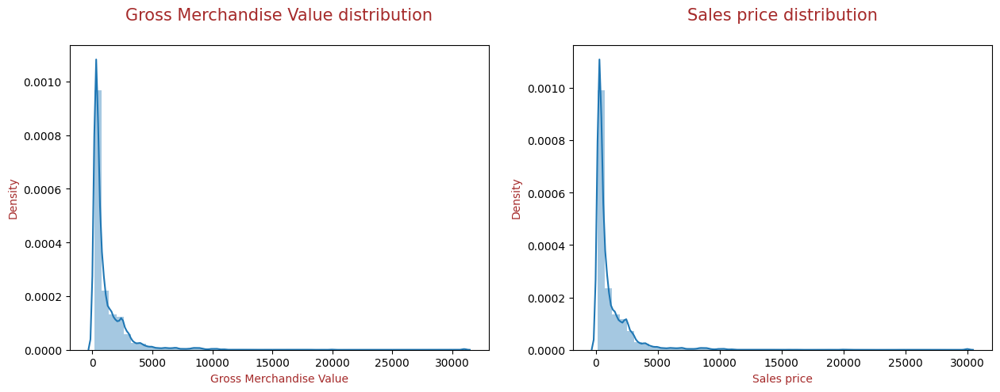

In [199]:
# Plotting histogram of gmv and sales_price

plt.figure(figsize=[15,5])

plt.subplot(1,2,1)
sns.distplot(analysis_df.gmv)
plt.title("Gross Merchandise Value distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Gross Merchandise Value", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1,2,2)
sns.distplot(analysis_df.sales_price)
plt.title("Sales price distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Sales price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

**We can see that gmv has sales price distribution seems to be skewed and the distribution seems to be maximum between 0 to 5000.**

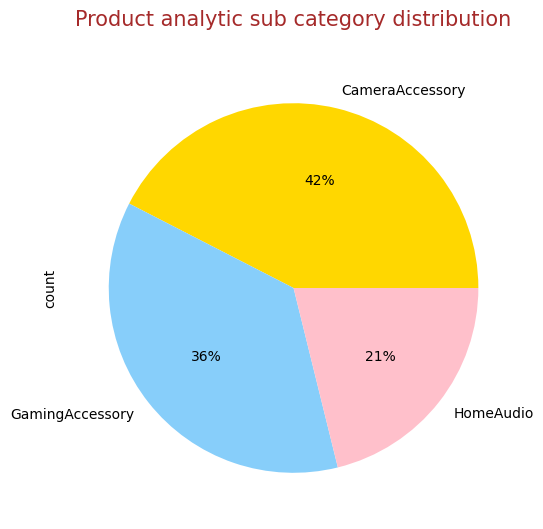

In [200]:
# Plotting Pie chart of Product categories

plt.figure(figsize=[10,6])

analysis_df.product_analytic_sub_category.value_counts().plot.pie(autopct = "%1.0f%%", colors=['gold','lightskyblue','pink'])
plt.title("Product analytic sub category distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()


Camera accessory and Gaming accessory have more number of orders than Home Audio

**Periodic Analysis**

In [202]:
# Creating a monthwise statitsics for gmv

gmv_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"gmv":"sum"})
gmv_df["Month"] = gmv_df["Month"].apply(lambda x: calendar.month_name[x])
gmv_df["Date"] = gmv_df["Month"].astype("str") + " " +gmv_df["Year"].astype("str")
gmv_df

,Year,Month,gmv,Date
0,2015,July,3.283978e+07,July 2015
1,2015,August,5.684600e+04,August 2015
2,2015,September,4.741531e+07,September 2015
3,2015,October,7.891773e+07,October 2015
4,2015,November,5.302896e+07,November 2015
5,2015,December,6.371626e+07,December 2015
6,2016,January,6.269433e+07,January 2016
7,2016,February,5.915279e+07,February 2016
8,2016,March,6.020768e+07,March 2016
9,2016,April,5.245621e+07,April 2016


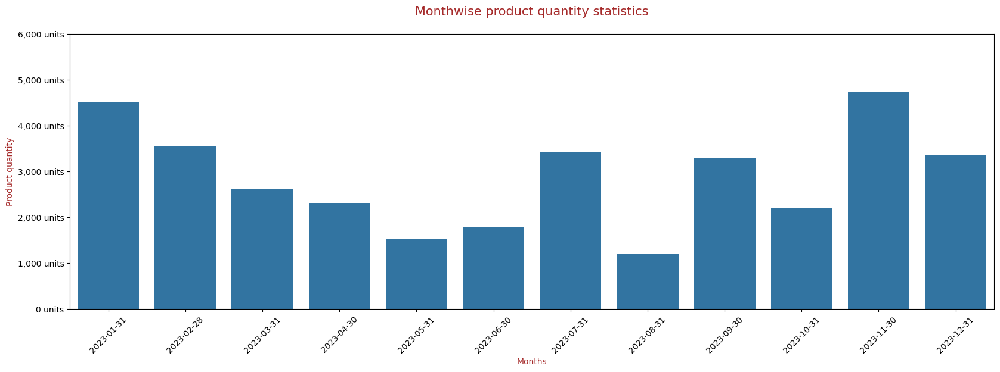

In [212]:
unit_df = pd.DataFrame({
    "Date": pd.date_range(start='2023-01-01', periods=12, freq='M'),
    "units": np.random.randint(1000, 5000, size=12)  # Example units data
})

# Convert 'Date' column to datetime if not already
unit_df["Date"] = pd.to_datetime(unit_df["Date"])

# Plotting barplot for months vs product quantity
plt.figure(figsize=[20,6])

sns.barplot(x=unit_df["Date"], y=unit_df["units"])
plt.title("Monthwise product quantity statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product quantity", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

# Formatting y-axis ticks
ytick_values = np.arange(0, 7000, 1000)
ytick_label = ["{:,} units".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()


1.October and December months contribute to highest gmv as these are the festive and holiday months

2.The gmv is lowest in the month of August

In [213]:

# Creating a monthwise statitsics for product quantity

unit_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"units":"sum"})
unit_df["Month"] = unit_df["Month"].apply(lambda x: calendar.month_name[x])
unit_df["Date"] = unit_df["Month"].astype("str") + " " +unit_df["Year"].astype("str")
unit_df

,Year,Month,units,Date
0,2015,July,22413,July 2015
1,2015,August,54,August 2015
2,2015,September,35892,September 2015
3,2015,October,60158,October 2015
4,2015,November,41804,November 2015
5,2015,December,47356,December 2015
6,2016,January,50202,January 2016
7,2016,February,53326,February 2016
8,2016,March,51112,March 2016
9,2016,April,46089,April 2016


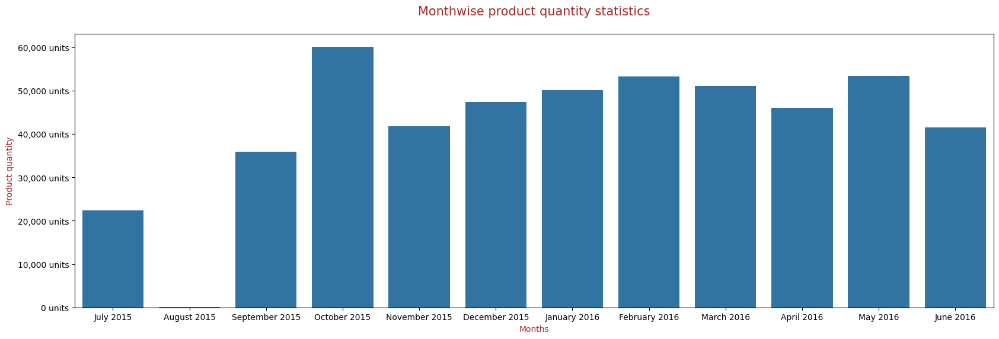

In [215]:
# Plotting barplot for months vs product quantity
plt.figure(figsize=[20, 6])

sns.barplot(x=unit_df["Date"], y=unit_df["units"])
plt.title("Monthwise product quantity statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product quantity", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0, 70000, 10000)
ytick_label = ["{:,} units".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()


1.The sales was highest during October, February and May month as these are the months when company provided special sale in respective weeks.

2.The sales was lowest in the month of August

In [216]:
# Creating a monthwise statitsics for discount

discount_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"discount":"mean"})
discount_df["Month"] = discount_df["Month"].apply(lambda x: calendar.month_name[x])
discount_df["Date"] = discount_df["Month"].astype("str") + " " +discount_df["Year"].astype("str")
discount_df

,Year,Month,discount,Date
0,2015,July,40.515039,July 2015
1,2015,August,40.814231,August 2015
2,2015,September,43.416132,September 2015
3,2015,October,46.409537,October 2015
4,2015,November,44.010707,November 2015
5,2015,December,46.246959,December 2015
6,2016,January,45.846031,January 2016
7,2016,February,47.794398,February 2016
8,2016,March,46.092240,March 2016
9,2016,April,48.017088,April 2016


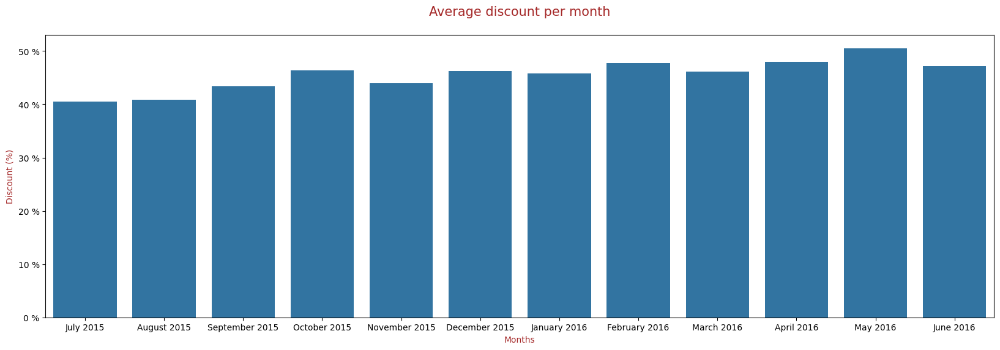

In [218]:
# Plotting barplot for months vs average discount
plt.figure(figsize=[20, 6])

sns.barplot(x=discount_df["Date"], y=discount_df["discount"])
plt.title("Average discount per month\n", fontdict={"fontsize": 15, "fontweight": 5, "color": "brown"})
plt.ylabel("Discount (%)", fontdict={"fontsize": 10, "fontweight": 5, "color": "brown"})
plt.xlabel("Months", fontdict={"fontsize": 10, "fontweight": 5, "color": "brown"})

ytick_values = np.arange(0, 60, 10)
ytick_label = ["{:,} %".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()



We can see that the discount provided over the products is between 40% to 60%. April, May and June month have highest discount.

**Discount Analysis**

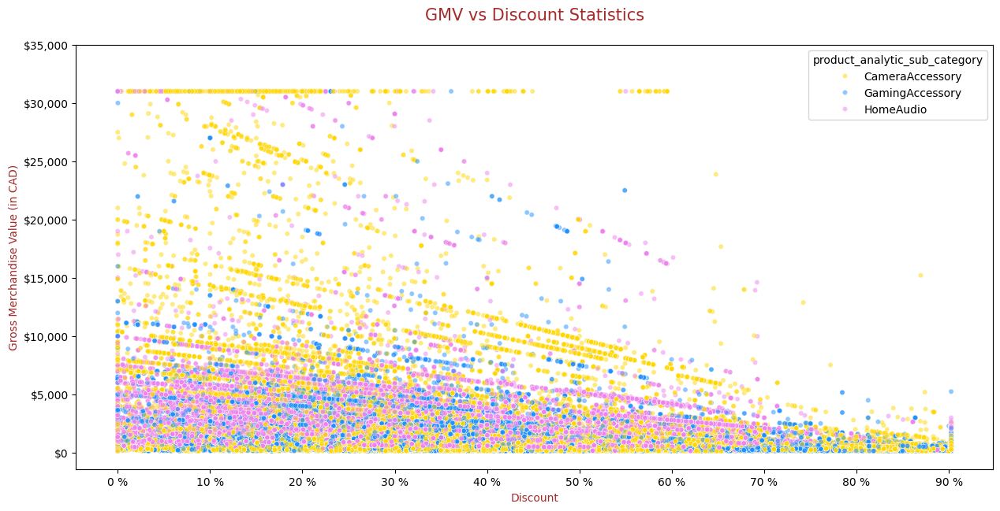

In [220]:


plt.figure(figsize=[15, 7])

sns.scatterplot(x=analysis_df["discount"], y=analysis_df["gmv"],
                color="pink", hue=analysis_df["product_analytic_sub_category"],
                alpha=0.5, s=20, palette=['gold', 'dodgerblue', 'violet'])

plt.title("GMV vs Discount Statistics\n", fontdict={"fontsize": 15, "fontweight": 5, "color": "brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize": 10, "fontweight": 5, "color": "brown"})
plt.xlabel("Discount", fontdict={"fontsize": 10, "fontweight": 5, "color": "brown"})

ytick_values = np.arange(0, 40000, 5000)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

xtick_values = np.arange(0, 100, 10)
xtick_label = ["{:,} %".format(j) for j in xtick_values]
plt.xticks(xtick_values, xtick_label)

plt.show()


1.The revenue GMV is high for discount range 0% to 60%.

2.As discount increases above 60% the GMV starts decreasing

3.For discounted products the gmv ranges between 0 to 15,000 CAD

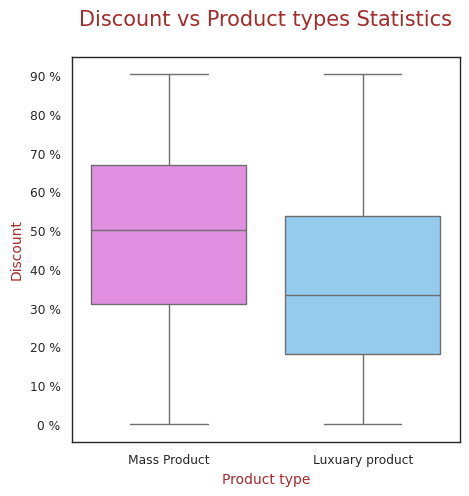

In [224]:

# Plotting discount for luxuary products
plt.figure(figsize=(5, 5))
sns.set_style("white")
sns.set_context("paper")

sns.boxplot(x='luxuary_product', y='discount', palette=['violet', 'lightskyblue'], data=analysis_df)
plt.title("Discount vs Product types Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.xticks([0,1], ["Mass Product", "Luxuary product"])
ytick_values = np.arange(0,100,10)
ytick_label = ["{:,} %".format(j) for j in xtick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()


1.Mass products have higher discount rate than luxuary products

2.Majority of the mass products are sold upto 50% discount

3.Majority of luxuary products are sold upto 40% discount

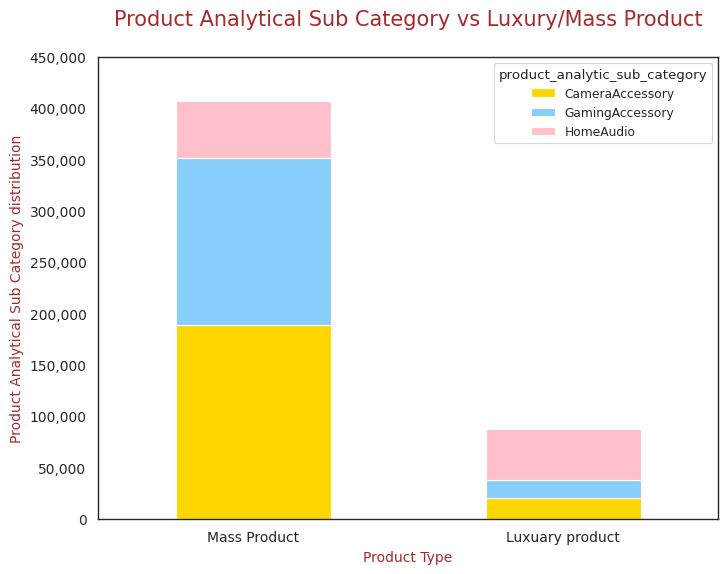

In [225]:
analysis_df.groupby(["luxuary_product", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink'])

plt.title("Product Analytical Sub Category vs Luxury/Mass Product\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Mass Product", "Luxuary product"], rotation=0)

plt.show()

1.Orders for Mass products are much higher than order for luxuary products.

2.In mass products Camera accessory hold high share

3.In luxuary products Home Audio hold high share

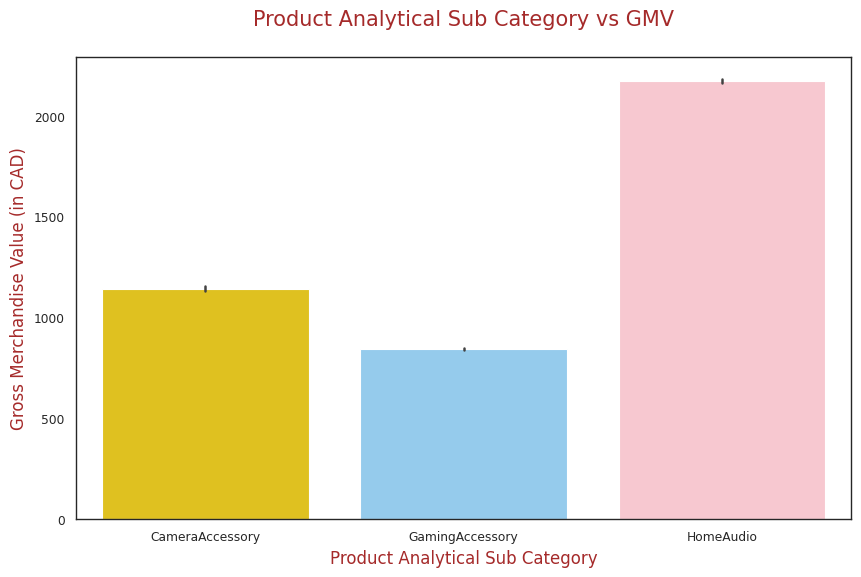

In [228]:
# Plotting for Product Analytical Sub Category and GMV
plt.figure(figsize=(10, 6))  # Adjust figsize as needed
sns.barplot(x='product_analytic_sub_category', y='gmv', data=analysis_df, palette=['gold','lightskyblue','pink'])
plt.title("Product Analytical Sub Category vs GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category", fontdict={"fontsize":12, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize":12, "fontweight":5, "color":"brown"})

plt.show()



Revenue generated from Home Audio products is much higher than Camera accessory and Gaming accessory products

In [229]:
# Creating monthwise number of orders

cprod_demand_df = analysis_df.groupby(by=["Year", "Month", "product_analytic_sub_category"], sort=["Year","Month"] , as_index=False).agg({"order_id":"count"})
cprod_demand_df["Month"] = cprod_demand_df["Month"].apply(lambda x: calendar.month_name[x])
cprod_demand_df["Date"] = cprod_demand_df["Month"].astype("str") + " " +cprod_demand_df["Year"].astype("str")
cprod_demand_df

,Year,Month,product_analytic_sub_category,order_id,Date
0,2015,July,CameraAccessory,8406,July 2015
1,2015,July,GamingAccessory,7014,July 2015
2,2015,July,HomeAudio,6451,July 2015
3,2015,August,CameraAccessory,17,August 2015
4,2015,August,GamingAccessory,26,August 2015
5,2015,August,HomeAudio,9,August 2015
6,2015,September,CameraAccessory,15299,September 2015
7,2015,September,GamingAccessory,11204,September 2015
8,2015,September,HomeAudio,8611,September 2015
9,2015,October,CameraAccessory,22906,October 2015


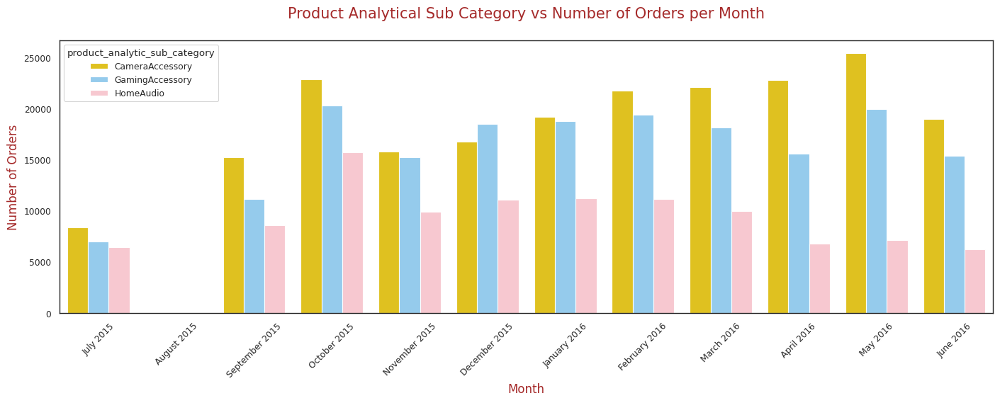

In [231]:
# Plotting monthwise number of orders
plt.figure(figsize=(17, 5))
sns.barplot(x='Date', y='order_id', hue='product_analytic_sub_category', data=cprod_demand_df, palette=['gold', 'lightskyblue', 'pink'])
plt.title("Product Analytical Sub Category vs Number of Orders per Month\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Number of Orders", fontdict={"fontsize":12, "fontweight":5, "color":"brown"})
plt.xlabel("Month", fontdict={"fontsize":12, "fontweight":5, "color":"brown"})

plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility if needed
plt.show()



1.For most of the months orders for Camera and Gaming accessory is higher than Home Audio products

2.In December month Gaming products have higher sales than other two categories

3.Number of orders for Home Audio are very low in April, May and June

4.Number of Orders for Camera accessory are highest in October and May


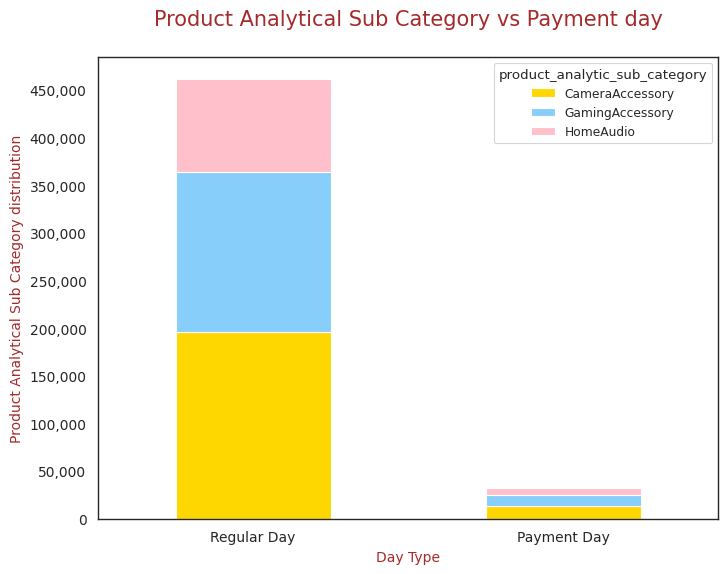

In [232]:
# Plotting Product Analytical Sub Category vs Payment day

analysis_df.groupby(["pay_date", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink'])

plt.title("Product Analytical Sub Category vs Payment day\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Day Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Regular Day", "Payment Day"], rotation=0)

plt.show()

Orders for Camera accessory, Gaming accessory and Home Audio are much higher on Regualr days compared to Payment days



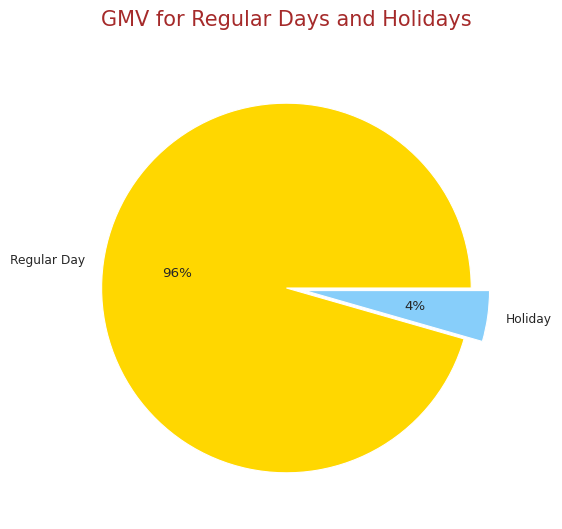

In [234]:
# Grouping by holiday and aggregating GMV
holiday_df = analysis_df.groupby(analysis_df["holiday"]).agg({"gmv":"sum"})

plt.figure(figsize=[10,6])

# Extracting values for pie chart
sizes = holiday_df["gmv"].values
labels = ["Regular Day", "Holiday"]
colors = ["gold", "lightskyblue"]
explode = (0.0, 0.1)

plt.pie(sizes, autopct="%1.0f%%", explode=explode, colors=colors, labels=labels)
plt.title("GMV for Regular Days and Holidays\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()


96% of orders are placed on regular days and only 4% are placed during Holidays.

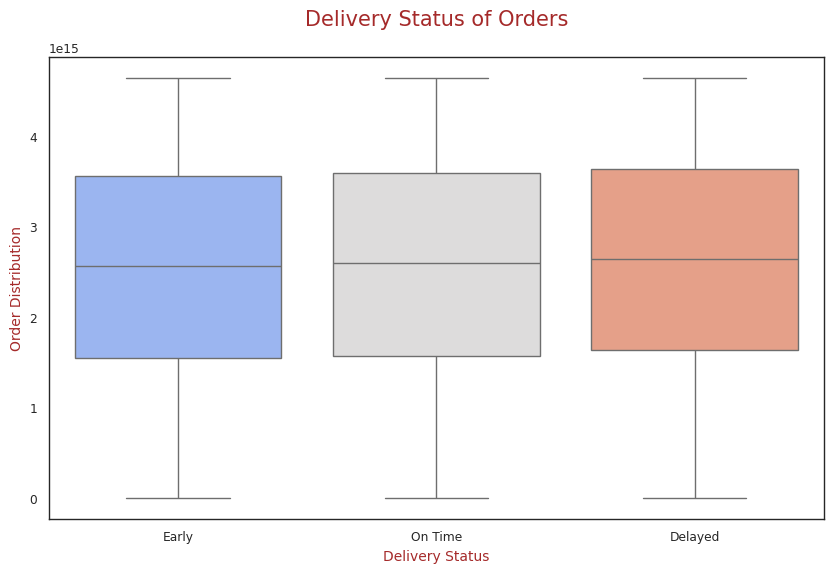

In [236]:
# Plotting Delivery status vs orders
plt.figure(figsize=[10,6])
sns.boxplot(x=analysis_df["delivery_status"], y=analysis_df["order_id"], palette='coolwarm')
plt.title("Delivery Status of Orders\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order Distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Delivery Status", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()


Average number of delayed orders are slightly higher than early and on time orders

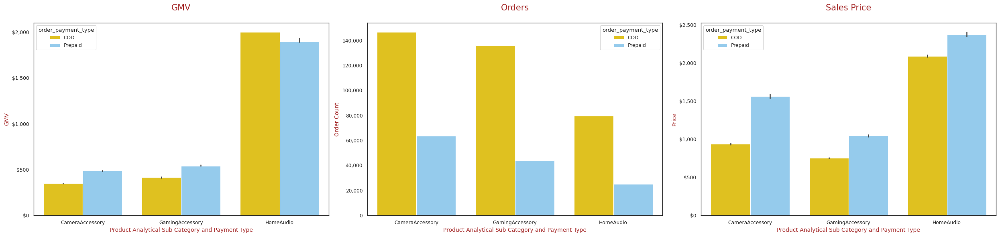

In [238]:
plt.figure(figsize=[25,6])

# Subplot 1: GMV
plt.subplot(1,3,1)
sns.barplot(x=analysis_df["product_analytic_sub_category"], y=analysis_df["gmv"], hue=analysis_df["order_payment_type"], palette=["gold", "lightskyblue"], estimator=np.median)
plt.title("GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.yticks(np.arange(0, 2500, 500), ["${:,}".format(j) for j in np.arange(0, 2500, 500)])

# Subplot 2: Orders
plt.subplot(1,3,2)
sns.countplot(x=analysis_df["product_analytic_sub_category"], hue=analysis_df["order_payment_type"], palette=["gold", "lightskyblue"])
plt.title("Orders\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order Count", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.yticks(np.arange(0, 160000, 20000), ["{:,}".format(j) for j in np.arange(0, 160000, 20000)])

# Subplot 3: Sales Price
plt.subplot(1,3,3)
sns.barplot(x=analysis_df["product_analytic_sub_category"], y=analysis_df["sales_price"], hue=analysis_df["order_payment_type"], palette=["gold", "lightskyblue"])
plt.title("Sales Price\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.yticks(np.arange(0, 3000, 500), ["${:,}".format(j) for j in np.arange(0, 3000, 500)])

plt.tight_layout()  # Ensures plots do not overlap
plt.show()


1.As seen above the sales for camera and gaming accessory is higher whereas the highest revenue is genearted from Home Audio product sub category.

2.For Home Audio most of the ordered products are luxuary products the preferred payment mode for them is cash on delivery

3.Prepaid products contribute to higher revenue in Camera and Gaming accessory

4.Cash on delivery orders are much higher compared to prepaid orders in all the three product sub category

5.Price of prepaid order is higher compared to cash on delivery orders in all the three product sub category

In [239]:
# Top 10 products according to revenue and sales of the company

prod_type_df = analysis_df.groupby(by=["product_analytic_vertical", "product_analytic_sub_category"], as_index=False).agg({"gmv":"sum", "units":"sum"}).sort_values(by="gmv", ascending=False).head(10)
prod_type_df["category"] = prod_type_df["product_analytic_vertical"].astype("str") + " in " + prod_type_df["product_analytic_sub_category"].astype("str")
prod_type_df

,product_analytic_vertical,product_analytic_sub_category,gmv,units,category
35,HomeAudioSpeaker,HomeAudio,1.820197e+08,74856,HomeAudioSpeaker in HomeAudio
38,Lens,CameraAccessory,1.006206e+08,31455,Lens in CameraAccessory
24,GamePad,GamingAccessory,6.047331e+07,52475,GamePad in GamingAccessory
28,GamingHeadset,GamingAccessory,3.131826e+07,59648,GamingHeadset in GamingAccessory
31,GamingMouse,GamingAccessory,2.534172e+07,34854,GamingMouse in GamingAccessory
0,Binoculars,CameraAccessory,2.474665e+07,12834,Binoculars in CameraAccessory
4,CameraBattery,CameraAccessory,2.244323e+07,35279,CameraBattery in CameraAccessory
21,Flash,CameraAccessory,2.197307e+07,48178,Flash in CameraAccessory
3,CameraBag,CameraAccessory,2.193374e+07,15528,CameraBag in CameraAccessory
13,CameraTripod,CameraAccessory,1.932243e+07,31029,CameraTripod in CameraAccessory


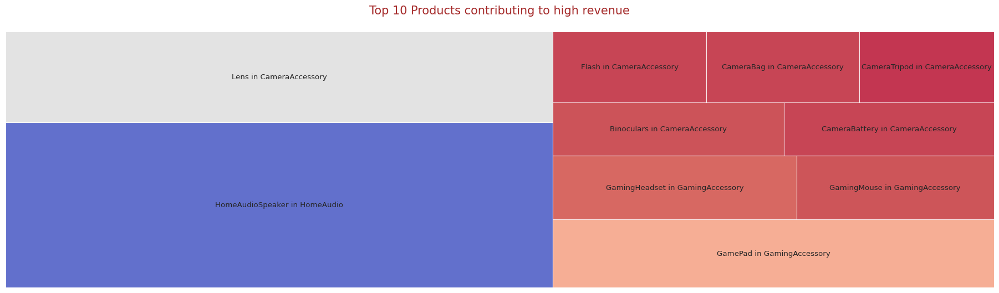

In [240]:
# Plotting Top 10 products according to revenue of the company

plt.figure(figsize=(23, 6))

# Create a dataset
my_values=list(prod_type_df['gmv'])
# create a color palette, mapped to these values
cmap = matplotlib.cm.coolwarm_r
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

squarify.plot(label=prod_type_df["category"], sizes=prod_type_df["gmv"], alpha=.8, color=colors )
plt.title("Top 10 Products contributing to high revenue\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.axis('off')
plt.show()



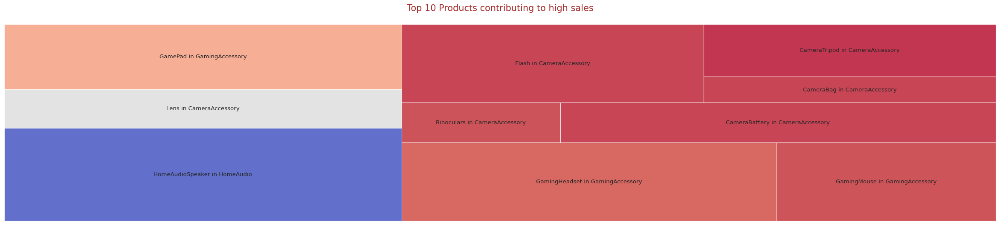

In [241]:
# Plotting Top 10 products according to revenue of the company

plt.figure(figsize=(30, 6))

# Create a dataset
my_values=list(prod_type_df['gmv'])
# create a color palette, mapped to these values
cmap = matplotlib.cm.coolwarm_r
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

squarify.plot(label=prod_type_df["category"], sizes=prod_type_df["units"], alpha=.8, color=colors )
plt.title("Top 10 Products contributing to high sales\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.axis('off')
plt.show()

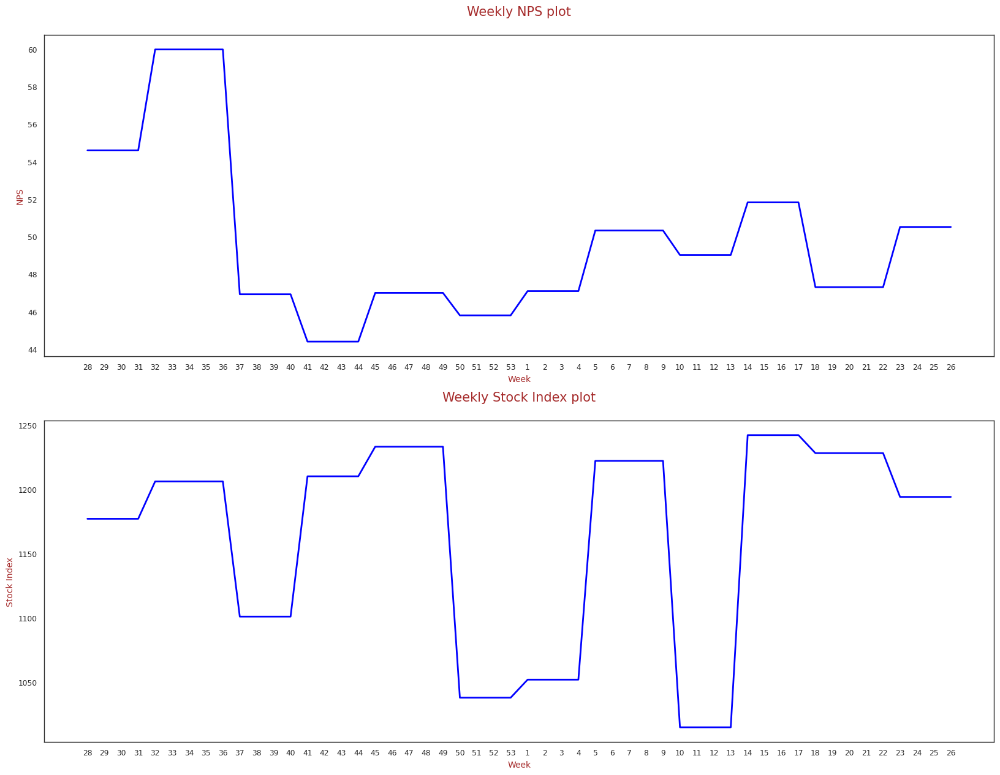

In [242]:
# Plotting NPS and Stock index
nps_plot = monthly_nps.copy()
nps_plot["week"] = nps_plot["week"].astype("str")

plt.figure(figsize=(20, 15))

plt.subplot(2,1,1)
plt.plot(nps_plot.iloc[:,0], nps_plot.iloc[:,1], 'b-', linewidth=2)
plt.title("Weekly NPS plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("NPS", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(2,1,2)
plt.plot(nps_plot["week"], nps_plot["Stock Index"], 'b-', linewidth=2)
plt.title("Weekly Stock Index plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Stock Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()


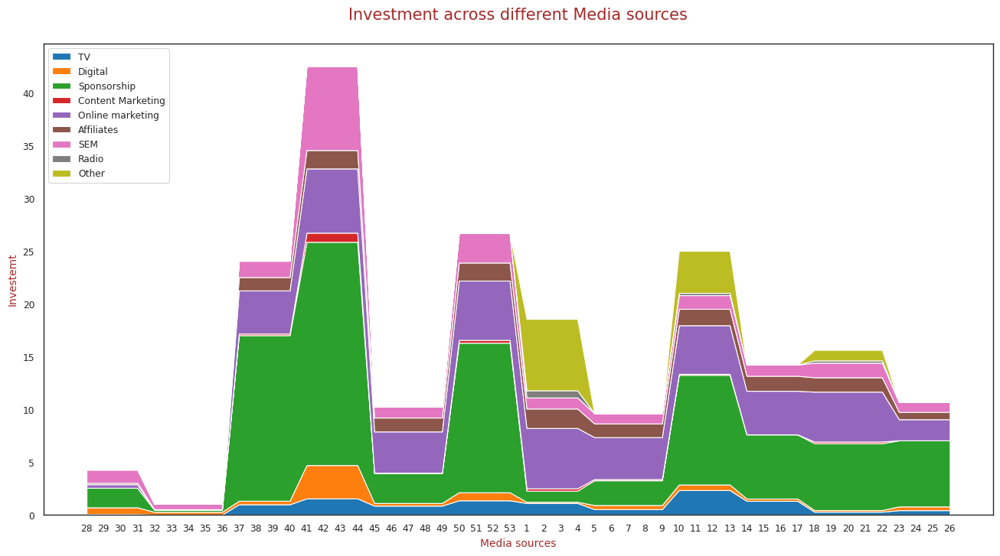

In [243]:
# Investment across different Media sources

media_plot = media_inv_df.copy()
media_plot["week"] = media_plot["week"].astype("str")

plt.figure(figsize=(16, 8))

# Basic stacked area chart.
plt.stackplot(media_plot["week"], media_plot["TV"], media_plot["Digital"], media_plot["Sponsorship"], media_plot["Content Marketing"], media_plot["Online marketing"], media_plot["Affiliates"], media_plot["SEM"], media_plot["Radio"], media_plot["Other"],
              labels=["TV","Digital","Sponsorship","Content Marketing","Online marketing","Affiliates","SEM","Radio","Other"])
plt.title("Investment across different Media sources\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Investemt", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Media sources", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.legend(loc='upper left')
plt.show()



We will be using Market Mix Modelling on our pre-processed data. The following models will be built and evaluated.

1.Additive Model

2.Multiplicative Model

3.Koyck Model

4.Distributive Lag Model (Additive)

5.Distributive Lag Model (Multiplicative)

In [244]:
# Copying the datasets for preparing model data

cameraaccessory_model_df = camera_accessory_df.copy()
gamingaccessory_model_df = gaming_accessory_df.copy()
homeaudio_model_df = home_audio_df.copy()


In [245]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


As week column was used to build the data at weekly level so now we will be dropping it as it is not significat feature for predition.

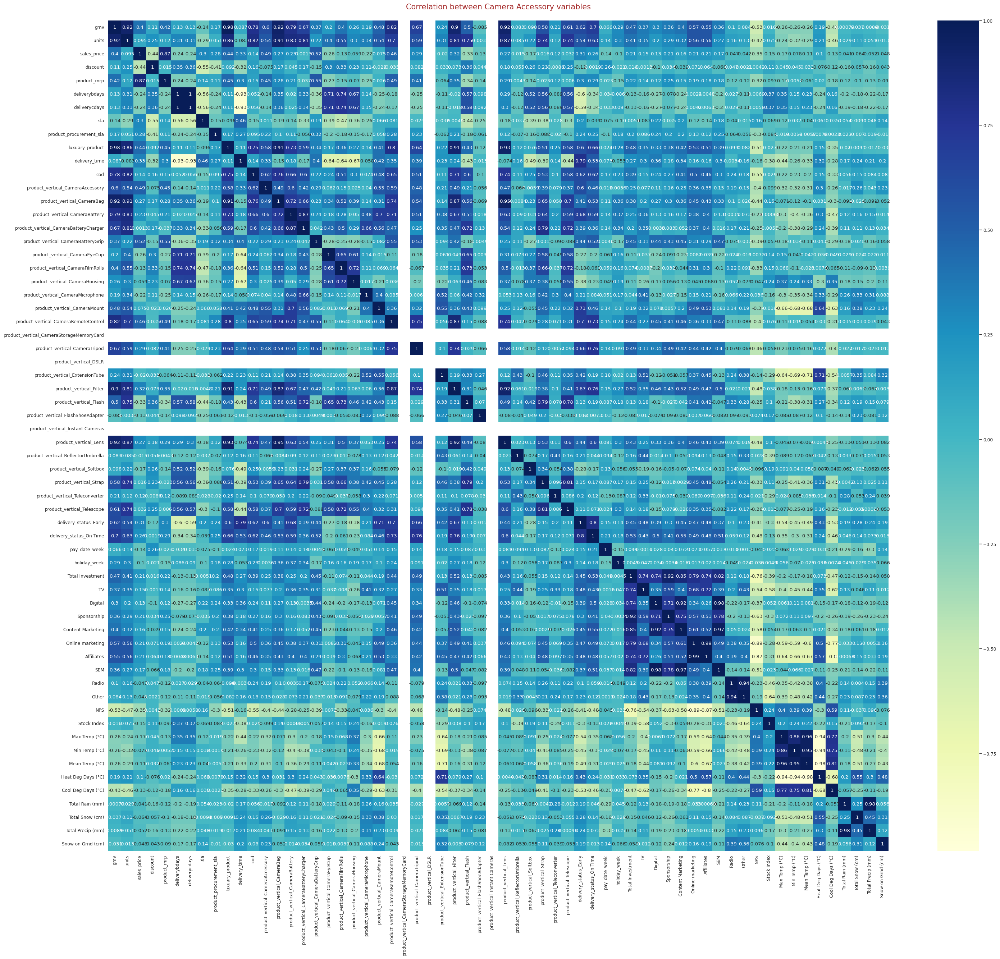

In [246]:
cameraaccessory_model_df.drop(columns="week", axis=1, inplace=True)
gamingaccessory_model_df.drop(columns="week", axis=1, inplace=True)
homeaudio_model_df.drop(columns="week", axis=1, inplace=True)


# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(cameraaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Camera Accessory variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()


In [247]:

cameraaccessory_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,5191790.0,5444,954.412577,49.970047,1788.111961,0.0,0.0,5.856503,2.88468,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0,18.549,1.095,0.114,1.05,0.225,5.725,1.842,1.05,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.2,0.0


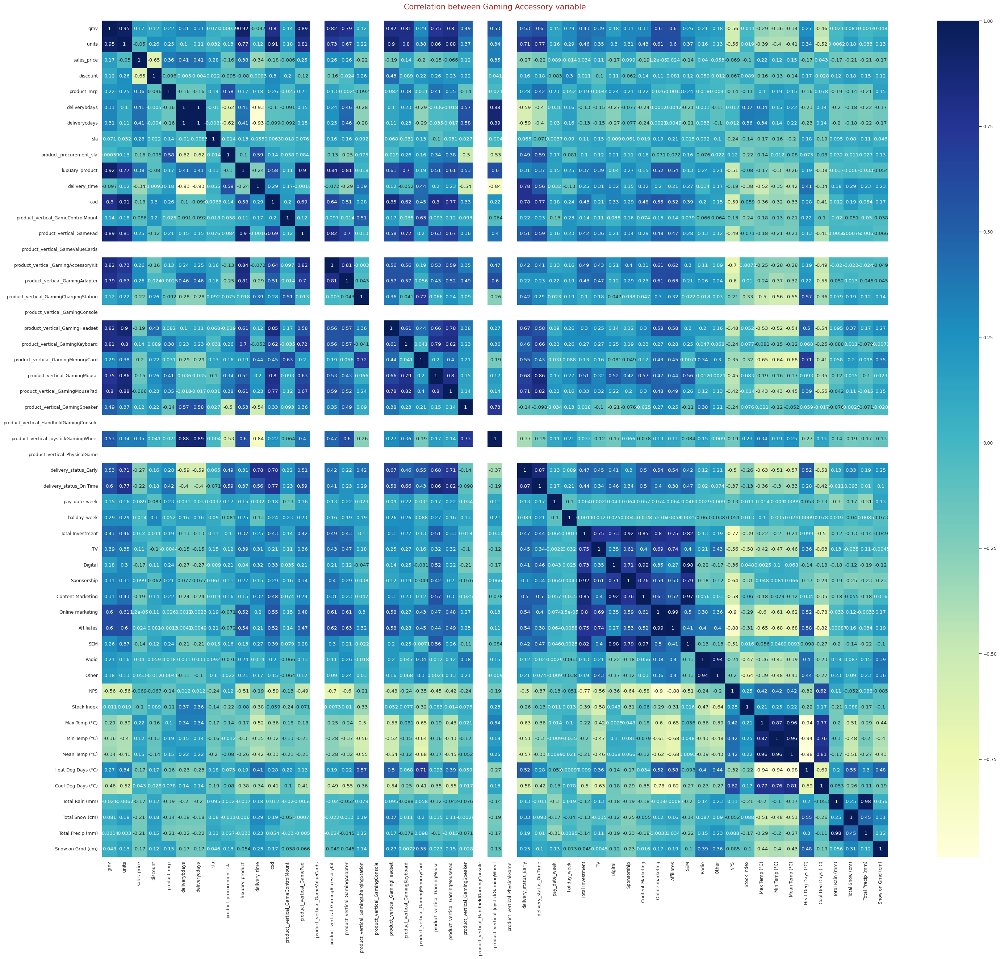

In [248]:
# Dropping the columns that have high correlation

cameraaccessory_model_df.drop(columns = ["luxuary_product","Total Precip (mm)", "Max Temp (°C)", "Other", "Affiliates", "Content Marketing", "Sponsorship", "product_vertical_CameraStorageMemoryCard", "product_vertical_DSLR", "product_vertical_Instant Cameras","product_vertical_Telescope", "units"], axis=1, inplace=True)


# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(gamingaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Gaming Accessory variable\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

In [249]:
gamingaccessory_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,3414523.0,4404,774.64133,46.669654,1851.959321,0.0,0.0,5.907252,2.514877,421,14594,3604,0,1113,0,168,62,1,0,1559,105,306,705,63,29,0,31,0,3676,274,0,0,18.549,1.095,0.114,1.05,0.225,5.725,1.842,1.05,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.2,0.0


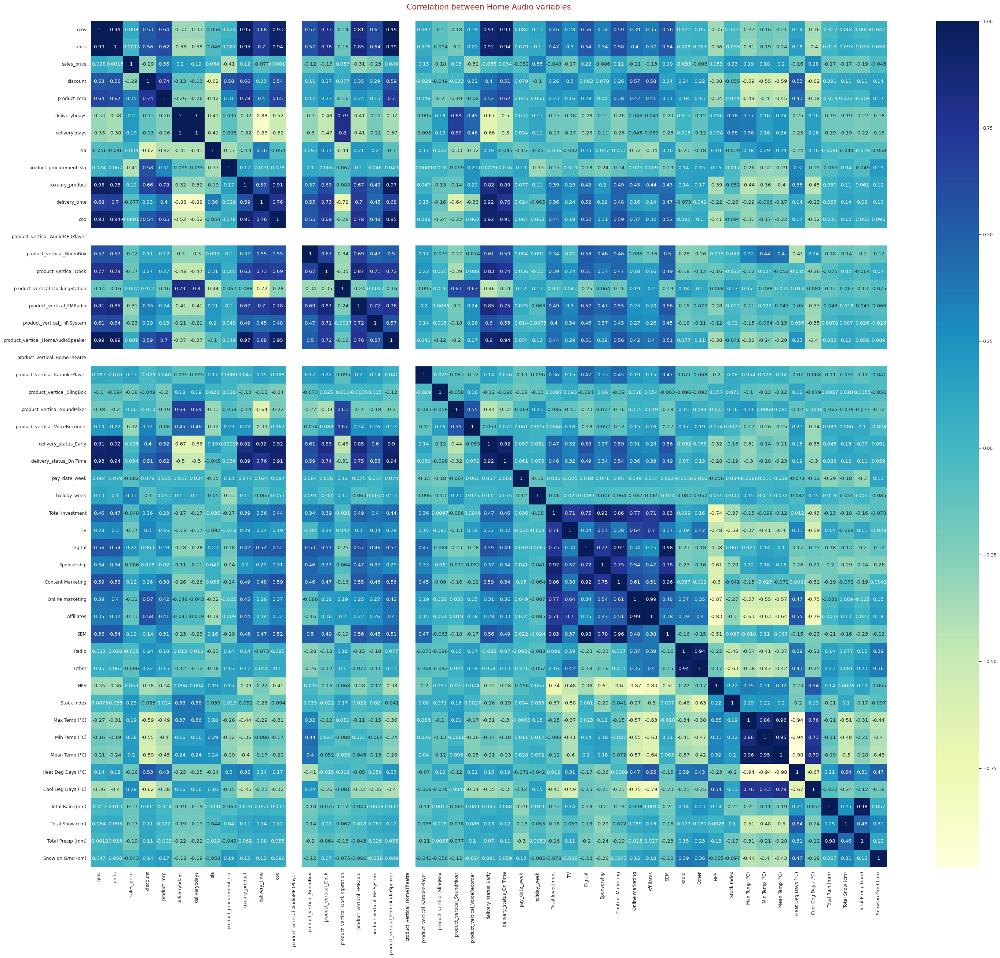

In [250]:
# Dropping the columns that have high correlation

gamingaccessory_model_df.drop(columns = ["luxuary_product","product_vertical_GameValueCards","product_vertical_GamingConsole","product_vertical_HandheldGamingConsole","product_vertical_PhysicalGame","product_vertical_GameControlMount","Total Investment","Digital","Content Marketing","Radio","Total Precip (mm)","units"], axis=1, inplace=True)


# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(homeaudio_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Home Audio variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})


plt.show()

In [251]:

homeaudio_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,6936108.0,3244,2139.040842,44.267017,4385.861077,0.0,0.0,4.94771,2.814666,1814,6894,2793,0,42,41,1,404,19,2640,0,0,0,1,78,2069,358,0,0,18.549,1.095,0.114,1.05,0.225,5.725,1.842,1.05,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.2,0.0


# Model 1: Additive Model

Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.

The equation can be represented as:					Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ
Train Test Split

In [252]:
# Train test split

cameraaccessory_model1_train, cameraaccessory_model1_test = train_test_split(cameraaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model1_train, gamingaccessory_model1_test = train_test_split(gamingaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model1_train, homeaudio_model1_test = train_test_split(homeaudio_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)


In [253]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model1_train = cameraaccessory_model1_train.pop('gmv')
X_cameraaccessory_model1_train = cameraaccessory_model1_train

y_gamingaccessory_model1_train = gamingaccessory_model1_train.pop('gmv')
X_gamingaccessory_model1_train = gamingaccessory_model1_train

y_homeaudio_model1_train = homeaudio_model1_train.pop('gmv')
X_homeaudio_model1_train = homeaudio_model1_train


# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model1_test = cameraaccessory_model1_test.pop('gmv')
X_cameraaccessory_model1_test = cameraaccessory_model1_test

y_gamingaccessory_model1_test = gamingaccessory_model1_test.pop('gmv')
X_gamingaccessory_model1_test = gamingaccessory_model1_test

y_homeaudio_model1_test = homeaudio_model1_test.pop('gmv')
X_homeaudio_model1_test = homeaudio_model1_test



In [254]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns]=scaler.fit_transform(X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns])
# Transform on test data
X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns]=scaler.transform(X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns])


X_cameraaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Online marketing,SEM,Radio,NPS,Stock Index,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
count,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000
mean,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000
std,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504
min,-3.25749,-2.61202,-3.07272,-0.70058,-0.70064,-2.17556,-3.59422,-1.90155,-2.02366,-2.88487,-2.73331,-2.63803,-2.14800,-1.66290,-0.72190,-1.38727,-0.43133,-0.55238,-1.54066,-2.64255,-1.98902,-0.95704,-2.94622,-1.27439,-0.25000,-2.66004,-0.23643,-0.36012,-2.46532,-0.17408,-1.68456,-1.83716,-0.73855,-0.55470,-1.44403,-1.35313,-0.60404,-2.02895,-0.66273,-0.45911,-1.37506,-2.00119,-2.44247,-2.14216,-1.04323,-0.68540,-0.83291,-0.33286,-0.27059
25%,-0.70187,-0.54616,-0.60718,-0.70058,-0.70064,-0.72380,-0.24016,-0.95316,-0.48334,-0.33465,-0.36048,-0.26660,-0.47621,-0.68388,-0.72190,-0.51380,-0.43133,-0.55238,-0.93834,-0.47641,-0.41338,-0.95704,-0.27130,-0.93369,-0.25000,-0.48357,-0.23643,-0.36012,-0.57898,-0.17408,-0.92541,-0.48017,-0.73855,-0.55470,-0.58526,-0.72330,-0.46464,-0.68414,-0.41479,-0.45911,-0.68944,-0.64888,-0.77510,-0.68104,-0.99947,-0.68540,-0.68840,-0.33286,-0.27059
50%,0.00513,-0.10219,-0.12422,-0.69905,-0.69910,-0.17961,0.09483,0.55890,0.02713,0.12309,-0.03559,0.00554,-0.28868,-0.07199,-0.40314,-0.15302,-0.43133,-0.55238,0.01372,0.14446,0.03107,-0.44861,0.13082,-0.11813,-0.25000,-0.07281,-0.23643,-0.36012,-0.11206,-0.17408,0.12410,-0.15663,-0.73855,-0.55470,-0.21597,-0.07374,-0.30738,0.21685,-0.38299,-0.45911,-0.15695,0.45872,0.09548,-0.05513,-0.13833,-0.68540,-0.45359,-0.33286,-0.27059
75%,0.78986,0.38828,0.79936,1.40942,1.40461,0.35224,0.54787,0.74731,0.62515,0.66801,0.32067,0.34928,0.37165,0.72347,0.47345,0.33118,-0.43133,0.01674,0.63547,0.79293,0.49283,0.56824,0.46649,0.74771,-0.25000,0.37848,-0.23643,-0.36012,0.63501,-0.17408,0.70924,0.28328,1.35401,-0.55470,0.70068,0.61983,-0.09812,0.55652,-0.21727,-0.45911,0.49645,0.74206,0.78899,0.97880,0.63081,0.72474,0.38633,-0.33286,-0.27059
max

Building a Linear Model for camera accessory

In [255]:
cameraaccessory_model1 = LinearRegression().fit(X_cameraaccessory_model1_train, y_cameraaccessory_model1_train)
y_cameraaccessory_model1_test_pred = cameraaccessory_model1.predict(X_cameraaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))



R2 Score: 0.9665716799192344
Mean Squared Error: 201002058923.78397


During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.

In [256]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12366735.76009569
Minimumn Y :  299.0


In [257]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03625397843648889

Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [258]:
cameraaccessory_model1_cvdf = cameraaccessory_model_df.copy()

y_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf.pop('gmv')
X_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf


cameraaccessory_model1_cv = LinearRegression().fit(X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model1_cv, X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)))


Cross-Predicted Accuracy: -0.45659804131454473
Mean Squared Error: 5465799630661.256


In [259]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE



0.18905243373542147


Determining Feature Importance for cameraaccessory from model without cv

In [260]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model1.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model1.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model1_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [261]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
26,product_vertical_Lens,573386.208
3,product_mrp,433829.350
24,product_vertical_Flash,413164.016
38,Online marketing,278122.782
1,sales_price,226109.744
43,Min Temp (°C),204341.274
18,product_vertical_CameraMicrophone,184501.335
17,product_vertical_CameraHousing,177263.679
21,product_vertical_CameraTripod,170498.869
11,product_vertical_CameraBag,144279.267


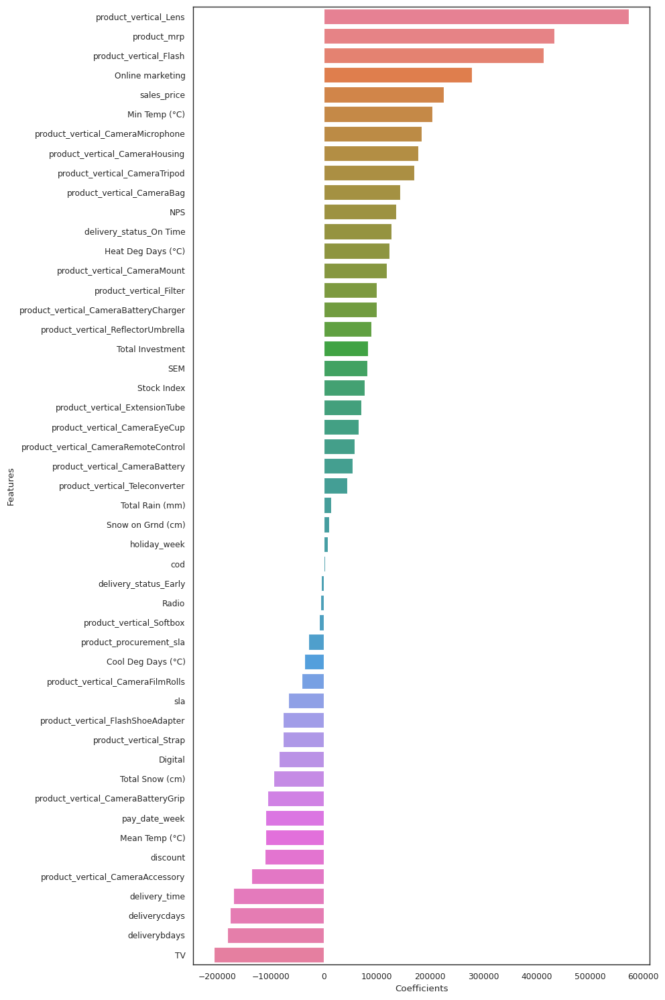

In [262]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


Re-scalling the features using Standard scaler

In [263]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns]=scaler.fit_transform(X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns])
# Transform on test data
X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns]=scaler.transform(X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns])


X_gamingaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,delivery_time,cod,product_vertical_GamePad,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,TV,Sponsorship,Online marketing,Affiliates,SEM,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-3.08041,-1.84654,-1.87762,-0.71549,-0.71609,-5.10024,-2.15059,-1.98677,-1.85168,-2.62271,-2.49088,-2.15999,-0.48646,-1.56411,-2.11704,-0.79208,-1.92434,-2.07626,-0.73148,-0.97519,-1.44164,-1.64963,-0.81650,-0.58835,-1.23527,-1.09556,-1.74925,-1.82492,-0.63869,-0.44117,-1.33297,-2.04053,-1.90308,-2.43036,-2.17962,-0.96259,-0.76270,-0.77446,-0.32756,-0.26642
25%,-0.44559,-0.84520,-0.34854,-0.71549,-0.71609,-0.17291,-0.63560,-1.02001,-0.45427,-0.18616,-0.34837,-0.62063,-0.48646,-0.77618,-0.60291,-0.56208,-0.51191,-0.56607,-0.65506,-0.63243,-0.92376,-0.72373,-0.81650,-0.58835,-0.83477,-0.78979,-0.75909,-0.70212,-0.39846,-0.44117,-0.73317,-0.41470,-0.67060,-0.80877,-0.73872,-0.94336,-0.76270,-0.65022,-0.32756,-0.26642
50%,0.09767,0.10273,-0.19504,-0.71287,-0.71328,0.22798,0.11344,0.40861,0.24406,0.10828,0.18921,-0.06950,-0.48646,-0.01201,-0.10459,-0.34851,-0.09668,0.08116,-0.27294,-0.52419,-0.08425,0.11445,-0.81650,-0.58835,0.00143,-0.14508,0.29903,0.33777,-0.35775,-0.44117,0.00995,0.46377,0.18679,0.07315,-0.00236,-0.23303,-0.76270,-0.40176,-0.32756,-0.26642
75%,0.63023,0.56000,0.01265,1.38930,1.35461,0.43866,0.47152,0.81944,0.62318,0.40542,0.73457,0.72868,0.22296,0.50412,0.68122,-0.02406,0.34307,0.76434,0.14739,0.33271,0.85248,0.54329,1.22474,0.55566,0.67185,0.55514,0.61867,0.72751,-0.19132,-0.44117,0.34975,0.71289,0.93700,0.95508,0.91434,0.68010,0.75461,0.23803,-0.32756,-0.26642
max,2.09103,2.07098,4.30254,1.59802,1.61263,1.03405,2.45203,1.28861,1.74979,1.97757,1.96554,1.79293,3.77010,2.32134,1.79286,4.12819,3.12705,1.98689,3.85393,2.50653,1.91055,2.63874,1.22474,1.69967,2.17407,2.30100,1.30479,1.20516,3.16774,3.22900,2.19787,0.93579,1.36569,1.32491,1.28649,2.46689,2.04525,3.99601,3.47019,5.48612



Building Linear Regression model for gaming accessory

In [264]:
gamingaccessory_model1 = LinearRegression().fit(X_gamingaccessory_model1_train , y_gamingaccessory_model1_train)
y_gamingaccessory_model1_test_pred = gamingaccessory_model1.predict(X_gamingaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))


R2 Score: 0.8954965065105094
Mean Squared Error: 216728101069.83145


During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.

In [265]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7055014.620678344
Minimumn Y :  598.0


In [266]:

# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.06599279282976585

Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [267]:
gamingaccessory_model1_cvdf = gamingaccessory_model_df.copy()

y_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf.pop('gmv')
X_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf


In [268]:
gamingaccessory_model1_cv = LinearRegression().fit(X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model1_cv, X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)))


Cross-Predicted Accuracy: 0.4334133519470421
Mean Squared Error: 905757236112.6249


In [269]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.1349102047614988

Determining Feature Importance for gamingaccessory from model without cv

In [270]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model1.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model1.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model1_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))


In [271]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
10,product_vertical_GamePad,589685.589
14,product_vertical_GamingHeadset,411173.065
1,sales_price,377702.541
37,Cool Deg Days (°C),296285.688
13,product_vertical_GamingChargingStation,285452.093
11,product_vertical_GamingAccessoryKit,281272.705
32,Stock Index,275814.584
25,TV,272636.629
7,product_procurement_sla,222261.470
34,Min Temp (°C),196730.769


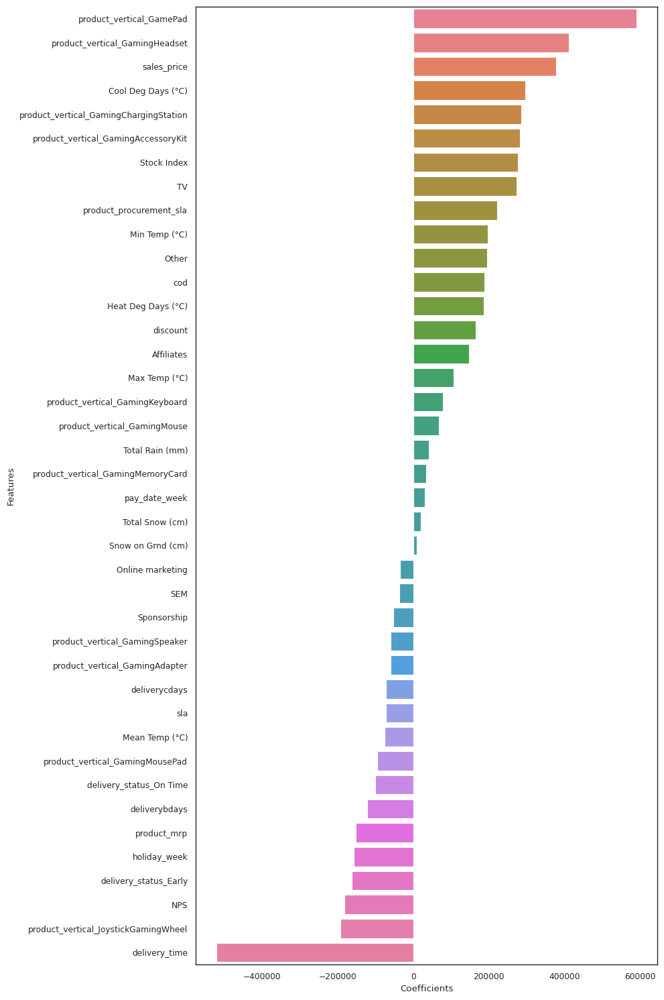

In [272]:

# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [273]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model1_train[X_homeaudio_model1_train.columns]=scaler.fit_transform(X_homeaudio_model1_train[X_homeaudio_model1_train.columns])
# Transform on test data
X_homeaudio_model1_test[X_homeaudio_model1_test.columns]=scaler.transform(X_homeaudio_model1_test[X_homeaudio_model1_test.columns])


X_homeaudio_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))


,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000
mean,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600
min,-2.92849,-1.60888,-4.47565,-1.96420,-0.71501,-0.71527,-1.72143,-4.19564,-2.66727,-1.93552,-2.09665,0.00000,-2.09296,-1.78363,-1.25613,-2.68995,-2.12754,-2.62960,0.00000,-0.17961,-0.24414,-0.71756,-2.43274,-1.58949,-1.87547,-0.88192,-0.72375,-1.56009,-1.40741,-0.62292,-1.23465,-0.68302,-2.24700,-2.37851,-0.68823,-0.51282,-0.51293,-1.44550,-1.76560,-1.88927,-2.37945,-2.14629,-1.09019,-0.61752,-0.82586,-0.36739,-0.91308,-0.27956
25%,-0.52972,-0.60698,-0.27156,-0.73780,-0.71501,-0.71527,-0.48499,-0.47893,-0.61372,-1.00729,-0.44302,0.00000,-0.63986,-0.73706,-0.75783,-0.29778,-0.72456,-0.61657,0.00000,-0.17961,-0.24414,-0.71756,-0.68818,-1.19496,-0.84049,-0.88192,-0.72375,-0.69518,-0.81179,-0.49782,-0.88471,-0.63900,0.00203,0.02815,-0.41919,-0.51282,-0.51293,-0.68248,-0.87810,-0.60177,-0.75752,-0.64636,-0.94033,-0.61752,-0.67174,-0.36739,-0.71359,-0.27956
50%,0.02679,-0.01966,0.03157,-0.26450,-0.71188,-0.71215,-0.17370,0.08390,-0.09345,0.47899,0.07867,0.00000,-0.33163,0.00319,-0.25953,0.14411,0.01385,-0.03359,0.00000,-0.17961,-0.24414,-0.71756,0.00438,0.41447,-0.03628,-0.88192,-0.72375,-0.25770,-0.01668,-0.33302,-0.24177,-0.29310,0.12761,0.22146,-0.31376,-0.51282,-0.51293,-0.08988,0.46067,0.09796,0.18615,-0.03251,-0.16395,-0.61752,-0.41303,-0.36739,-0.27339,-0.27956
75%,0.67581,0.39948,0.52214,0.63822,1.17129,1.18879,0.35958,0.59672,0.62942,0.72142,0.61524,0.00000,0.82425,0.62858,0.65402,0.82023,0.67841,0.54149,0.00000,-0.17961,-0.24414,0.32616,0.49531,0.76423,0.66653,1.13389,1.38170,0.68822,0.52726,-0.09605,0.43695,-0.02057,0.47544,0.59647,-0.25110,0.72848,-0.00911,0.44504,0.79762,0.82568,0.80544,0.87801,0.59837,0.40942,0.27228,-0.36739,0.23441,-0.27956
max,1.72016,3.20224,1.39378,2.14923,1.85385,1.83986,3.61833,1.41505,2.58203,1.28862,1.73690,0.00000,2.17827,2.14738,2.73027,1.72893,2.00755,2.12169,0.00000,5.56776,4.96411,2.93548,3.07270,1.45673,1.98473,1.13389,1.38170,2.33119,1.92803,3.03635,2.20491,2.92692,1.26428,1.15319,3

Building Linear Regression model for homeaudio


In [274]:
homeaudio_model1 = LinearRegression().fit(X_homeaudio_model1_train, y_homeaudio_model1_train)
y_homeaudio_model1_test_pred = homeaudio_model1.predict(X_homeaudio_model1_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))


R2 Score: 0.989543570436615
Mean Squared Error: 141918571695.4763


During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.

In [275]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  18461860.0
Minimumn Y :  2599.0


In [276]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.020408228368021024

Building Linear Regression model for homeaudio using K-fold Cross Validation

In [277]:
homeaudio_model1_cvdf = homeaudio_model_df.copy()

y_homeaudio_model1_cvdf = homeaudio_model1_cvdf.pop('gmv')
X_homeaudio_model1_cvdf = homeaudio_model1_cvdf


homeaudio_model1_cv = LinearRegression().fit(X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model1_cv, X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)))


Cross-Predicted Accuracy: 0.9473387659375396
Mean Squared Error: 321269194775.0941


In [278]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03070578692665421

Determining Feature Importance for homeaudio with model without cv

In [279]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_adlr_model_parameters = list(homeaudio_model1.coef_)
homeaudio_adlr_model_parameters.insert(0, homeaudio_model1.intercept_)
homeaudio_adlr_model_parameters = [round(x, 3) for x in homeaudio_adlr_model_parameters]
cols = X_homeaudio_model1_test.columns
cols = cols.insert(0, "constant")
homeaudio_adlr_coef = list(zip(cols, homeaudio_adlr_model_parameters))


# Creating a dataframe of the parameters and coefficients

homeaudio_adlr_coef_df = pd.DataFrame(homeaudio_adlr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.rename(columns=col_rename)
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.iloc[1:,:]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.loc[homeaudio_adlr_coef_df['Coefficients']!=0.0]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_adlr_coef_df



,Features,Coefficients
1,units,472955.656
16,product_vertical_FMRadio,416577.308
18,product_vertical_HomeAudioSpeaker,411993.541
9,luxuary_product,314891.219
24,delivery_status_Early,275211.189
2,sales_price,175312.241
13,product_vertical_BoomBox,118082.518
42,Mean Temp (°C),105130.421
23,product_vertical_VoiceRecorder,92715.262
4,product_mrp,88558.506


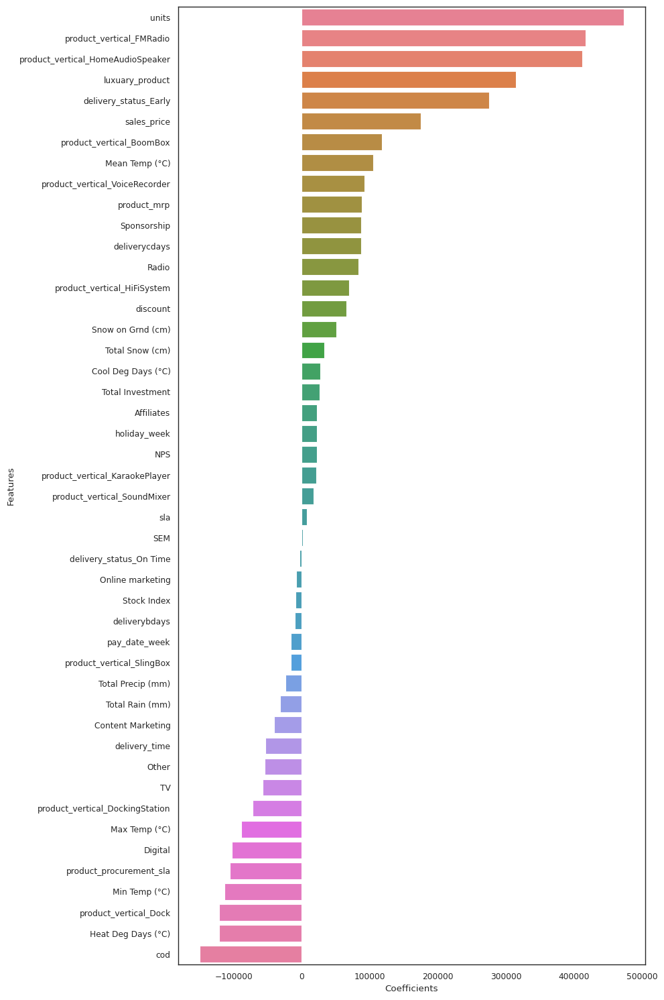

In [280]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_adlr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

# Model 2: Multiplicative Model

The Linear Regression Model that we built earlier is an additive model that has been an implicit assumption that the different KPIs affect the revenue additively.
Y = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ

However when there are interactions between the KPIs, we go for a multiplicative model.
To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.
Y = e^α .X1^β1 . X2^β2 . X3^β3 . X4^β4 . X5^β5 + ϵ

lnY = α + β1ln(X1) + β2ln(X2) + β3ln(X3) + β4ln(X4) + β5ln(X5) + ϵ'

In [281]:
# Copying the data for model 2

cameraaccessory_model2_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model2_df = gaming_accessory_df.drop(columns="week")
#gamingaccessory_model2_df = gamingaccessory_model_df.copy()
homeaudio_model2_df = home_audio_df.drop(columns="week")



# Taking the log of all the features of the three categories

cameraaccessory_model2_df = cameraaccessory_model2_df.applymap(lambda x: np.log(x))
cameraaccessory_model2_df = cameraaccessory_model2_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model2_df = cameraaccessory_model2_df.replace(np.nan, 0)

gamingaccessory_model2_df = gamingaccessory_model2_df.applymap(lambda x: np.log(x))
gamingaccessory_model2_df = gamingaccessory_model2_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model2_df = gamingaccessory_model2_df.replace(np.nan, 0)

homeaudio_model2_df = homeaudio_model2_df.applymap(lambda x: np.log(x))
homeaudio_model2_df = homeaudio_model2_df.replace([np.inf, -np.inf], 0)
homeaudio_model2_df = homeaudio_model2_df.replace(np.nan, 0)


cameraaccessory_model2_df.head()

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,15.463,8.602,6.861,3.911,7.489,0.000,0.000,1.768,1.059,6.006,9.676,8.381,3.871,5.652,6.321,5.568,1.792,0.693,3.332,0.000,0.000,3.367,4.564,0.000,6.659,0.000,0.693,5.389,7.639,0.000,0.000,6.479,0.000,0.000,3.434,0.000,3.434,8.338,6.129,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,2.398,0.000,-2.708,2.887,0.000,2.063,0.847,2.322,0.000
2,15.191,8.210,6.983,3.892,7.597,-5.890,-5.795,1.885,0.988,5.861,9.553,7.948,3.738,5.568,6.066,5.338,1.609,0.693,3.738,0.000,0.000,3.091,4.331,0.000,6.326,0.000,1.386,5.384,6.916,0.000,0.000,6.182,0.000,0.000,3.526,0.000,3.135,8.075,5.252,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,1.504,0.000,0.000,3.079,0.000,0.930,0.000,0.930,2.335
4,15.397,8.150,7.252,3.805,7.776,0.000,0.000,1.931,0.961,6.118,9.589,7.901,3.892,5.740,6.304,5.384,2.197,0.000,3.401,0.000,0.000,3.466,4.174,0.000,5.892,0.000,1.099,5.403,6.413,0.000,0.000,6.472,0.000,0.000,3.555,0.000,3.638,8.046,4.956,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,1.705,0.000,0.000,2.986,0.000,0.000,0.000,0.000,0.000
5,15.425,8.589,6.842,3.952,7.517,-6.083,-5.860,1.848,1.006,5.991,9.850,8.343,3.367,5.838,6.764,5.455,1.946,0.000,3.555,0.000,0.000,3.850,4.277,0.000,6.310,0.000,1.386,5.497,7.540,0.000,0.000,6.360,0.000,0.000,3.434,0.000,3.689,8.449,5.598,0.000,0.000,2.263,-0.660,-0.960,0.852,-2.129,1.381,0.257,-0.025,0.000,0.000,3.919,7.108,2.565,0.000,1.163,2.695,0.000,1.224,0.000,1.224,0.000
6,15.297,8.272,7.028,3.834,7.648,0.000,0.000,1.843,0.972,5.943,9.550,7.991,3.932,5.710,6.729,5.263,0.693,0.000,3.584,0.000,0.000,3.584,4.431,0.000,6.161,0.000,1.609,5.429,6.601,0.000,0.000,6.297,0.000,0.000,3.689,0.000,3.738,8.135,5.273,0.000,0.000,2.263,-0.660,-0.960,0.852,-2.129,1.381,0.257,-0.025,0.000,0.000,3.919,7.108,1.609,0.000,0.000,3.229,0.000,0.000,0.981,0.981,0.693


In [282]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model2_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model2_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model2_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train test splitting

In [283]:
# Train test split

cameraaccessory_model2_train, cameraaccessory_model2_test = train_test_split(cameraaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model2_train, gamingaccessory_model2_test = train_test_split(gamingaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model2_train, homeaudio_model2_test = train_test_split(homeaudio_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)


# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model2_train = cameraaccessory_model2_train.pop('gmv')
X_cameraaccessory_model2_train = cameraaccessory_model2_train

y_gamingaccessory_model2_train = gamingaccessory_model2_train.pop('gmv')
X_gamingaccessory_model2_train = gamingaccessory_model2_train

y_homeaudio_model2_train = homeaudio_model2_train.pop('gmv')
X_homeaudio_model2_train = homeaudio_model2_train


# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model2_test = cameraaccessory_model2_test.pop('gmv')
X_cameraaccessory_model2_test = cameraaccessory_model2_test

y_gamingaccessory_model2_test = gamingaccessory_model2_test.pop('gmv')
X_gamingaccessory_model2_test = gamingaccessory_model2_test

y_homeaudio_model2_test = homeaudio_model2_test.pop('gmv')
X_homeaudio_model2_test = homeaudio_model2_test

In [284]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns]=scaler.fit_transform(X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns])
# Transform on test data
X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns]=scaler.transform(X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns])


X_cameraaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))


,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000
mean,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000
std,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,0.00000,1.01504,0.00000,1.01504,1.01504,1.01504,0.00000,0.00000,1.01504,1.01504,1.01504,1.01504,0.00000,1.01504,1.01504,1.01504,0.00000,0.00000,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504
min,-3.96123,-4.43576,-3.48101,-3.76951,-1.96554,-1.93761,-2.43124,-3.82192,-3.94552,-1.32578,-3.63623,-3.84020,-3.94704,-3.93839,-3.88363,-2.38089,-0.77532,-2.27897,-0.38430,-0.47474,-2.68211,-3.82339,0.00000,-3.81246,0.00000,-0.83379,-3.94227,-3.11716,0.00000,0.00000,-3.94845,-0.17408,-0.17408,-3.78152,0.00000,-3.45043,-3.72490,-3.79667,0.00000,0.00000,-2.94095,-3.36424,-1.48213,-2.71535,-1.51678,-3.30674,-3.29089,-1.54546,-2.14048,-0.41362,-1.46305,-2.03442,-2.49608,-1.07174,-1.96576,-2.06733,-3.33231,-2.23798,-2.32774,-2.26426,-0.30511
25%,0.12571,-0.47316,-0.52778,-0.49909,-0.87313,-0.86456,-0.72877,-0.07844,0.14256,-1.32578,0.16406,0.06134,0.11999,0.16297,0.05800,-0.44974,-0.77532,0.02481,-0.38430,-0.47474,-0.62402,0.05228,0.00000,0.11359,0.00000,-0.83379,0.14332,-0.26372,0.00000,0.00000,0.09808,-0.17408,-0.17408,-0.08865,0.00000,-0.22371,-0.10573,0.02726,0.00000,0.00000,-0.24236,-0.04786,-0.64500,-0.59015,-0.70327,-0.02800,-0.03050,-0.48631,0.50575,-0.40838,-0.69387,-0.61137,-0.54432,-1.07174,-0.33376,-1.09735,-0.42445,-0.48993,-0.22234,-0.56033,-0.30511
50%,0.22652,0.12262,-0.03300,-0.03213,0.42557,0.39215,-0.14581,0.16100,0.23158,0.73771,0.30720,0.25213,0.21354,0.23296,0.13641,0

In [285]:
cameraaccessory_model2 = LinearRegression().fit(X_cameraaccessory_model2_train, y_cameraaccessory_model2_train)
y_cameraaccessory_model2_test_pred = cameraaccessory_model2.predict(X_cameraaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))



R2 Score: 0.9759242973623851
Mean Squared Error: 0.10843558205716233


In [286]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  12366735.76009569
Minimumn Y :  299.0


In [287]:

# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))


0.00000003


Building Linear Regression Model for cameraccesory using K-fold Cross Validation

In [288]:
cameraaccessory_model2_cvdf = cameraaccessory_model2_df.copy()

y_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf.pop('gmv')
X_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf


cameraaccessory_model2_cv = LinearRegression().fit(X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf)
cameraaccessory_predictions_mcv = cross_val_predict(cameraaccessory_model2_cv, X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)))


Cross-Predicted Accuracy: 0.9754896080653808
Mean Squared Error: 0.11479600079646234


In [289]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))



0.00000003


Determining Feature Importance for cameraaccessory from model with cv

In [290]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_mul_lr_model_parameters = list(cameraaccessory_model2_cv.coef_)
cameraaccessory_mul_lr_model_parameters.insert(0, cameraaccessory_model2_cv.intercept_)
cameraaccessory_mul_lr_model_parameters = [round(x, 3) for x in cameraaccessory_mul_lr_model_parameters]
cols = X_cameraaccessory_model2_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_mul_lr_coef = list(zip(cols, cameraaccessory_mul_lr_model_parameters))


# Creating a dataframe of parameter coefficients

cameraaccessory_mul_lr_coef_df = pd.DataFrame(cameraaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.rename(columns=col_rename)
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.iloc[1:,:]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.loc[cameraaccessory_mul_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_mul_lr_coef_df


,Features,Coefficients
1,units,1.009
2,sales_price,0.875
4,product_mrp,0.191
5,deliverybdays,0.103
51,NPS,0.057
50,Other,0.040
43,Digital,0.035
24,product_vertical_CameraTripod,0.027
46,Online marketing,0.026
44,Sponsorship,0.021


Plotting the Features in descending order of Importance for cameraaccessory

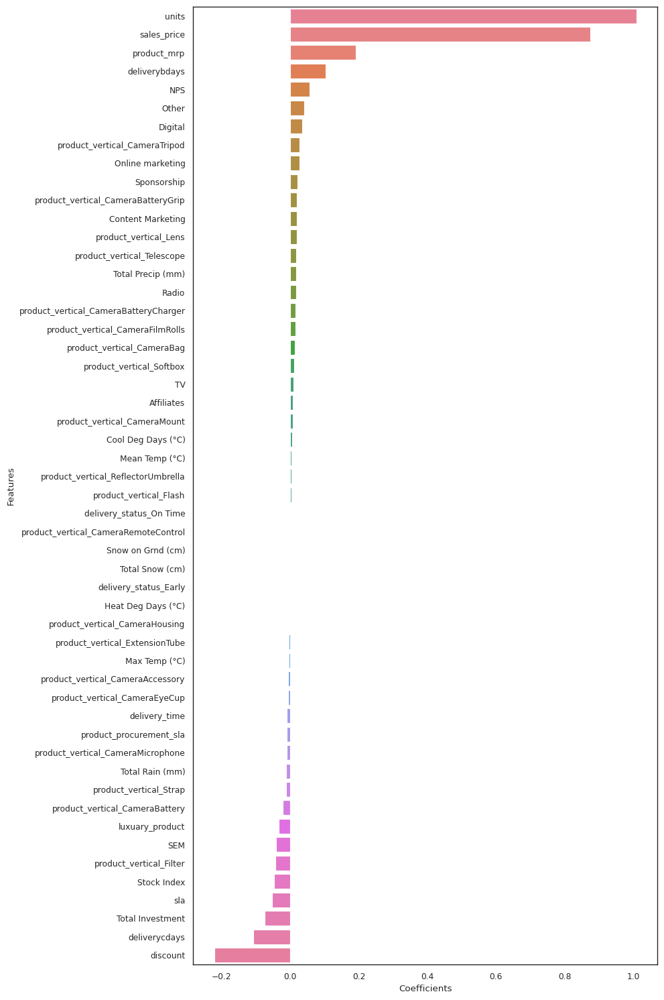

In [291]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


In [292]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns]=scaler.fit_transform(X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns])
# Transform on test data
X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns]=scaler.transform(X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns])


X_gamingaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-3.41415,-3.64486,-1.94972,-3.16115,-2.09830,-2.14583,-5.50675,-2.33774,-3.23681,-1.27642,-3.10238,0.00000,-3.56726,0.00000,-3.21455,-3.13728,-0.39005,0.00000,-3.11396,-3.17094,-2.52745,-3.20543,-3.10454,-1.23687,0.00000,-2.49704,0.00000,-3.38034,-3.05842,0.00000,0.00000,-2.31810,-2.52050,-1.48436,-2.19989,-1.57278,-2.49366,-2.48625,-1.40212,-2.17845,-0.40685,-1.42219,-2.07406,-2.57120,-1.10924,-2.00290,-1.92598,-3.33181,-2.26818,-2.35362,-2.27802,-0.30032
25%,0.14146,-0.23621,-0.83559,-0.23236,-0.76165,-0.75057,-0.04839,-0.60670,0.20573,-1.27642,0.20488,0.00000,0.22547,0.00000,0.15999,-0.01884,-0.39005,0.00000,-0.00614,0.02888,-0.30580,0.11821,0.00967,-1.23687,0.00000,-0.30387,0.00000,-0.14203,-0.06085,0.00000,0.00000,-0.12978,-0.06017,-0.58968,-0.47134,-0.78052,0.03854,0.03665,-0.41648,0.49666,-0.40155,-0.74007,-0.37980,-0.35037,-1.10924,-0.37188,-0.97750,-0.50406,-0.44091,-0.21899,-0.51003,-0.30032
50%,0.30368,0.18722,0.13990,-0.05077,0.39941,0.36413,0.22409,0.15796,0.27803,0.71991,0.40143,0.00000,0.28915,0.00000,0.31343,0.23962,-0.39005,0.00000,0.32971,0.23730,0.13209,0.26136,0.30685,0.19183,0.00000,-0.09945,0.00000,0.33346,0.36384,0.00000,0.00000,0.25079,0.43295,-0.08583,0.33917,0.11603,0.45877,0.46138,-0.29904,0.49666,-0.40155,0.05368,0.47269,0.35949,0.10997,0.32831,0.28732,-0.50406,-0.33346,-0.21899,-0.31202,-0.30032
75%,0.37357,0.55803,0.58543,0.17851,0.85641,0.87535,0.36191,0.50524,0.37670,0.84412,0.48205,0.00000,0.34663,0.00000,0.44037,0.51207,-0.39005,0.00000,0.46970,0.47871,0.49733,0.37937,0.53600,0.70984,0.00000,0.69316,0.00000,0.59231,0.50709,0.00000,0.00000,0.76301,0.62262,0.39591,0.74607,1.14585,0.54289,0.56934,0.10304,0.49666

Building Linear Regression model for gamingaccessory

In [293]:
gamingaccessory_model2 = LinearRegression().fit(X_gamingaccessory_model2_train, y_gamingaccessory_model2_train)
y_gamingaccessory_model2_test_pred = gamingaccessory_model2.predict(X_gamingaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))


R2 Score: 0.991768956242124
Mean Squared Error: 0.027039233887074403


In [294]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7055014.620678344
Minimumn Y :  598.0


In [295]:

# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000002


Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [296]:
gamingaccessory_model2_cvdf = gamingaccessory_model2_df.copy()

y_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf.pop('gmv')
X_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf


In [297]:
gamingaccessory_model2_cv = LinearRegression().fit(X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model2_cv, X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)))


Cross-Predicted Accuracy: -14604758023308.645
Mean Squared Error: 63477431638569.24


In [298]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.7f}".format(NRMSE))

1.1294020


Determining Feature Importance for gamingaccessory with model without cv

In [299]:
# Fromatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# Linear regression model parameter
gamingaccessory_mul_lr_model_parameters = list(gamingaccessory_model2.coef_)
gamingaccessory_mul_lr_model_parameters.insert(0, gamingaccessory_model2.intercept_)
gamingaccessory_mul_lr_model_parameters = [round(x, 3) for x in gamingaccessory_mul_lr_model_parameters]
cols = X_gamingaccessory_model2_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_mul_lr_coef = list(zip(cols, gamingaccessory_mul_lr_model_parameters))


# Creating dataframe with parameters and coeffiecients

gamingaccessory_mul_lr_coef_df = pd.DataFrame(gamingaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.rename(columns=col_rename)
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.iloc[1:,:]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.loc[gamingaccessory_mul_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_mul_lr_coef_df


,Features,Coefficients
1,units,0.456
13,product_vertical_GamePad,0.385
9,luxuary_product,0.342
22,product_vertical_GamingMouse,0.326
20,product_vertical_GamingKeyboard,0.279
29,delivery_status_On Time,0.254
2,sales_price,0.252
26,product_vertical_JoystickGamingWheel,0.168
19,product_vertical_GamingHeadset,0.098
28,delivery_status_Early,0.062


Plotting the Features in descending order of Importance for gamongaccessory

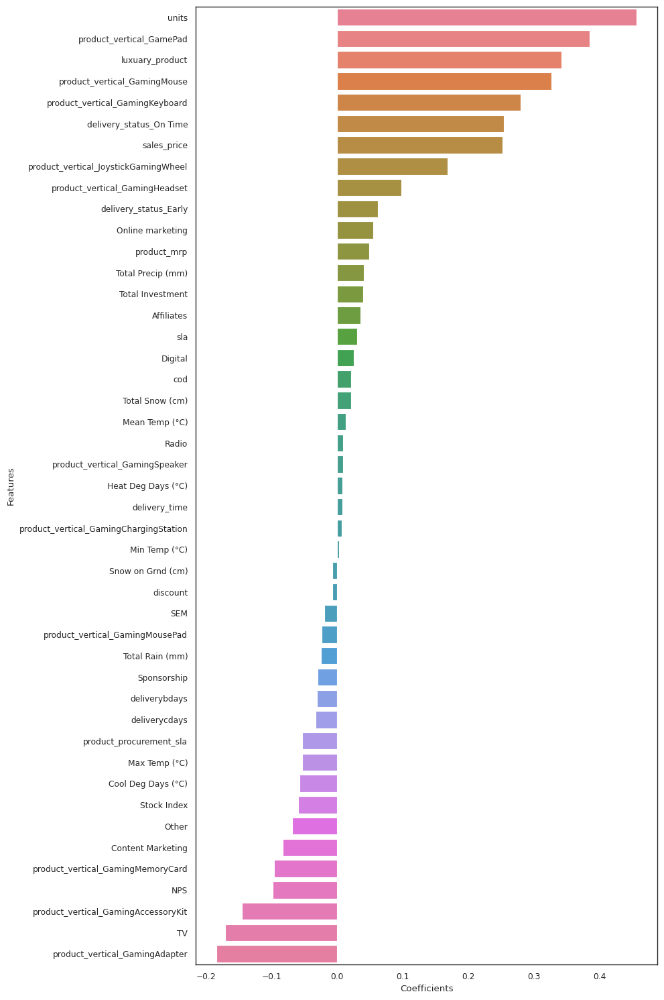

In [300]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()



In [301]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model2_train[X_homeaudio_model2_train.columns]=scaler.fit_transform(X_homeaudio_model2_train[X_homeaudio_model2_train.columns])
# Transform on test data
X_homeaudio_model2_test[X_homeaudio_model2_test.columns]=scaler.transform(X_homeaudio_model2_test[X_homeaudio_model2_test.columns])


X_homeaudio_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000
mean,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000
std,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600
min,-5.41272,-1.70861,-4.98121,-2.13218,-2.56625,-2.41073,-2.05911,-4.44322,-5.37503,-1.39088,-4.35461,0.00000,-4.65369,-3.26115,-1.80657,-5.17939,-4.10725,-5.36411,0.00000,0.00000,-0.17961,-0.65843,-5.03367,-4.33435,-4.56624,0.00000,0.00000,-3.45077,-4.12551,-1.49216,-3.10703,-1.59555,-4.05539,-4.02543,-1.65047,-1.87430,-0.47727,-1.52771,-1.79216,-2.61175,-1.03300,-2.00521,-2.23424,-1.78197,-2.23445,-2.09133,-2.27038,-0.31541
25%,0.03929,-0.60432,-0.14322,-0.72636,-0.18590,-0.16532,-0.45602,-0.42093,-0.02203,-1.39088,0.13194,0.00000,-0.23154,-0.23212,-0.61657,0.09666,-0.29456,-0.01085,0.00000,0.00000,-0.17961,-0.65843,-0.21052,-0.57637,-0.32166,0.00000,0.00000,-0.41880,-0.20330,-0.72138,-0.77168,-0.75099,0.27062,0.26706,-0.49168,-0.05805,-0.47241,-0.68278,-0.84493,-0.30439,-1.03300,-0.31334,-1.06528,-0.55853,-0.47601,-0.15232,-0.55550,-0.31541
50%,0.19279,0.01053,0.09243,-0.22701,0.37609,0.34169,-0.10746,0.10773,0.16114,0.70986,0.30688,0.00000,0.01176,0.30377,0.13424,0.24914,0.25222,0.18411,0.00000,0.00000,-0.17961,-0.65843,0.20195,0.49123,0.24507,0.00000,0.00000,0.07188,0.34731,-0.14164,0.18457,0.12489,0.31720,0.34105,-0.19830,0.57357,-0.47241,-0.05822,0.47502,0.29530,0.18635,0.29599,0.30665,-0.55853,-0.21528,-0.15232,0.10911,-0.31541
75%,0.33848,0.43531,0.45469,0.67039,0.75280,0.78897,0.44921,0.57454,0.36203,0.76759,0.44706,0.00000,0.64922,0.60642,0.83604,0.44092,0.60298,0.33725,0.00000,0.00000,-0.17961,0.45384,0.42873,0.59624,0.56469,0.00000,0.00000,0.75081,0.56182,0.37917,0.67819,0.55854,0.43445,0.47024,-0.04660,0.57357,-0.47241,0.48290,0.78754,0.75980,0.99741,0.80137,0.79437,0.61972,0.72645,-0.15232,0.65899,-0.31541
max,0.52584,3.02790,1.04975,2.03166,0.86670,0.90017,3.09289,1.29193,0.73959,0.86521,0.66702,0.00000,1.13209,1.09636,1.63586,0.64732,1.10509,0.64702,0.00000,0.00000,5.56776,2.46412,1.20825,0.76579,0.97685,0.00000,0.00000,1.44707,0.91586,2.45610,1.37038,1.39762,0.65293,0.63495,2.73628,0.57357,2.62110,2.93

In [302]:
homeaudio_model2 = LinearRegression().fit(X_homeaudio_model2_train, y_homeaudio_model2_train)
y_homeaudio_model2_test_pred = homeaudio_model2.predict(X_homeaudio_model2_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))


R2 Score: 0.9728119155465056
Mean Squared Error: 0.00519889139847599


In [303]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  18461860.0
Minimumn Y :  2599.0


In [304]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))


0.00000000


In [305]:
homeaudio_model2_cvdf = homeaudio_model2_df.copy()

y_homeaudio_model2_cvdf = homeaudio_model2_cvdf.pop('gmv')
X_homeaudio_model2_cvdf = homeaudio_model2_cvdf


homeaudio_model2_cv = LinearRegression().fit(X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model2_cv, X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)))


Cross-Predicted Accuracy: -10761415876823.205
Mean Squared Error: 13780668545883.39


In [306]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.2011040575291311

In [307]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# Linear regression model parameters
homeaudio_mul_lr_model_parameters = list(homeaudio_model2.coef_)
homeaudio_mul_lr_model_parameters.insert(0, homeaudio_model2.intercept_)
homeaudio_mul_lr_model_parameters = [round(x, 3) for x in homeaudio_mul_lr_model_parameters]
cols = X_homeaudio_model2_test.columns
cols = cols.insert(0, "constant")
homeaudio_mul_lr_coef = list(zip(cols, homeaudio_mul_lr_model_parameters))


In [308]:
# Creating a dataframe of parameters and coefficients

homeaudio_mul_lr_coef_df = pd.DataFrame(homeaudio_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.rename(columns=col_rename)
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.iloc[1:,:]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.loc[homeaudio_mul_lr_coef_df['Coefficients']!=0.0]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_mul_lr_coef_df


,Features,Coefficients
1,units,0.297
16,product_vertical_FMRadio,0.297
18,product_vertical_HomeAudioSpeaker,0.263
9,luxuary_product,0.245
24,delivery_status_Early,0.195
13,product_vertical_BoomBox,0.096
2,sales_price,0.096
23,product_vertical_VoiceRecorder,0.065
31,Sponsorship,0.059
39,Stock Index,0.048


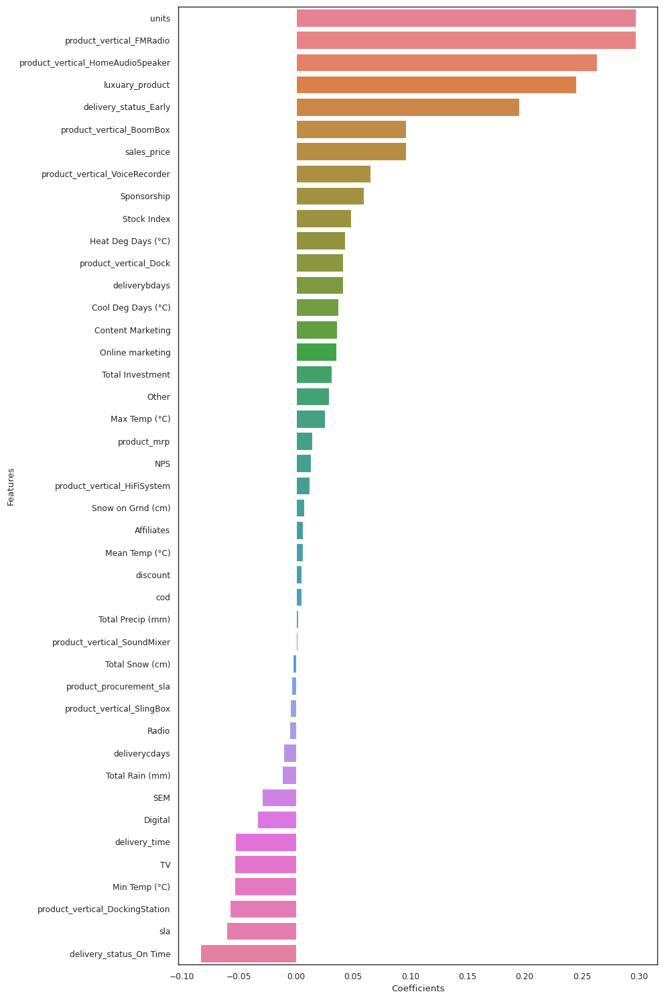

In [309]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


# Model 3: Koyck Model

The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.
The Koyck tells us that the current revenue generated is not just influenced by the different independent attributes, but also because of the revenue generated over the last periods. ie. Current revenue(Yt) is also dependent on the past revenue values(Yt-1).
Yt = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ

Yt = α + µYt-1 + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ -- (sale at time t is dependent on sale at time t-1)

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).
Therefore the total effect of advertising = Current effect + Carry over effect
                                        = β1 + β1 * µ/(1-µ)

										= β1/(1-µ)

In [310]:
# Copying the datasets for preparing model data

cameraaccessory_model3_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model3_df = gaming_accessory_df.drop(columns="week")
homeaudio_model3_df = home_audio_df.drop(columns="week")


print('Any null values in camera accessory: {}'.format(cameraaccessory_model3_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model3_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model3_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [312]:
# Creating a function lag_variables that return a column gmv lag
GMV_Lag = ['gmv']
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [316]:
# Example of updating np.str to str
# Before
def lag_variables(df, column, lag):
    df['lagged_column'] = df[column].shift(lag).astype(np.str)
    return df

# After
def lag_variables(df, column, lag):
    df['lagged_column'] = df[column].shift(lag).astype(str)
    return df


In [317]:
cameraaccessory_model3_df.head()



,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,5191790.000,5444,954.413,49.970,1788.112,0.000,0.000,5.857,2.885,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,11.000,-14.000,0.067,17.933,0.000,7.867,2.333,10.200,0.000
2,3957750.000,3679,1078.305,48.992,1991.552,0.003,0.003,6.586,2.685,351,14082,2829,42,262,431,208,5,2,42,0,0,22,76,0,559,0,4,218,1008,0,0,484,0,0,34,0,23,3212,191,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,4.500,-12.000,-3.733,21.733,0.000,2.533,0.000,2.533,10.333
4,4862685.000,3462,1410.778,44.907,2382.362,0.000,0.000,6.894,2.614,454,14599,2699,49,311,547,218,9,0,30,0,0,32,65,0,362,0,3,222,610,0,0,647,0,0,35,0,38,3122,142,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,5.500,-9.000,-1.800,19.800,0.000,0.000,0.000,0.000,0.000
5,4999139.000,5370,936.301,52.064,1838.829,0.002,0.003,6.344,2.734,400,18963,4200,29,343,866,234,7,1,35,0,0,47,72,0,550,0,4,244,1882,0,0,578,0,0,31,0,40,4671,270,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327,1222.000,13.000,-5.500,3.200,14.800,0.000,3.400,0.000,3.400,0.000
6,4398407.000,3912,1128.284,46.225,2096.045,0.000,0.000,6.312,2.642,381,14050,2955,51,302,836,193,2,0,36,0,1,36,84,0,474,0,5,228,736,0,0,543,0,0,40,0,42,3412,195,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327,1222.000,5.000,-18.000,-7.267,25.267,0.000,0.000,2.667,2.667,2.000


In [318]:
# Imputing the null value with 0

cameraaccessory_model3_df.fillna(value=0, inplace=True)
gamingaccessory_model3_df.fillna(value=0, inplace=True)
homeaudio_model3_df.fillna(value=0, inplace=True)


print('Any null values in camera accessory: {}'.format(cameraaccessory_model3_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model3_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model3_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train Test Split

In [319]:
# Train test split

cameraaccessory_model3_train, cameraaccessory_model3_test = train_test_split(cameraaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model3_train, gamingaccessory_model3_test = train_test_split(gamingaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model3_train, homeaudio_model3_test = train_test_split(homeaudio_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)


# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model3_train = cameraaccessory_model3_train.pop('gmv')
X_cameraaccessory_model3_train = cameraaccessory_model3_train

y_gamingaccessory_model3_train = gamingaccessory_model3_train.pop('gmv')
X_gamingaccessory_model3_train = gamingaccessory_model3_train

y_homeaudio_model3_train = homeaudio_model3_train.pop('gmv')
X_homeaudio_model3_train = homeaudio_model3_train


# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model3_test = cameraaccessory_model3_test.pop('gmv')
X_cameraaccessory_model3_test = cameraaccessory_model3_test

y_gamingaccessory_model3_test = gamingaccessory_model3_test.pop('gmv')
X_gamingaccessory_model3_test = gamingaccessory_model3_test

y_homeaudio_model3_test = homeaudio_model3_test.pop('gmv')
X_homeaudio_model3_test = homeaudio_model3_test

In [320]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns]=scaler.fit_transform(X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns])
# Transform on test data
X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns]=scaler.transform(X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns])


X_cameraaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))


,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000,34.00000
mean,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000
std,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,0.00000,1.01504,0.00000,1.01504,1.01504,1.01504,1.01504,0.00000,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504,1.01504
min,-2.55987,-3.25749,-2.61202,-3.07272,-0.70058,-0.70064,-2.17556,-3.59422,-2.70211,-1.90155,-2.02366,-2.88487,-2.73331,-2.63803,-2.14800,-1.66290,-0.72190,-1.38727,-0.43133,-0.55238,-1.54066,-2.64255,0.00000,-1.98902,0.00000,-0.95704,-2.94622,-1.27439,-0.25000,0.00000,-2.66004,-0.23643,-0.36012,-2.46532,-0.17408,-1.90169,-1.68456,-1.83716,-0.73855,-0.55470,-1.44403,-1.35313,-0.60404,-1.15776,-0.64644,-2.02895,-2.14075,-0.66273,-0.45911,-0.44890,-1.37506,-2.00119,-1.81726,-2.44247,-2.14216,-1.04323,-0.68540,-0.83291,-0.33286,-0.91176,-0.27059
25%,-0.50845,-0.70187,-0.54616,-0.60718,-0.70058,-0.70064,-0.72380,-0.24016,-0.30465,-0.95316,-0.48334,-0.33465,-0.36048,-0.26660,-0.47621,-0.68388,-0.72190,-0.51380,-0.43133,-0.55238,-0.93834,-0.47641,0.00000,-0.41338,0.00000,-0.95704,-0.27130,-0.93369,-0.25000,0.00000,-0.48357,-0.23643,-0.36012,-0.57898,-0.17408,-0.71252,-0.92541,-0.48017,-0.73855,-0.55470,-0.58526,-0.72330,-0.46464,-0.80689,-0.60602,-0.68414,-0.64358,-0.41479,-0.45911,-0.44890,-0.68944,-0.64888,-0.81808,-0.77510,-0.68104,-0.99947,-0.68540,-0.68840,-0.33286,-0.72796,-0.27059
50%,-0.05396,0.00513,-0.10219,-0.12422,-0.69905,-0.69910,-0.17961,0.09483,0.02190,0.55890,0.02713,0.12

In [321]:
cameraaccessory_model3 = LinearRegression().fit(X_cameraaccessory_model3_train, y_cameraaccessory_model3_train)
y_cameraaccessory_model3_test_pred = cameraaccessory_model3.predict(X_cameraaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))


R2 Score: 0.9609658657074238
Mean Squared Error: 234709412323.40826


In [322]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12366735.76009569
Minimumn Y :  299.0


In [324]:

# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03917605241716787

In [325]:
cameraaccessory_model3_cvdf = cameraaccessory_model3_df.copy()

y_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf.pop('gmv')
X_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf


cameraaccessory_model3_cv = LinearRegression().fit(X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model3_cv, X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)))


Cross-Predicted Accuracy: 0.45479524165270657
Mean Squared Error: 2045849220090.97


In [326]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.1156624082084461

Determining Feature Importance for cameraaccessory from model without cv

In [327]:

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model3.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model3.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model3_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [328]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df


,Features,Coefficients
31,product_vertical_Lens,470853.893
9,luxuary_product,352857.614
4,product_mrp,288349.547
1,units,189509.839
28,product_vertical_Flash,157602.130
46,Online marketing,141438.067
21,product_vertical_CameraMount,139396.679
2,sales_price,130360.348
15,product_vertical_CameraBatteryCharger,125450.682
27,product_vertical_Filter,108930.411


In [329]:

# Calculating the coefficient of lag variable

cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients



Series([], Name: Coefficients, dtype: float64)

In [330]:
cameraaccessory_lr_coef_df['Total Effect'] = cameraaccessory_lr_coef_df['Coefficients']/(1-(-32688.546))
cameraaccessory_lr_coef_df



,Features,Coefficients,Total Effect
31,product_vertical_Lens,470853.893,14.404
9,luxuary_product,352857.614,10.794
4,product_mrp,288349.547,8.821
1,units,189509.839,5.797
28,product_vertical_Flash,157602.130,4.821
46,Online marketing,141438.067,4.327
21,product_vertical_CameraMount,139396.679,4.264
2,sales_price,130360.348,3.988
15,product_vertical_CameraBatteryCharger,125450.682,3.838
27,product_vertical_Filter,108930.411,3.332


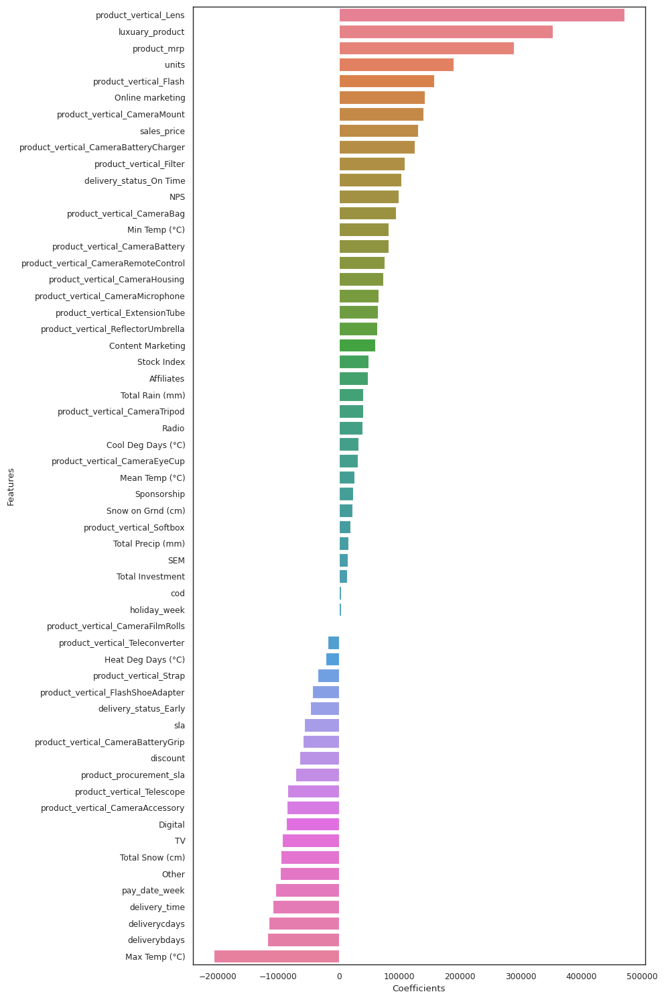

In [331]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [332]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns]=scaler.fit_transform(X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns])
# Transform on test data
X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns]=scaler.transform(X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns])


X_gamingaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.32359,-3.08041,-1.84654,-1.87762,-0.71549,-0.71609,-5.10024,-2.15059,-2.50569,-1.98677,-1.85168,-0.17150,-2.62271,0.00000,-2.49088,-2.15999,-0.48646,0.00000,-1.56411,-2.11704,-0.79208,-1.92434,-2.07626,-0.73148,0.00000,-0.97519,0.00000,-1.44164,-1.64963,-0.81650,-0.58835,-1.32838,-1.23527,-0.59889,-1.09556,-0.62774,-1.74925,-1.82492,-0.63869,-0.45114,-0.44117,-1.33297,-2.04053,-1.90308,-2.43036,-2.17962,-0.96259,-0.76270,-0.77446,-0.32756,-0.84757,-0.26642
25%,-0.56283,-0.44559,-0.84520,-0.34854,-0.71549,-0.71609,-0.17291,-0.63560,-0.24117,-1.02001,-0.45427,-0.17150,-0.18616,0.00000,-0.34837,-0.62063,-0.48646,0.00000,-0.77618,-0.60291,-0.56208,-0.51191,-0.56607,-0.65506,0.00000,-0.63243,0.00000,-0.92376,-0.72373,-0.81650,-0.58835,-0.55744,-0.83477,-0.44629,-0.78979,-0.58921,-0.75909,-0.70212,-0.39846,-0.45114,-0.44117,-0.73317,-0.41470,-0.67060,-0.80877,-0.73872,-0.94336,-0.76270,-0.65022,-0.32756,-0.68843,-0.26642
50%,0.11766,0.09767,0.10273,-0.19504,-0.71287,-0.71328,0.22798,0.11344,0.04915,0.40861,0.24406,-0.17150,0.10828,0.00000,0.18921,-0.06950,-0.48646,0.00000,-0.01201,-0.10459,-0.34851,-0.09668,0.08116,-0.27294,0.00000,-0.52419,0.00000,-0.08425,0.11445,-0.81650,-0.58835,-0.14475,0.00143,-0.29868,-0.14508,-0.22952,0.29903,0.33777,-0.35775,-0.45114,-0.44117,0.00995,0.46377,0.18679,0.07315,-0.00236,-0.23303,-0.76270,-0.40176,-0.32756,-0.44361,-0.26642
75%,0.48690,0.63023,0.56000,0.01265,1.38930,1.35461,0.43866,0.47152,0.50640,0.81944,0.62318,-0.17150,0.40542,0.00000,0.73457,0.72868,0.22296,0.00000,0.50412,0.68122,-0.02406,0.34307,0.76434,0.14739,0.00000,0.33271,0.00000,0.85248,0.54329,1.22474,0.55566,0.73875,0.67185,-0.08691,0.55514

In [333]:
gamingaccessory_model3 = LinearRegression().fit(X_gamingaccessory_model3_train , y_gamingaccessory_model3_train)
y_gamingaccessory_model3_test_pred = gamingaccessory_model3.predict(X_gamingaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))


R2 Score: 0.9242004299224752
Mean Squared Error: 157199499617.33704


In [334]:

# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  7055014.620678344
Minimumn Y :  598.0


In [335]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.056203644089451645

Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [336]:
gamingaccessory_model3_cvdf = gamingaccessory_model3_df.copy()

y_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf.pop('gmv')
X_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf


gamingaccessory_model3_cv = LinearRegression().fit(X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model3_cv, X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)))


Cross-Predicted Accuracy: -5.124262277934779
Mean Squared Error: 9790373446238.6


In [337]:

# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.4435458541900193

Determining Feature Importance for gamingaccessory from model without cv

In [338]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model3.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model3.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model3_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))



In [339]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df


,Features,Coefficients
9,luxuary_product,464743.319
19,product_vertical_GamingHeadset,284923.886
1,units,250236.390
13,product_vertical_GamePad,213713.622
43,Stock Index,144396.162
11,cod,127073.905
33,TV,105552.760
8,product_procurement_sla,101328.920
21,product_vertical_GamingMemoryCard,98186.579
48,Cool Deg Days (°C),86857.289


Determining Total Effect of KPIs from Koyck model

In [340]:
# Calculating the coefficient of lag variable
gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients


Series([], Name: Coefficients, dtype: float64)

In [341]:

gamingaccessory_lr_coef_df['Total Effect'] = gamingaccessory_lr_coef_df['Coefficients']/(1-(-5813.471))
gamingaccessory_lr_coef_df



,Features,Coefficients,Total Effect
9,luxuary_product,464743.319,79.929
19,product_vertical_GamingHeadset,284923.886,49.003
1,units,250236.390,43.037
13,product_vertical_GamePad,213713.622,36.755
43,Stock Index,144396.162,24.834
11,cod,127073.905,21.855
33,TV,105552.760,18.153
8,product_procurement_sla,101328.920,17.427
21,product_vertical_GamingMemoryCard,98186.579,16.887
48,Cool Deg Days (°C),86857.289,14.938


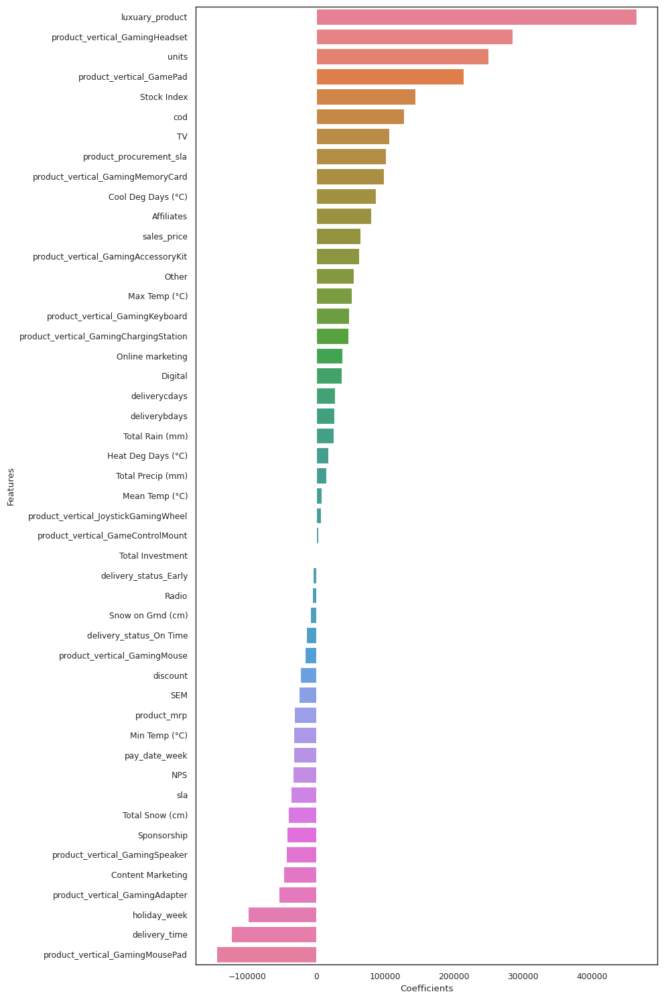

In [342]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [343]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model3_train[X_homeaudio_model3_train.columns]=scaler.fit_transform(X_homeaudio_model3_train[X_homeaudio_model3_train.columns])
# Transform on test data
X_homeaudio_model3_test[X_homeaudio_model3_test.columns]=scaler.transform(X_homeaudio_model3_test[X_homeaudio_model3_test.columns])


X_homeaudio_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
count,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000,32.00000
mean,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,0.00000,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600,1.01600
min,-2.92849,-1.60888,-4.47565,-1.96420,-0.71501,-0.71527,-1.72143,-4.19564,-2.66727,-1.93552,-2.09665,0.00000,-2.09296,-1.78363,-1.25613,-2.68995,-2.12754,-2.62960,0.00000,-0.17961,-0.24414,-0.71756,-2.43274,-1.58949,-1.87547,-0.88192,-0.72375,-1.56009,-1.40741,-0.62292,-1.23465,-0.68302,-2.24700,-2.37851,-0.68823,-0.51282,-0.51293,-1.44550,-1.76560,-1.88927,-2.37945,-2.14629,-1.09019,-0.61752,-0.82586,-0.36739,-0.91308,-0.27956
25%,-0.52972,-0.60698,-0.27156,-0.73780,-0.71501,-0.71527,-0.48499,-0.47893,-0.61372,-1.00729,-0.44302,0.00000,-0.63986,-0.73706,-0.75783,-0.29778,-0.72456,-0.61657,0.00000,-0.17961,-0.24414,-0.71756,-0.68818,-1.19496,-0.84049,-0.88192,-0.72375,-0.69518,-0.81179,-0.49782,-0.88471,-0.63900,0.00203,0.02815,-0.41919,-0.51282,-0.51293,-0.68248,-0.87810,-0.60177,-0.75752,-0.64636,-0.94033,-0.61752,-0.67174,-0.36739,-0.71359,-0.27956
50%,0.02679,-0.01966,0.03157,-0.26450,-0.71188,-0.71215,-0.17370,0.08390,-0.09345,0.47899,0.07867,0.00000,-0.33163,0.00319,-0.25953,0.14411,0.01385,-0.03359,0.00000,-0.17961,-0.24414,-0.71756,0.00438,0.41447,-0.03628,-0.88192,-0.72375,-0.25770,-0.01668,-0.33302,-0.24177,-0.29310,0.12761,0.22146,-0.31376,-0.51282,-0.51293,-0.08988,0.46067,0.09796,0.18615,-0.03251,-0.16395,-0.61752,-0.41303,-0.36739,-0.27339,-0.27956
75%,0.67581,0.39948,0.52214,0.63822,1.17129,1.18879,0.35958,0.59672,0.62942,0.72142,0.61524,0.00000,0.82425,0.62858,0.65402,0.82023,0.67841,0.54149,0.00000,-0.17961,-0.24414,0.32616,0.49531,0.76423,0.66653,1.13389,1.38170,0.68822,0.52726,-0.09605,0.43695,-0.02057,0.47544,0.59647,-0.25110,0.72848,-0.00911,0.44504,0.79762,0.82568,0.80544,0.87801,0.59837,0.40942,0.27228,-0.36739,0.23441,-0.27956
max,1.72016,3.20224,1.39378,2.14923,1.85385,1.83986,3.61833,1.41505,2.58203,1.28862,1.73690,0.00000,2.17827,2.14738,2.73027,1.72893,2.00755,2.12169,0.00000,5.56776,4.96411,2.93548,3.07270,1.45673,1.98473,1.13389,1.38170,2.33119,1.92803,3.03635,2.20491,2.92692,1.26428,1.15319,3

In [344]:
homeaudio_model3 = LinearRegression().fit(X_homeaudio_model3_train, y_homeaudio_model3_train)
y_homeaudio_model3_test_pred = homeaudio_model3.predict(X_homeaudio_model3_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))


R2 Score: 0.989543570436615
Mean Squared Error: 141918571695.4763


In [345]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  18461860.0
Minimumn Y :  2599.0


In [346]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.020408228368021024

In [347]:
homeaudio_model3_cvdf = homeaudio_model3_df.copy()

y_homeaudio_model3_cvdf = homeaudio_model3_cvdf.pop('gmv')
X_homeaudio_model3_cvdf = homeaudio_model3_cvdf


homeaudio_model3_cv = LinearRegression().fit(X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model3_cv, X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)))


Cross-Predicted Accuracy: 0.9473387659375396
Mean Squared Error: 321269194775.0941


In [348]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03070578692665421

Determining Feature Importance for homeaudio with model without cv

In [349]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model3.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model3.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model3_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))


homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
1,units,472955.656
16,product_vertical_FMRadio,416577.308
18,product_vertical_HomeAudioSpeaker,411993.541
9,luxuary_product,314891.219
24,delivery_status_Early,275211.189
2,sales_price,175312.241
13,product_vertical_BoomBox,118082.518
42,Mean Temp (°C),105130.421
23,product_vertical_VoiceRecorder,92715.262
4,product_mrp,88558.506


In [351]:

# Calculating the coefficient of lag variable

homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

homeaudio_lr_coef_df['Total Effect'] = homeaudio_lr_coef_df['Coefficients']/(1-(67433.863))
homeaudio_lr_coef_df


,Features,Coefficients,Total Effect
1,units,472955.656,-7.014
16,product_vertical_FMRadio,416577.308,-6.178
18,product_vertical_HomeAudioSpeaker,411993.541,-6.110
9,luxuary_product,314891.219,-4.670
24,delivery_status_Early,275211.189,-4.081
2,sales_price,175312.241,-2.600
13,product_vertical_BoomBox,118082.518,-1.751
42,Mean Temp (°C),105130.421,-1.559
23,product_vertical_VoiceRecorder,92715.262,-1.375
4,product_mrp,88558.506,-1.313


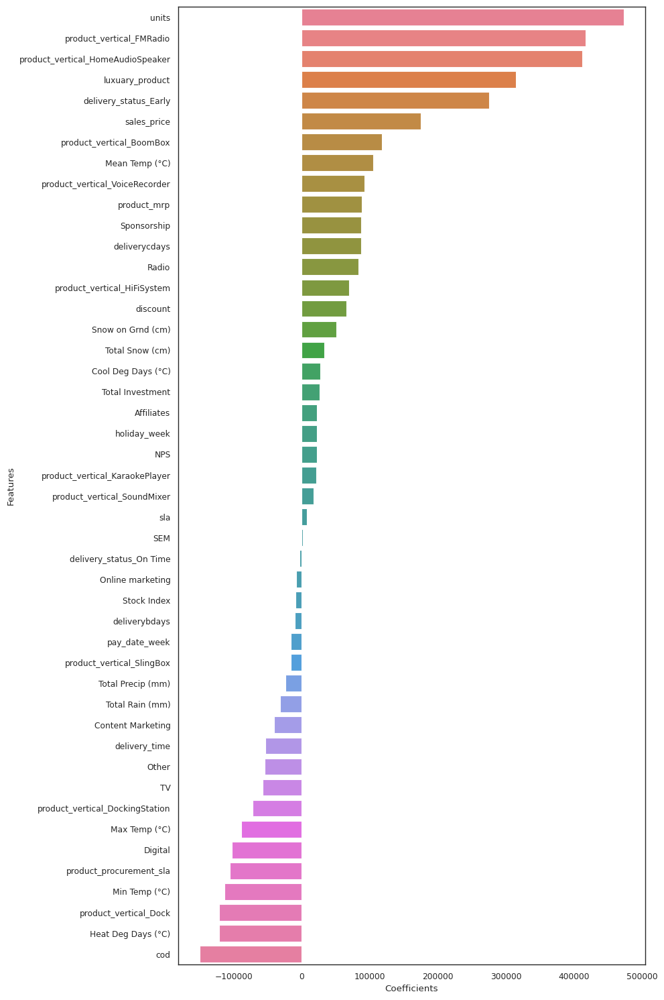

In [352]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

# Model 4: Distributive Lag Model(Additive)

The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.
In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables.
Yt = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

    + β1X1t + β1X1t-1 + β1X1t-2 + ....

    + β2X2t + β2X2t-1 + β2X2t-2 + ....

    + β3X3t + β3X3t-1 + β3X3t-2 + ....

    + β4X4t + β4X4t-1 + β4X4t-2 + ....

    + β5X5t + β5X5t-1 + β5X5t-2 + ....

    + ϵ

In [353]:
# Copying the datasets for preparing model data

cameraaccessory_model4_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model4_df = gaming_accessory_df.drop(columns="week")
homeaudio_model4_df = home_audio_df.drop(columns="week")



In [354]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [355]:
cameraaccessory_model4_df_columns = cameraaccessory_model4_df.columns
gamingaccessory_model4_df_columns = gamingaccessory_model4_df.columns
homeaudio_model4_df_columns = homeaudio_model4_df.columns


In [361]:
def lag_variables(df, columns, lag):
    for col in columns:
        lagged_col_name = f"{col}_Lag{lag}"
        df[lagged_col_name] = df[col].shift(lag)
    return df
cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df, cameraaccessory_model4_df_columns, 3)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df, gamingaccessory_model4_df_columns, 3)
homeaudio_model4_df = lag_variables(homeaudio_model4_df, homeaudio_model4_df_columns, 3)



cameraaccessory_model4_df.head()


,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_CameraAccessory_Lag3,product_vertical_CameraBag_Lag3,product_vertical_CameraBattery_Lag3,product_vertical_CameraBatteryCharger_Lag3,product_vertical_CameraBatteryGrip_Lag3,product_vertical_CameraEyeCup_Lag3,product_vertical_CameraFilmRolls_Lag3,product_vertical_CameraHousing_Lag3,product_vertical_CameraMicrophone_Lag3,product_vertical_CameraMount_Lag3,product_vertical_CameraRemoteControl_Lag3,product_vertical_CameraStorageMemoryCard_Lag3,product_vertical_CameraTripod_Lag3,product_vertical_DSLR_Lag3,product_vertical_ExtensionTube_Lag3,product_vertical_Filter_Lag3,product_vertical_Flash_Lag3,product_vertical_FlashShoeAdapter_Lag3,product_vertical_Instant Cameras_Lag3,product_vertical_Lens_Lag3,product_vertical_ReflectorUmbrella_Lag3,product_vertical_Softbox_Lag3,product_vertical_Strap_Lag3,product_vertical_Teleconverter_Lag3,product_vertical_Telescope_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3
1,5191790.000,5444,954.413,49.970,1788.112,0.000,0.000,5.857,2.885,406,15926,4363,48,285,556,262,6,2,28,0,0,29,96,0,780,0,2,219,2077,0,0,651,0,0,31,0,31,4180,459,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,11.000,-14.000,0.067,17.933,0.000,7.867,2.333,10.200,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3957750.000,3679,1078.305,48.992,1991.552,0.003,0.003,6.586,2.685,351,14082,2829,42,262,431,208,5,2,42,0,0,22,76,0,559,0,4,218,1008,0,0,484,0,0,34,0,23,3212,191,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,4.500,-12.000,-3.733,21.733,0.000,2.533,0.000,2.533,10.333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4862685.000,3462,1410.778,44.907,2382.362,0.000,0.000,6.894,2.614,454,14599,2699,49,311,547,218,9,0,30,0,0,32,65,0,362,0,3


Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [362]:
cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,2)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,2)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,2)


In [363]:


cameraaccessory_model4_df.head()

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_CameraAccessory_Lag3,product_vertical_CameraBag_Lag3,product_vertical_CameraBattery_Lag3,product_vertical_CameraBatteryCharger_Lag3,product_vertical_CameraBatteryGrip_Lag3,product_vertical_CameraEyeCup_Lag3,product_vertical_CameraFilmRolls_Lag3,product_vertical_CameraHousing_Lag3,product_vertical_CameraMicrophone_Lag3,product_vertical_CameraMount_Lag3,product_vertical_CameraRemoteControl_Lag3,product_vertical_CameraStorageMemoryCard_Lag3,product_vertical_CameraTripod_Lag3,product_vertical_DSLR_Lag3,product_vertical_ExtensionTube_Lag3,product_vertical_Filter_Lag3,product_vertical_Flash_Lag3,product_vertical_FlashShoeAdapter_Lag3,product_vertical_Instant Cameras_Lag3,product_vertical_Lens_Lag3,product_vertical_ReflectorUmbrella_Lag3,product_vertical_Softbox_Lag3,product_vertical_Strap_Lag3,product_vertical_Teleconverter_Lag3,product_vertical_Telescope_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_CameraAccessory_Lag2,product_vertical_CameraBag_Lag2,product_vertical_CameraBattery_Lag2,product_vertical_CameraBatteryCharger_Lag2,product_vertical_CameraBatteryGrip_Lag2,product_vertical_CameraEyeCup_Lag2,product_vertical_CameraFilmRolls_Lag2,product_vertical_CameraHousing_Lag2,product_vertical_CameraMicrophone_Lag2,product_vertical_CameraMount_Lag2,product_vertical_CameraRemoteControl_Lag2,product_vertical_CameraStorageMemoryCard_Lag2,product_vertical_CameraTripod_Lag2,product_vertical_DSLR_Lag2,product_vertical_ExtensionTube_Lag2,product_vertical_Filter_Lag2,product_vertical_Flash_Lag2,product_vertical_FlashShoeAdapter_Lag2,product_vertical_Instant Cameras_Lag2,product_vertical_Lens_Lag2,product_vertical_ReflectorUmbrella_Lag2,product_vertical_Softbox_Lag2,product_vertical_Strap_Lag2,product_vertical_Teleconverter_Lag2,product_vertical_Telescope_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_

In [364]:
cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,1)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,1)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,1)


In [365]:
cameraaccessory_model4_df.head()


,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_CameraAccessory_Lag3,product_vertical_CameraBag_Lag3,product_vertical_CameraBattery_Lag3,product_vertical_CameraBatteryCharger_Lag3,product_vertical_CameraBatteryGrip_Lag3,product_vertical_CameraEyeCup_Lag3,product_vertical_CameraFilmRolls_Lag3,product_vertical_CameraHousing_Lag3,product_vertical_CameraMicrophone_Lag3,product_vertical_CameraMount_Lag3,product_vertical_CameraRemoteControl_Lag3,product_vertical_CameraStorageMemoryCard_Lag3,product_vertical_CameraTripod_Lag3,product_vertical_DSLR_Lag3,product_vertical_ExtensionTube_Lag3,product_vertical_Filter_Lag3,product_vertical_Flash_Lag3,product_vertical_FlashShoeAdapter_Lag3,product_vertical_Instant Cameras_Lag3,product_vertical_Lens_Lag3,product_vertical_ReflectorUmbrella_Lag3,product_vertical_Softbox_Lag3,product_vertical_Strap_Lag3,product_vertical_Teleconverter_Lag3,product_vertical_Telescope_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_CameraAccessory_Lag2,product_vertical_CameraBag_Lag2,product_vertical_CameraBattery_Lag2,product_vertical_CameraBatteryCharger_Lag2,product_vertical_CameraBatteryGrip_Lag2,product_vertical_CameraEyeCup_Lag2,product_vertical_CameraFilmRolls_Lag2,product_vertical_CameraHousing_Lag2,product_vertical_CameraMicrophone_Lag2,product_vertical_CameraMount_Lag2,product_vertical_CameraRemoteControl_Lag2,product_vertical_CameraStorageMemoryCard_Lag2,product_vertical_CameraTripod_Lag2,product_vertical_DSLR_Lag2,product_vertical_ExtensionTube_Lag2,product_vertical_Filter_Lag2,product_vertical_Flash_Lag2,product_vertical_FlashShoeAdapter_Lag2,product_vertical_Instant Cameras_Lag2,product_vertical_Lens_Lag2,product_vertical_ReflectorUmbrella_Lag2,product_vertical_Softbox_Lag2,product_vertical_Strap_Lag2,product_vertical_Teleconverter_Lag2,product_vertical_Telescope_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_

In [366]:

# Imputing the null values with 0

cameraaccessory_model4_df.fillna(value=0, inplace=True)
gamingaccessory_model4_df.fillna(value=0, inplace=True)
homeaudio_model4_df.fillna(value=0, inplace=True)


print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [367]:
# Train test split

cameraaccessory_model4_train, cameraaccessory_model4_test = train_test_split(cameraaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model4_train, gamingaccessory_model4_test = train_test_split(gamingaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model4_train, homeaudio_model4_test = train_test_split(homeaudio_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)


# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model4_train = cameraaccessory_model4_train.pop('gmv')
X_cameraaccessory_model4_train = cameraaccessory_model4_train

y_gamingaccessory_model4_train = gamingaccessory_model4_train.pop('gmv')
X_gamingaccessory_model4_train = gamingaccessory_model4_train

y_homeaudio_model4_train = homeaudio_model4_train.pop('gmv')
X_homeaudio_model4_train = homeaudio_model4_train


# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model4_test = cameraaccessory_model4_test.pop('gmv')
X_cameraaccessory_model4_test = cameraaccessory_model4_test

y_gamingaccessory_model4_test = gamingaccessory_model4_test.pop('gmv')
X_gamingaccessory_model4_test = gamingaccessory_model4_test

y_homeaudio_model4_test = homeaudio_model4_test.pop('gmv')
X_homeaudio_model4_test = homeaudio_model4_test


In [368]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns]=scaler.fit_transform(X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns])
# Transform on test data
X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns]=scaler.transform(X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns])


X_cameraaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_CameraAccessory_Lag3,product_vertical_CameraBag_Lag3,product_vertical_CameraBattery_Lag3,product_vertical_CameraBatteryCharger_Lag3,product_vertical_CameraBatteryGrip_Lag3,product_vertical_CameraEyeCup_Lag3,product_vertical_CameraFilmRolls_Lag3,product_vertical_CameraHousing_Lag3,product_vertical_CameraMicrophone_Lag3,product_vertical_CameraMount_Lag3,product_vertical_CameraRemoteControl_Lag3,product_vertical_CameraStorageMemoryCard_Lag3,product_vertical_CameraTripod_Lag3,product_vertical_DSLR_Lag3,product_vertical_ExtensionTube_Lag3,product_vertical_Filter_Lag3,product_vertical_Flash_Lag3,product_vertical_FlashShoeAdapter_Lag3,product_vertical_Instant Cameras_Lag3,product_vertical_Lens_Lag3,product_vertical_ReflectorUmbrella_Lag3,product_vertical_Softbox_Lag3,product_vertical_Strap_Lag3,product_vertical_Teleconverter_Lag3,product_vertical_Telescope_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_CameraAccessory_Lag2,product_vertical_CameraBag_Lag2,product_vertical_CameraBattery_Lag2,product_vertical_CameraBatteryCharger_Lag2,product_vertical_CameraBatteryGrip_Lag2,product_vertical_CameraEyeCup_Lag2,product_vertical_CameraFilmRolls_Lag2,product_vertical_CameraHousing_Lag2,product_vertical_CameraMicrophone_Lag2,product_vertical_CameraMount_Lag2,product_vertical_CameraRemoteControl_Lag2,product_vertical_CameraStorageMemoryCard_Lag2,product_vertical_CameraTripod_Lag2,product_vertical_DSLR_Lag2,product_vertical_ExtensionTube_Lag2,product_vertical_Filter_Lag2,product_vertical_Flash_Lag2,product_vertical_FlashShoeAdapter_Lag2,product_vertical_Instant Cameras_Lag2,product_vertical_Lens_Lag2,product_vertical_ReflectorUmbrella_Lag2,product_vertical_Softbox_Lag2,product_vertical_Strap_Lag2,product_vertical_Teleconverter_Lag2,product_vertical_Telescope_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2

In [369]:
cameraaccessory_model4 = LinearRegression().fit(X_cameraaccessory_model4_train, y_cameraaccessory_model4_train)
y_cameraaccessory_model4_test_pred = cameraaccessory_model4.predict(X_cameraaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))


R2 Score: 0.918148115426783
Mean Squared Error: 492169432572.68536


In [370]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12366735.76009569
Minimumn Y :  299.0


In [371]:

# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.056729994008531265

In [372]:
cameraaccessory_model4_cvdf = cameraaccessory_model4_df.copy()

y_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf.pop('gmv')
X_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf


In [373]:
cameraaccessory_model4_cv = LinearRegression().fit(X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model4_cv, X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)))
     # Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

Cross-Predicted Accuracy: 0.49074982819703794
Mean Squared Error: 1910931720354.921


0.11178357730860439

In [374]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model4.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model4.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model4_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))



In [375]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df


,Features,Coefficients
9,luxuary_product,160342.091
31,product_vertical_Lens,131821.176
13,product_vertical_CameraBag,110536.450
19,product_vertical_CameraHousing,105967.042
27,product_vertical_Filter,102243.208
1,units,94105.773
4,product_mrp,92402.772
14,product_vertical_CameraBattery,91546.119
22,product_vertical_CameraRemoteControl,90383.794
15,product_vertical_CameraBatteryCharger,82169.839


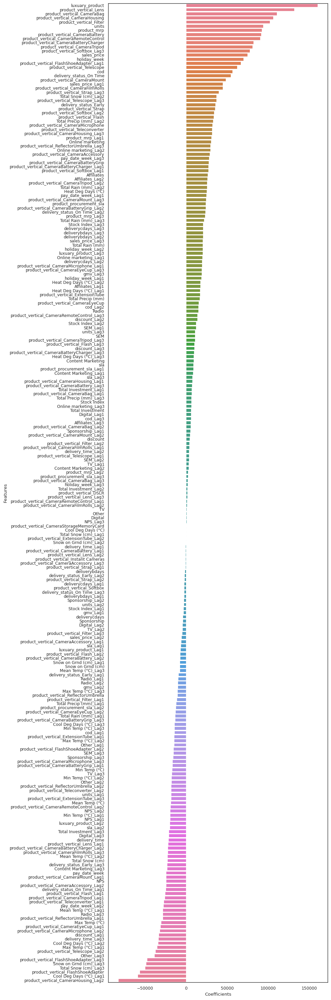

In [376]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


In [377]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns]=scaler.fit_transform(X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns])
# Transform on test data
X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns]=scaler.transform(X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns])


X_gamingaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_GameControlMount_Lag3,product_vertical_GamePad_Lag3,product_vertical_GameValueCards_Lag3,product_vertical_GamingAccessoryKit_Lag3,product_vertical_GamingAdapter_Lag3,product_vertical_GamingChargingStation_Lag3,product_vertical_GamingConsole_Lag3,product_vertical_GamingHeadset_Lag3,product_vertical_GamingKeyboard_Lag3,product_vertical_GamingMemoryCard_Lag3,product_vertical_GamingMouse_Lag3,product_vertical_GamingMousePad_Lag3,product_vertical_GamingSpeaker_Lag3,product_vertical_HandheldGamingConsole_Lag3,product_vertical_JoystickGamingWheel_Lag3,product_vertical_PhysicalGame_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_GameControlMount_Lag2,product_vertical_GamePad_Lag2,product_vertical_GameValueCards_Lag2,product_vertical_GamingAccessoryKit_Lag2,product_vertical_GamingAdapter_Lag2,product_vertical_GamingChargingStation_Lag2,product_vertical_GamingConsole_Lag2,product_vertical_GamingHeadset_Lag2,product_vertical_GamingKeyboard_Lag2,product_vertical_GamingMemoryCard_Lag2,product_vertical_GamingMouse_Lag2,product_vertical_GamingMousePad_Lag2,product_vertical_GamingSpeaker_Lag2,product_vertical_HandheldGamingConsole_Lag2,product_vertical_JoystickGamingWheel_Lag2,product_vertical_PhysicalGame_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2,Content Marketing_Lag2,Online marketing_Lag2,Affiliates_Lag2,SEM_Lag2,Radio_Lag2,Other_Lag2,NPS_Lag2,Stock Index_Lag2,Max Temp (°C)_Lag2,Min Temp (°C)_Lag2,Mean Temp (°C)_Lag2,Heat Deg Days (°C)_Lag2,Cool Deg Days (°C)_Lag2,Total Rain (mm)_Lag2,Total Snow (cm)_Lag2,Total Precip (mm)_Lag2,Snow on Grnd (cm)_Lag2,gmv_Lag1,units_Lag1,sales_price_Lag1,discount_Lag1,product_mrp_Lag1,deliverybdays_Lag1,deliverycdays_Lag1,sla_Lag1,product_procurement_sla_Lag1,luxuary_product_Lag1,delivery_time_Lag1,cod_Lag1,product_vertical_GameControlMount_Lag1,product_vertical_GamePad_Lag1,product_vertical_GameValueCards_Lag1,product_vertical_GamingAccessoryKit_Lag1,product_vertical_GamingAdapter_Lag1,product_vertical_GamingChargingStation_Lag1,product_vertical_GamingConsole_Lag1,product_vertical_GamingHeadse

In [378]:

gamingaccessory_model4 = LinearRegression().fit(X_gamingaccessory_model4_train , y_gamingaccessory_model4_train)
y_gamingaccessory_model4_test_pred = gamingaccessory_model4.predict(X_gamingaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))


R2 Score: 0.9587062079565135
Mean Squared Error: 85638525916.43109


In [379]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7055014.620678344
Minimumn Y :  598.0


In [380]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE



0.041483318115645026

In [381]:
gamingaccessory_model4_cvdf = gamingaccessory_model4_df.copy()

y_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf.pop('gmv')
X_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf


gamingaccessory_model4_cv = LinearRegression().fit(X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model4_cv, X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)))


Cross-Predicted Accuracy: 0.8795819579043979
Mean Squared Error: 192502794341.19626


In [382]:

# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.06219527813530178

In [383]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model4.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model4.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model4_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))


# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
9,luxuary_product,167468.655
13,product_vertical_GamePad,140966.772
1,units,120999.435
22,product_vertical_GamingMouse,104623.853
20,product_vertical_GamingKeyboard,99144.247
19,product_vertical_GamingHeadset,96692.868
15,product_vertical_GamingAccessoryKit,93737.820
24,product_vertical_GamingSpeaker,68952.403
16,product_vertical_GamingAdapter,68381.856
26,product_vertical_JoystickGamingWheel,60650.956


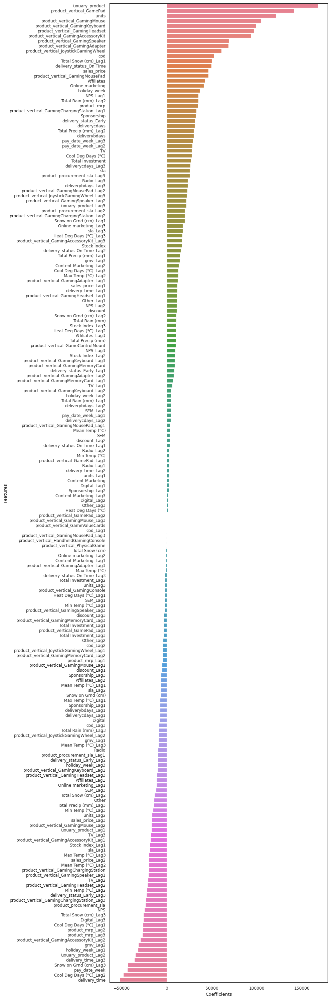

In [384]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [385]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model4_train[X_homeaudio_model4_train.columns]=scaler.fit_transform(X_homeaudio_model4_train[X_homeaudio_model4_train.columns])
# Transform on test data
X_homeaudio_model4_test[X_homeaudio_model4_test.columns]=scaler.transform(X_homeaudio_model4_test[X_homeaudio_model4_test.columns])


X_homeaudio_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))


,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_AudioMP3Player_Lag3,product_vertical_BoomBox_Lag3,product_vertical_Dock_Lag3,product_vertical_DockingStation_Lag3,product_vertical_FMRadio_Lag3,product_vertical_HiFiSystem_Lag3,product_vertical_HomeAudioSpeaker_Lag3,product_vertical_HomeTheatre_Lag3,product_vertical_KaraokePlayer_Lag3,product_vertical_SlingBox_Lag3,product_vertical_SoundMixer_Lag3,product_vertical_VoiceRecorder_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_AudioMP3Player_Lag2,product_vertical_BoomBox_Lag2,product_vertical_Dock_Lag2,product_vertical_DockingStation_Lag2,product_vertical_FMRadio_Lag2,product_vertical_HiFiSystem_Lag2,product_vertical_HomeAudioSpeaker_Lag2,product_vertical_HomeTheatre_Lag2,product_vertical_KaraokePlayer_Lag2,product_vertical_SlingBox_Lag2,product_vertical_SoundMixer_Lag2,product_vertical_VoiceRecorder_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2,Content Marketing_Lag2,Online marketing_Lag2,Affiliates_Lag2,SEM_Lag2,Radio_Lag2,Other_Lag2,NPS_Lag2,Stock Index_Lag2,Max Temp (°C)_Lag2,Min Temp (°C)_Lag2,Mean Temp (°C)_Lag2,Heat Deg Days (°C)_Lag2,Cool Deg Days (°C)_Lag2,Total Rain (mm)_Lag2,Total Snow (cm)_Lag2,Total Precip (mm)_Lag2,Snow on Grnd (cm)_Lag2,gmv_Lag1,units_Lag1,sales_price_Lag1,discount_Lag1,product_mrp_Lag1,deliverybdays_Lag1,deliverycdays_Lag1,sla_Lag1,product_procurement_sla_Lag1,luxuary_product_Lag1,delivery_time_Lag1,cod_Lag1,product_vertical_AudioMP3Player_Lag1,product_vertical_BoomBox_Lag1,product_vertical_Dock_Lag1,product_vertical_DockingStation_Lag1,product_vertical_FMRadio_Lag1,product_vertical_HiFiSystem_Lag1,product_vertical_HomeAudioSpeaker_Lag1,product_vertical_HomeTheatre_Lag1,product_vertical_KaraokePlayer_Lag1,product_vertical_SlingBox_Lag1,product_vertical_SoundMixer_Lag1,product_vertical_VoiceRecorder_Lag1,delivery_status_Early_Lag1,delivery_status_On Time_Lag1,pay_date_week_Lag1,holiday_week_Lag1,Total Investment_Lag1,TV_Lag1,Digital_Lag1,Sponsorship_Lag1,Content Marketing_Lag1,Online marketing_Lag1,Affiliates_Lag1,SEM_Lag1,Radio_Lag1,Other_Lag1,NPS_Lag1,Stock Index_Lag1,Max Temp (°C)_Lag1,Min Temp (°C)_Lag1,Mean Temp (°C)_Lag1,Heat Deg Days (°C)_Lag1,Cool Deg Days (°C)_Lag1,Total Rain (mm)_Lag1,Total Snow (cm)_Lag1,Total Precip (mm)_Lag1,Snow on Grnd (cm)_Lag1
coun

In [386]:

homeaudio_model4 = LinearRegression().fit(X_homeaudio_model4_train, y_homeaudio_model4_train)
y_homeaudio_model4_test_pred = homeaudio_model4.predict(X_homeaudio_model4_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))


R2 Score: 0.7985830446132581
Mean Squared Error: 2733706228350.8745


In [387]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  18461860.0
Minimumn Y :  2599.0


In [388]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.08956980127807707

In [389]:
homeaudio_model4_cvdf = homeaudio_model4_df.copy()

y_homeaudio_model4_cvdf = homeaudio_model4_cvdf.pop('gmv')
X_homeaudio_model4_cvdf = homeaudio_model4_cvdf


homeaudio_model4_cv = LinearRegression().fit(X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model4_cv, X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)))



Cross-Predicted Accuracy: 0.9679194202276021
Mean Squared Error: 195713264508.2361


In [390]:

# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE


0.023966014629237333

In [391]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model4_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model4_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model4_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))


# Creating dataframe of parameter and coefficient

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df


,Features,Coefficients
25,delivery_status_On Time,2263.996
17,product_vertical_HiFiSystem,1474.174
28,Total Investment,1470.457
1,units,1426.828
2,sales_price,1112.833
16,product_vertical_FMRadio,1068.993
112,product_vertical_Dock_Lag2,1013.021
24,delivery_status_Early,1004.587
192,Total Rain (mm)_Lag1,966.316
164,product_vertical_HiFiSystem_Lag1,923.180


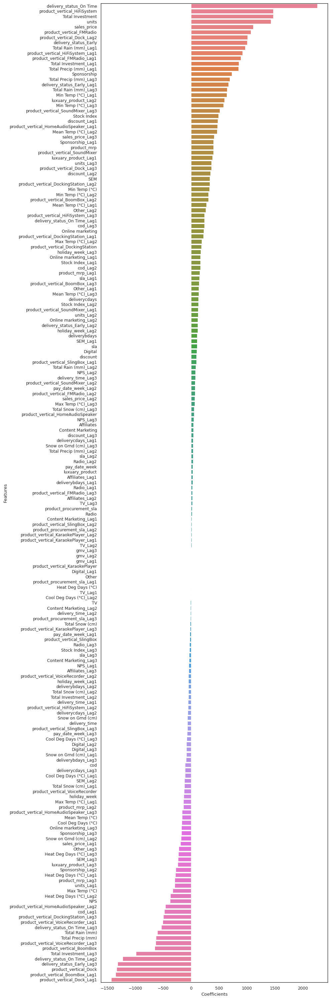

In [392]:

# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

# Model 5: Distributive Lag Model(Multiplicative)

The Distributive Lag Model(Multiplicative) will help us capture the interactions between current and carry over effects of the KPIs.
To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.
Yt = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....

    + β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....

    + β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....

    + β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....

    + β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....

    + β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....

    + ϵ'

In [393]:
# Copying the datasets for preparing model data

cameraaccessory_model5_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model5_df = gaming_accessory_df.drop(columns="week")
homeaudio_model5_df = home_audio_df.drop(columns="week")


print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables



In [394]:
cameraaccessory_model5_df_columns = cameraaccessory_model5_df.columns
gamingaccessory_model5_df_columns = gamingaccessory_model5_df.columns
homeaudio_model5_df_columns = homeaudio_model5_df.columns


# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,3)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,3)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,3)


In [395]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,2)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,2)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,2)


In [396]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,1)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,1)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,1)


# Imputing the null values with 0

cameraaccessory_model5_df.fillna(value=0, inplace=True)
gamingaccessory_model5_df.fillna(value=0, inplace=True)
homeaudio_model5_df.fillna(value=0, inplace=True)


print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [399]:
cameraaccessory_model5_df = cameraaccessory_model5_df.applymap(lambda x: np.log(x))
cameraaccessory_model5_df = cameraaccessory_model5_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model5_df = cameraaccessory_model5_df.replace(np.nan, 0)

gamingaccessory_model5_df = gamingaccessory_model5_df.applymap(lambda x: np.log(x))
gamingaccessory_model5_df = gamingaccessory_model5_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model5_df = gamingaccessory_model5_df.replace(np.nan, 0)

homeaudio_model5_df = homeaudio_model5_df.applymap(lambda x: np.log(x))
homeaudio_model5_df = homeaudio_model5_df.replace([np.inf, -np.inf], 0)
homeaudio_model5_df = homeaudio_model5_df.replace(np.nan, 0)


In [400]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))


Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [401]:
# Train test split

cameraaccessory_model5_train, cameraaccessory_model5_test = train_test_split(cameraaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model5_train, gamingaccessory_model5_test = train_test_split(gamingaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model5_train, homeaudio_model5_test = train_test_split(homeaudio_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)


# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model5_train = cameraaccessory_model5_train.pop('gmv')
X_cameraaccessory_model5_train = cameraaccessory_model5_train

y_gamingaccessory_model5_train = gamingaccessory_model5_train.pop('gmv')
X_gamingaccessory_model5_train = gamingaccessory_model5_train

y_homeaudio_model5_train = homeaudio_model5_train.pop('gmv')
X_homeaudio_model5_train = homeaudio_model5_train


# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model5_test = cameraaccessory_model5_test.pop('gmv')
X_cameraaccessory_model5_test = cameraaccessory_model5_test

y_gamingaccessory_model5_test = gamingaccessory_model5_test.pop('gmv')
X_gamingaccessory_model5_test = gamingaccessory_model5_test

y_homeaudio_model5_test = homeaudio_model5_test.pop('gmv')
X_homeaudio_model5_test = homeaudio_model5_test


In [402]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns]=scaler.fit_transform(X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns])
# Transform on test data
X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns]=scaler.transform(X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns])


X_cameraaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_CameraAccessory_Lag3,product_vertical_CameraBag_Lag3,product_vertical_CameraBattery_Lag3,product_vertical_CameraBatteryCharger_Lag3,product_vertical_CameraBatteryGrip_Lag3,product_vertical_CameraEyeCup_Lag3,product_vertical_CameraFilmRolls_Lag3,product_vertical_CameraHousing_Lag3,product_vertical_CameraMicrophone_Lag3,product_vertical_CameraMount_Lag3,product_vertical_CameraRemoteControl_Lag3,product_vertical_CameraStorageMemoryCard_Lag3,product_vertical_CameraTripod_Lag3,product_vertical_DSLR_Lag3,product_vertical_ExtensionTube_Lag3,product_vertical_Filter_Lag3,product_vertical_Flash_Lag3,product_vertical_FlashShoeAdapter_Lag3,product_vertical_Instant Cameras_Lag3,product_vertical_Lens_Lag3,product_vertical_ReflectorUmbrella_Lag3,product_vertical_Softbox_Lag3,product_vertical_Strap_Lag3,product_vertical_Teleconverter_Lag3,product_vertical_Telescope_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_CameraAccessory_Lag2,product_vertical_CameraBag_Lag2,product_vertical_CameraBattery_Lag2,product_vertical_CameraBatteryCharger_Lag2,product_vertical_CameraBatteryGrip_Lag2,product_vertical_CameraEyeCup_Lag2,product_vertical_CameraFilmRolls_Lag2,product_vertical_CameraHousing_Lag2,product_vertical_CameraMicrophone_Lag2,product_vertical_CameraMount_Lag2,product_vertical_CameraRemoteControl_Lag2,product_vertical_CameraStorageMemoryCard_Lag2,product_vertical_CameraTripod_Lag2,product_vertical_DSLR_Lag2,product_vertical_ExtensionTube_Lag2,product_vertical_Filter_Lag2,product_vertical_Flash_Lag2,product_vertical_FlashShoeAdapter_Lag2,product_vertical_Instant Cameras_Lag2,product_vertical_Lens_Lag2,product_vertical_ReflectorUmbrella_Lag2,product_vertical_Softbox_Lag2,product_vertical_Strap_Lag2,product_vertical_Teleconverter_Lag2,product_vertical_Telescope_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2

In [403]:
cameraaccessory_model5 = LinearRegression().fit(X_cameraaccessory_model5_train, y_cameraaccessory_model5_train)
y_cameraaccessory_model5_test_pred = cameraaccessory_model5.predict(X_cameraaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))



R2 Score: -0.1830054125734495
Mean Squared Error: 5.3281884404385265


In [404]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  12366735.76009569
Minimumn Y :  299.0


In [405]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))


0.00000019


In [406]:
cameraaccessory_model5_cvdf = cameraaccessory_model5_df.copy()

y_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf.pop('gmv')
X_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf


cameraaccessory_model5_cv = LinearRegression().fit(X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model5_cv, X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)))


Cross-Predicted Accuracy: 0.9141653187337697
Mean Squared Error: 0.40201226342223034


In [407]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))


0.00000005


In [408]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model5_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model5_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model5_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [409]:

# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df



,Features,Coefficients
1,units,0.143
24,product_vertical_CameraTripod,0.122
31,product_vertical_Lens,0.105
37,delivery_status_Early,0.098
14,product_vertical_CameraBattery,0.098
9,luxuary_product,0.097
13,product_vertical_CameraBag,0.093
38,delivery_status_On Time,0.082
80,product_vertical_CameraFilmRolls_Lag3,0.078
27,product_vertical_Filter,0.076


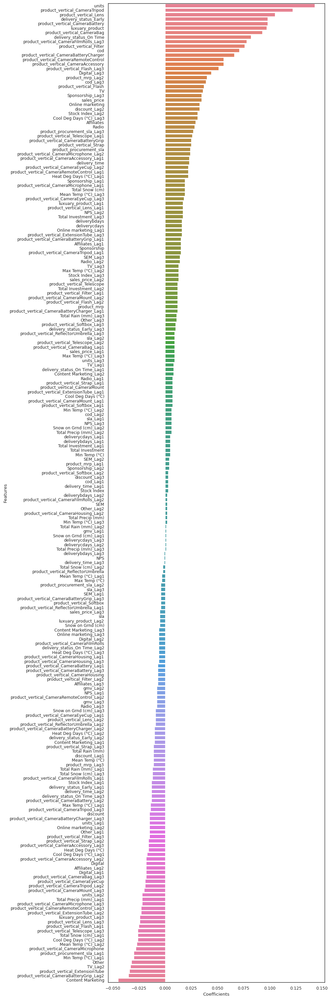

In [410]:

# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [411]:

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns]=scaler.fit_transform(X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns])
# Transform on test data
X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns]=scaler.transform(X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns])


X_gamingaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))



,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_GameControlMount_Lag3,product_vertical_GamePad_Lag3,product_vertical_GameValueCards_Lag3,product_vertical_GamingAccessoryKit_Lag3,product_vertical_GamingAdapter_Lag3,product_vertical_GamingChargingStation_Lag3,product_vertical_GamingConsole_Lag3,product_vertical_GamingHeadset_Lag3,product_vertical_GamingKeyboard_Lag3,product_vertical_GamingMemoryCard_Lag3,product_vertical_GamingMouse_Lag3,product_vertical_GamingMousePad_Lag3,product_vertical_GamingSpeaker_Lag3,product_vertical_HandheldGamingConsole_Lag3,product_vertical_JoystickGamingWheel_Lag3,product_vertical_PhysicalGame_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_GameControlMount_Lag2,product_vertical_GamePad_Lag2,product_vertical_GameValueCards_Lag2,product_vertical_GamingAccessoryKit_Lag2,product_vertical_GamingAdapter_Lag2,product_vertical_GamingChargingStation_Lag2,product_vertical_GamingConsole_Lag2,product_vertical_GamingHeadset_Lag2,product_vertical_GamingKeyboard_Lag2,product_vertical_GamingMemoryCard_Lag2,product_vertical_GamingMouse_Lag2,product_vertical_GamingMousePad_Lag2,product_vertical_GamingSpeaker_Lag2,product_vertical_HandheldGamingConsole_Lag2,product_vertical_JoystickGamingWheel_Lag2,product_vertical_PhysicalGame_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2,Content Marketing_Lag2,Online marketing_Lag2,Affiliates_Lag2,SEM_Lag2,Radio_Lag2,Other_Lag2,NPS_Lag2,Stock Index_Lag2,Max Temp (°C)_Lag2,Min Temp (°C)_Lag2,Mean Temp (°C)_Lag2,Heat Deg Days (°C)_Lag2,Cool Deg Days (°C)_Lag2,Total Rain (mm)_Lag2,Total Snow (cm)_Lag2,Total Precip (mm)_Lag2,Snow on Grnd (cm)_Lag2,gmv_Lag1,units_Lag1,sales_price_Lag1,discount_Lag1,product_mrp_Lag1,deliverybdays_Lag1,deliverycdays_Lag1,sla_Lag1,product_procurement_sla_Lag1,luxuary_product_Lag1,delivery_time_Lag1,cod_Lag1,product_vertical_GameControlMount_Lag1,product_vertical_GamePad_Lag1,product_vertical_GameValueCards_Lag1,product_vertical_GamingAccessoryKit_Lag1,product_vertical_GamingAdapter_Lag1,product_vertical_GamingChargingStation_Lag1,product_vertical_GamingConsole_Lag1,product_vertical_GamingHeadse

In [412]:

gamingaccessory_model5 = LinearRegression().fit(X_gamingaccessory_model5_train , y_gamingaccessory_model5_train)
y_gamingaccessory_model5_test_pred = gamingaccessory_model5.predict(X_gamingaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))


R2 Score: 0.5390429783683097
Mean Squared Error: 0.002211798803878355


In [413]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  7055014.620678344
Minimumn Y :  598.0


In [414]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))



0.00000001


In [415]:
gamingaccessory_model5_cvdf = gamingaccessory_model5_df.copy()

y_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf.pop('gmv')
X_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf


gamingaccessory_model5_cv = LinearRegression().fit(X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model5_cv, X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)))


Cross-Predicted Accuracy: 0.30690551602635585
Mean Squared Error: 0.005049615118548951


In [416]:

# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000001


In [417]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model5_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model5_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model5_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))


In [418]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
172,product_vertical_GamePad_Lag1,0.033
1,units,0.023
11,cod,0.022
85,Total Investment_Lag3,0.021
117,cod_Lag2,0.019
138,Total Investment_Lag2,0.015
187,delivery_status_Early_Lag1,0.014
19,product_vertical_GamingHeadset,0.013
22,product_vertical_GamingMouse,0.012
9,luxuary_product,0.011


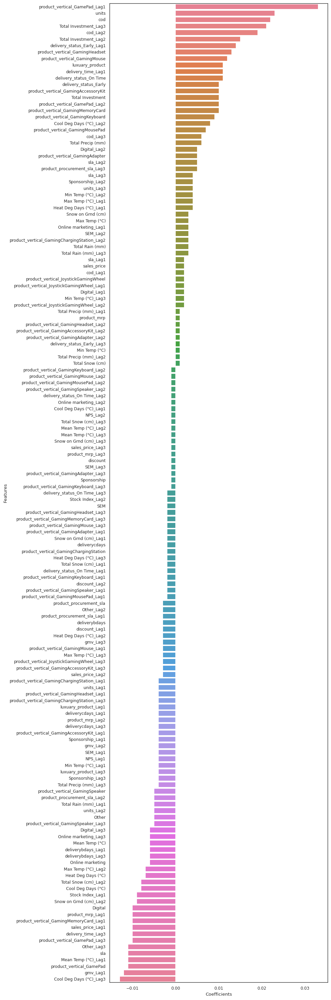

In [419]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


In [420]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model5_train[X_homeaudio_model5_train.columns]=scaler.fit_transform(X_homeaudio_model5_train[X_homeaudio_model5_train.columns])
# Transform on test data
X_homeaudio_model5_test[X_homeaudio_model5_test.columns]=scaler.transform(X_homeaudio_model5_test[X_homeaudio_model5_test.columns])


X_homeaudio_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))


,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),gmv_Lag3,units_Lag3,sales_price_Lag3,discount_Lag3,product_mrp_Lag3,deliverybdays_Lag3,deliverycdays_Lag3,sla_Lag3,product_procurement_sla_Lag3,luxuary_product_Lag3,delivery_time_Lag3,cod_Lag3,product_vertical_AudioMP3Player_Lag3,product_vertical_BoomBox_Lag3,product_vertical_Dock_Lag3,product_vertical_DockingStation_Lag3,product_vertical_FMRadio_Lag3,product_vertical_HiFiSystem_Lag3,product_vertical_HomeAudioSpeaker_Lag3,product_vertical_HomeTheatre_Lag3,product_vertical_KaraokePlayer_Lag3,product_vertical_SlingBox_Lag3,product_vertical_SoundMixer_Lag3,product_vertical_VoiceRecorder_Lag3,delivery_status_Early_Lag3,delivery_status_On Time_Lag3,pay_date_week_Lag3,holiday_week_Lag3,Total Investment_Lag3,TV_Lag3,Digital_Lag3,Sponsorship_Lag3,Content Marketing_Lag3,Online marketing_Lag3,Affiliates_Lag3,SEM_Lag3,Radio_Lag3,Other_Lag3,NPS_Lag3,Stock Index_Lag3,Max Temp (°C)_Lag3,Min Temp (°C)_Lag3,Mean Temp (°C)_Lag3,Heat Deg Days (°C)_Lag3,Cool Deg Days (°C)_Lag3,Total Rain (mm)_Lag3,Total Snow (cm)_Lag3,Total Precip (mm)_Lag3,Snow on Grnd (cm)_Lag3,gmv_Lag2,units_Lag2,sales_price_Lag2,discount_Lag2,product_mrp_Lag2,deliverybdays_Lag2,deliverycdays_Lag2,sla_Lag2,product_procurement_sla_Lag2,luxuary_product_Lag2,delivery_time_Lag2,cod_Lag2,product_vertical_AudioMP3Player_Lag2,product_vertical_BoomBox_Lag2,product_vertical_Dock_Lag2,product_vertical_DockingStation_Lag2,product_vertical_FMRadio_Lag2,product_vertical_HiFiSystem_Lag2,product_vertical_HomeAudioSpeaker_Lag2,product_vertical_HomeTheatre_Lag2,product_vertical_KaraokePlayer_Lag2,product_vertical_SlingBox_Lag2,product_vertical_SoundMixer_Lag2,product_vertical_VoiceRecorder_Lag2,delivery_status_Early_Lag2,delivery_status_On Time_Lag2,pay_date_week_Lag2,holiday_week_Lag2,Total Investment_Lag2,TV_Lag2,Digital_Lag2,Sponsorship_Lag2,Content Marketing_Lag2,Online marketing_Lag2,Affiliates_Lag2,SEM_Lag2,Radio_Lag2,Other_Lag2,NPS_Lag2,Stock Index_Lag2,Max Temp (°C)_Lag2,Min Temp (°C)_Lag2,Mean Temp (°C)_Lag2,Heat Deg Days (°C)_Lag2,Cool Deg Days (°C)_Lag2,Total Rain (mm)_Lag2,Total Snow (cm)_Lag2,Total Precip (mm)_Lag2,Snow on Grnd (cm)_Lag2,gmv_Lag1,units_Lag1,sales_price_Lag1,discount_Lag1,product_mrp_Lag1,deliverybdays_Lag1,deliverycdays_Lag1,sla_Lag1,product_procurement_sla_Lag1,luxuary_product_Lag1,delivery_time_Lag1,cod_Lag1,product_vertical_AudioMP3Player_Lag1,product_vertical_BoomBox_Lag1,product_vertical_Dock_Lag1,product_vertical_DockingStation_Lag1,product_vertical_FMRadio_Lag1,product_vertical_HiFiSystem_Lag1,product_vertical_HomeAudioSpeaker_Lag1,product_vertical_HomeTheatre_Lag1,product_vertical_KaraokePlayer_Lag1,product_vertical_SlingBox_Lag1,product_vertical_SoundMixer_Lag1,product_vertical_VoiceRecorder_Lag1,delivery_status_Early_Lag1,delivery_status_On Time_Lag1,pay_date_week_Lag1,holiday_week_Lag1,Total Investment_Lag1,TV_Lag1,Digital_Lag1,Sponsorship_Lag1,Content Marketing_Lag1,Online marketing_Lag1,Affiliates_Lag1,SEM_Lag1,Radio_Lag1,Other_Lag1,NPS_Lag1,Stock Index_Lag1,Max Temp (°C)_Lag1,Min Temp (°C)_Lag1,Mean Temp (°C)_Lag1,Heat Deg Days (°C)_Lag1,Cool Deg Days (°C)_Lag1,Total Rain (mm)_Lag1,Total Snow (cm)_Lag1,Total Precip (mm)_Lag1,Snow on Grnd (cm)_Lag1
coun

In [421]:
homeaudio_model5 = LinearRegression().fit(X_homeaudio_model5_train, y_homeaudio_model5_train)
y_homeaudio_model5_test_pred = homeaudio_model5.predict(X_homeaudio_model5_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))


R2 Score: -17.622551460800736
Mean Squared Error: 0.001883446236188534


In [422]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)



Maximumn Y :  18461860.0
Minimumn Y :  2599.0


In [423]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000000


In [424]:
homeaudio_model5_cvdf = homeaudio_model5_df.copy()

y_homeaudio_model5_cvdf = homeaudio_model5_cvdf.pop('gmv')
X_homeaudio_model5_cvdf = homeaudio_model5_cvdf


homeaudio_model5_cv = LinearRegression().fit(X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model5_cv, X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)))


Cross-Predicted Accuracy: -1.764144965023796
Mean Squared Error: 0.004701049668133399


In [425]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))


0.00000000


In [426]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model5_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model5_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model5_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))


# Creating dataframe of parameters and coefficients

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df



,Features,Coefficients
10,delivery_time,0.026
14,product_vertical_Dock,0.018
28,Total Investment,0.016
24,delivery_status_Early,0.016
11,cod,0.016
18,product_vertical_HomeAudioSpeaker,0.014
25,delivery_status_On Time,0.013
16,product_vertical_FMRadio,0.013
1,units,0.012
175,Total Investment_Lag1,0.012


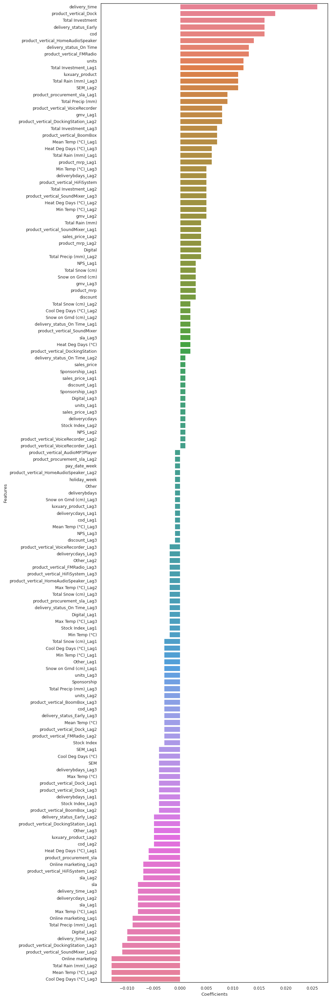

In [427]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()


# Model Selection and Evaluation

Model Selection
We will be checking the statistics of the each Model scores for the Camera Accessory, Gaming Accessory and Home Audio.

Camera Accessory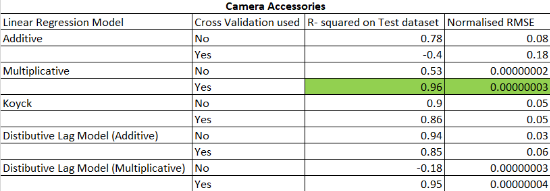

In [428]:
# Top 5 postively correlated KPI

cam_p = cameraaccessory_mul_lr_coef_df.iloc[:5,:]
cam_p


,Features,Coefficients
1,units,1.009
2,sales_price,0.875
4,product_mrp,0.191
5,deliverybdays,0.103
51,NPS,0.057


In [429]:
# Top 5 negatively correlated KPI

cam_n = cameraaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
cam_n


,Features,Coefficients
3,discount,-0.222
6,deliverycdays,-0.107
41,Total Investment,-0.075
7,sla,-0.054
52,Stock Index,-0.047


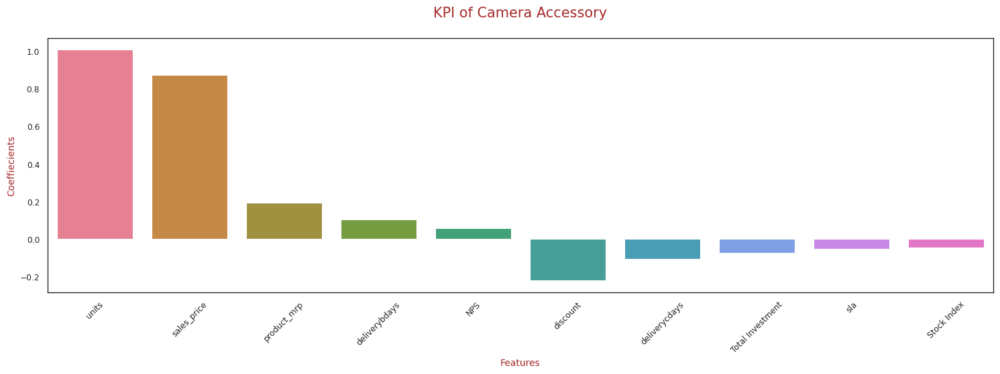

In [430]:
# Plotting the KPI
cam = pd.concat([cam_p,cam_n], axis=0)
cam.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=cam, estimator=np.sum)
plt.title("KPI of Camera Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

Gaming Accessory

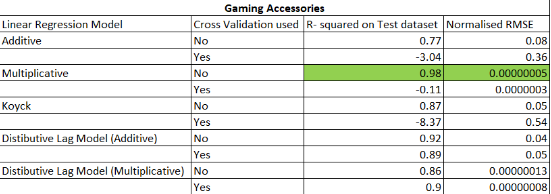

In [431]:

# Top 5 postively correlated KPI

game_p = gamingaccessory_mul_lr_coef_df.iloc[:5,:]
game_p


,Features,Coefficients
1,units,0.456
13,product_vertical_GamePad,0.385
9,luxuary_product,0.342
22,product_vertical_GamingMouse,0.326
20,product_vertical_GamingKeyboard,0.279


In [432]:
# Top 5 negatively correlated KPI

game_n = gamingaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
game_n


,Features,Coefficients
16,product_vertical_GamingAdapter,-0.184
33,TV,-0.171
15,product_vertical_GamingAccessoryKit,-0.145
42,NPS,-0.098
21,product_vertical_GamingMemoryCard,-0.096


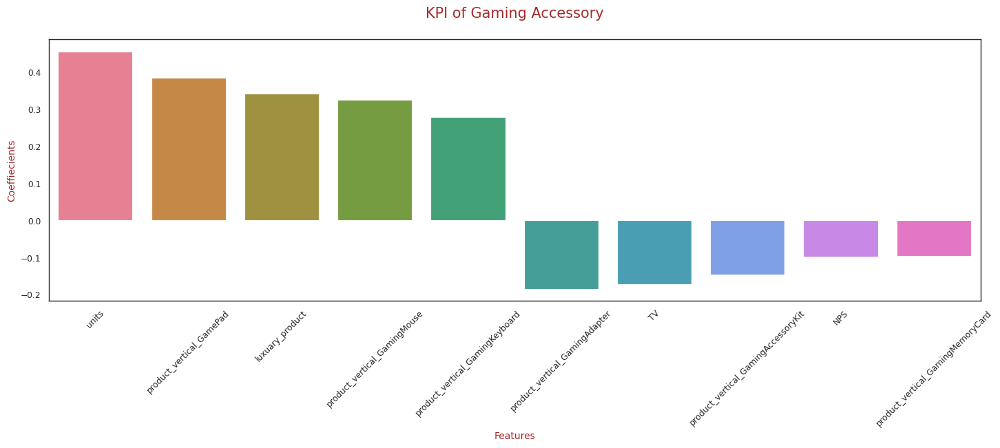

In [433]:
# Plotting the KPI
game = pd.concat([game_p,game_n], axis=0)
game.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=game, estimator=np.sum)
plt.title("KPI of Gaming Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

Home Audio

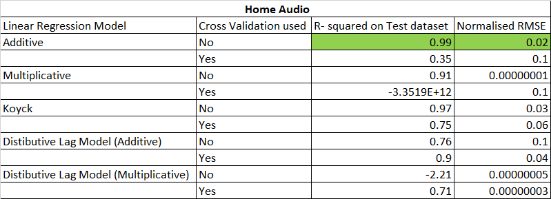

For Camera Accessory we will be slecting the Additive Model as it gives high accuracy than all other models. Let us check the KPI received from this Model.



In [434]:
# Top 5 postively correlated KPI

aud_p = homeaudio_adlr_coef_df.iloc[:5,:]
aud_p



,Features,Coefficients
1,units,472955.656
16,product_vertical_FMRadio,416577.308
18,product_vertical_HomeAudioSpeaker,411993.541
9,luxuary_product,314891.219
24,delivery_status_Early,275211.189


In [435]:

# Top 5 negatively correlated KPI

aud_n = homeaudio_adlr_coef_df.iloc[-1:-6:-1,:]
aud_n

,Features,Coefficients
11,cod,-150103.242
43,Heat Deg Days (°C),-121471.833
14,product_vertical_Dock,-121068.040
41,Min Temp (°C),-113910.442
8,product_procurement_sla,-105851.290


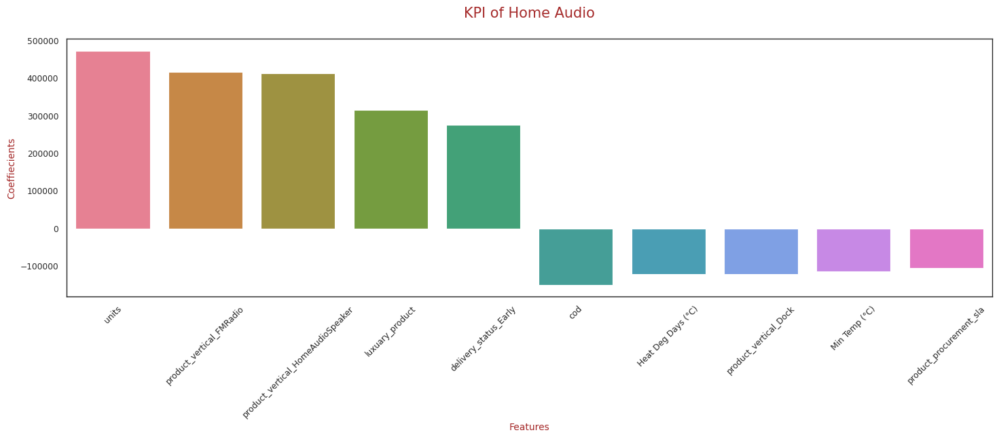

In [436]:
# Plotting the KPI
aud = pd.concat([aud_p,aud_n], axis=0)
aud.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=aud, estimator=np.sum)
plt.title("KPI of Home Audio\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

From the above Models we can follow that:

1.There are interactions between KPIs of Camera Accessory and Gaming Accessory

2.KPI of Home Audio data have an additive respeonse towards the GMV
The multiplicative models tell us about the growth of revenue vs the interactive growth of the KPIs



# Model Evaluation

Residual Analysis


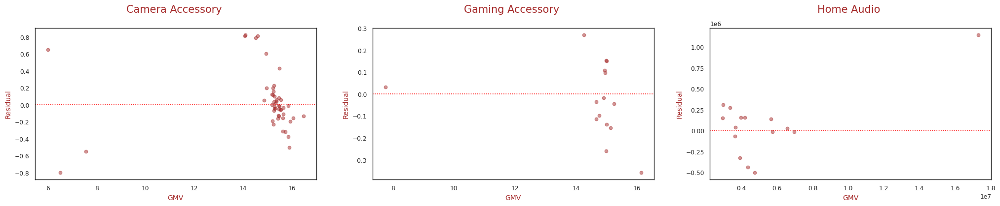

In [437]:
# Residual v/s predictions plot
plt.figure(figsize=[25,4])

plt.subplot(1,3,1)
y_cam_res = y_cameraaccessory_model2_cvdf - cameraaccessory_predictions_mcv
plt.scatter( cameraaccessory_predictions_mcv, y_cam_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Camera Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,2)
y_game_res = y_gamingaccessory_model2_test - y_gamingaccessory_model2_test_pred
plt.scatter( y_gamingaccessory_model2_test_pred, y_game_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Gaming Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,3)
y_aud_res = y_homeaudio_model1_test - y_homeaudio_model1_test_pred
plt.scatter( y_homeaudio_model1_test_pred, y_aud_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Home Audio \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

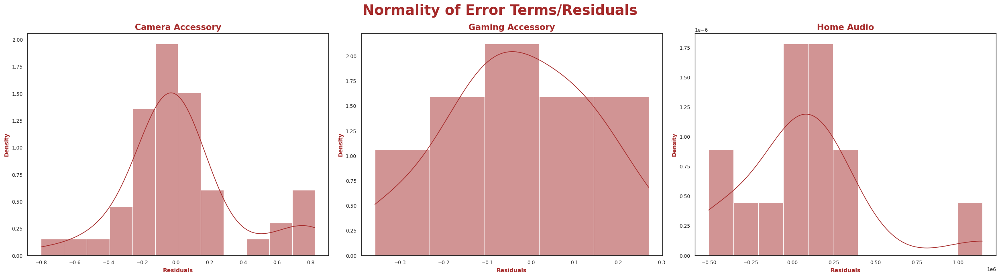

In [440]:
# Distribution of errors
plt.figure(figsize=[25,7])

plt.subplot(1,3,1)
sns.histplot(y_cam_res, kde=True, color="brown", stat="density")
plt.xlabel("Residuals", fontsize=10, fontweight="bold", color="brown")
plt.ylabel("Density", fontsize=10, fontweight="bold", color="brown")
plt.title("Camera Accessory", fontsize=15, fontweight="bold", color="brown")

plt.subplot(1,3,2)
sns.histplot(y_game_res, kde=True, color="brown", stat="density")
plt.xlabel("Residuals", fontsize=10, fontweight="bold", color="brown")
plt.ylabel("Density", fontsize=10, fontweight="bold", color="brown")
plt.title("Gaming Accessory", fontsize=15, fontweight="bold", color="brown")

plt.subplot(1,3,3)
sns.histplot(y_aud_res, kde=True, color="brown", stat="density")
plt.xlabel("Residuals", fontsize=10, fontweight="bold", color="brown")
plt.ylabel("Density", fontsize=10, fontweight="bold", color="brown")
plt.title("Home Audio", fontsize=15, fontweight="bold", color="brown")

plt.suptitle("Normality of Error Terms/Residuals", fontsize=25, fontweight="bold", color="brown")
plt.tight_layout()
plt.show()



From above residual analysis the linear regression assumptions are satified.

1.Error terms are normally distributed

2.Error terma are independent of each other

3.Error terms have constant variance


**Model Equation**

We will selecting top 10 KPIs for each product sub-category (5 highly positive/negative)

The equation for the best fit line for all the three product sub categories is as follows:

Camera Accessory gmv = (0.875 X units) + (0.826 X sales_price) + (0.225 X deliverycdays) + (0.132 X product_vertical_ReflectorUmbrella) + (0.124 X luxuary_product) + (-0.312 X discount ) + (-0.217 X deliverybdays) + (-0.087 X Total Precip (mm) + (-0.056 X product_vertical_CameraRemoteControl) + (-0.048 X sla)

Gaming Accessory gmv = (0.426 X product_vertical_GamePad) + (0.348 X units) + (0.294 X product_vertical_GamingHeadset) + (0.199 X luxuary_product) + (0.139 X product_vertical_GamingAdapter) + (-0.105 X Content Marketing) + (-0.092 X TV) + (-0.090 X Mean Temp (°C) + (-0.065 X product_procurement_sla) + (-0.064 X product_vertical_JoystickGamingWheel)

Home Audio gmv = (867299.674 X product_vertical_HomeAudioSpeaker) + (816468.372 X sales_price) + (802829.222 X discount) + (629291.144 X product_vertical_FMRadio) + (334282.906 X cod) + (-663277.019 X product_mrp) + (-387736.604 X Sponsorship) + (-337136.544 X Stock Index) + (-160880.199 X product_vertical_VoiceRecorder) + (-159545.335 X Affiliates)

**Recommendation**
Camera Accessory:

Product Vertical Reflector Umbrella and luxury products with price above 2000 CAD contribute to high revenue. So, company should look after the availability and marketing of these products.
Customer tend to order products which minimum sla/ delivery days. So, company should check for the product availability in the nearest warehouse of the region from where the orders are high.
During high Precipitation the demand of the camera accessories is low so comapany can provide discount during this period and gain customers.
Gaming Accessory:

Products like Game Pad, Gaming Headset, Gaming Adapter and luxury products contribute to high revenue. So, company should look after the availability and marketing of these products.
During the winter i.e.(low temp) customer prefer to buy more gaming accessories so comapny can increase the sales price according to the demand.
Company should revisit the content marketing stratergies and TV ads as they have negatively impacted the revenue.
Home Audio:

Customer prefer opting for Cash on delivery. Providing discounted on home audio products has affected in high revenue.
Home Audio and FM Radio are product that positively contribute to the revenue whereas Voice Recorder has negative impact on revenue.
Sponsorship and Affiliates have negatively affted the revenue. Also during high stock index the revenue has seen a dip.
